# User Analytics in the Telecommunication Industry 

![Telecommunication Industry](https://www.pakistangulfeconomist.com/wp-content/uploads/2018/11/Booming-mobile-economy-in-Pakistan-and-in-the-world.jpg)

# Importing improtant libraries

In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import describe
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import euclidean_distances
from sklearn.linear_model import LinearRegression
import sqlalchemy
import streamlit as st
import joblib
import docker
import warnings
warnings.filterwarnings("ignore")

In [2]:
TelCom_data = pd.read_excel(r"d:\Users\Admin\Downloads\telcom_data (2).xlsx")

In [3]:
TelCom_data.head()

,Bearer Id,Start,Start ms,End,End ms,Dur. (ms),IMSI,MSISDN/Number,IMEI,Last Location Name,...,Youtube DL (Bytes),Youtube UL (Bytes),Netflix DL (Bytes),Netflix UL (Bytes),Gaming DL (Bytes),Gaming UL (Bytes),Other DL (Bytes),Other UL (Bytes),Total UL (Bytes),Total DL (Bytes)
0,13114483460844900352,2019-04-04 12:01:18,770.0,2019-04-25 14:35:31,662.0,1823652.0,2.082014e+14,3.366496e+10,3.552121e+13,9164566995485190,...,15854611.0,2501332.0,8198936.0,9656251.0,278082303.0,14344150.0,171744450.0,8814393.0,36749741.0,308879636.0
1,13114483482878900224,2019-04-09 13:04:04,235.0,2019-04-25 08:15:48,606.0,1365104.0,2.082019e+14,3.368185e+10,3.579401e+13,L77566A,...,20247395.0,19111729.0,18338413.0,17227132.0,608750074.0,1170709.0,526904238.0,15055145.0,53800391.0,653384965.0
2,13114483484080500736,2019-04-09 17:42:11,1.0,2019-04-25 11:58:13,652.0,1361762.0,2.082003e+14,3.376063e+10,3.528151e+13,D42335A,...,19725661.0,14699576.0,17587794.0,6163408.0,229584621.0,395630.0,410692588.0,4215763.0,27883638.0,279807335.0
3,13114483485442799616,2019-04-10 00:31:25,486.0,2019-04-25 07:36:35,171.0,1321509.0,2.082014e+14,3.375034e+10,3.535661e+13,T21824A,...,21388122.0,15146643.0,13994646.0,1097942.0,799538153.0,10849722.0,749039933.0,12797283.0,43324218.0,846028530.0
4,13114483499480700928,2019-04-12 20:10:23,565.0,2019-04-25 10:40:32,954.0,1089009.0,2.082014e+14,3.369980e+10,3.540701e+13,D88865A,...,15259380.0,18962873.0,17124581.0,415218.0,527707248.0,3529801.0,550709500.0,13910322.0,38542814.0,569138589.0


In [4]:
TelCom_data.tail()

,Bearer Id,Start,Start ms,End,End ms,Dur. (ms),IMSI,MSISDN/Number,IMEI,Last Location Name,...,Youtube DL (Bytes),Youtube UL (Bytes),Netflix DL (Bytes),Netflix UL (Bytes),Gaming DL (Bytes),Gaming UL (Bytes),Other DL (Bytes),Other UL (Bytes),Total UL (Bytes),Total DL (Bytes)
149996,7277825670196679680,2019-04-29 07:28:42,451.0,2019-04-30 06:02:33,214.0,81230.0,2.082022e+14,3.365069e+10,3.548311e+13,D20434A,...,1.619167e+07,1.176343e+07,1.788370e+07,1.967816e+07,5.266097e+08,9.197207e+06,3.264510e+06,1.348742e+07,57628851.0,574175259.0
149997,7349883264234609664,2019-04-29 07:28:42,483.0,2019-04-30 10:41:33,187.0,97970.0,2.082019e+14,3.366345e+10,3.566051e+13,D10223C,...,1.387723e+07,8.288284e+06,1.935015e+07,2.129315e+07,6.268931e+08,4.735033e+06,7.121804e+08,2.457758e+06,39135081.0,666648844.0
149998,13114483573367300096,2019-04-29 07:28:43,283.0,2019-04-30 10:46:12,810.0,98249.0,2.082017e+14,3.362189e+10,3.572121e+13,T51102A,...,2.266051e+07,1.855903e+06,9.963942e+06,5.065760e+06,5.535395e+08,1.339432e+07,1.211009e+08,1.131473e+07,34912224.0,592786405.0
149999,13114483573367300096,2019-04-29 07:28:43,696.0,2019-04-30 10:40:34,327.0,97910.0,2.082021e+14,3.361962e+10,8.618620e+13,L88342B,...,8.817106e+06,8.305402e+06,3.322253e+06,1.317259e+07,3.525370e+08,2.529475e+06,8.147131e+08,1.406930e+06,29626096.0,371895920.0
150000,,NaT,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,...,1.163407e+07,1.100941e+07,1.162685e+07,1.100175e+07,4.220447e+08,8.288398e+06,4.211005e+08,8.264799e+06,NaN,NaN


# Logger file:

In [5]:
import logging

# Configure the basic settings for logging
logging.basicConfig(
    filename='log_file.log',
    format='%(asctime)s | %(levelname)-7s | %(message)s',
    filemode='a'  # Append mode
)

# Get the default logger
logger = logging.getLogger()

# Set the logging level
logger.setLevel(logging.DEBUG)

# Example log messages
logger.debug("debug Message")
logger.info("log code information")
logger.warning("warning message")
logger.error("error message")
logger.critical("critical message")


In [6]:
# Describe all relevant variables and associated data types
TelCom_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150001 entries, 0 to 150000
Data columns (total 55 columns):
 #   Column                                    Non-Null Count   Dtype         
---  ------                                    --------------   -----         
 0   Bearer Id                                 150001 non-null  object        
 1   Start                                     150000 non-null  datetime64[ns]
 2   Start ms                                  150000 non-null  float64       
 3   End                                       150000 non-null  datetime64[ns]
 4   End ms                                    150000 non-null  float64       
 5   Dur. (ms)                                 150000 non-null  float64       
 6   IMSI                                      149431 non-null  float64       
 7   MSISDN/Number                             148935 non-null  float64       
 8   IMEI                                      149429 non-null  float64       
 9   Last Location N

### Data Overview
 **Size**: The dataset contains 150,001 entries and 55 columns.
 **Data Types**:
   - `datetime64[ns]`: 2 columns (Start, End) related to timestamps.
   - `float64`: 49 columns primarily capturing numerical data such as traffic volumes and performance metrics.
   - `object`: 4 columns likely containing categorical or identification data.
1. **Network Performance**:
   - Identify regions or time periods with high latency or low throughput.
2. **Customer Behavior**:
   - Examine usage patterns across social media, streaming, gaming, etc.
3. **Device Insights**:
   - Profile handset manufacturers and types with the highest data usage.
4. **Trend Analysis**:
   - Observe traffic shifts in different data tiers over time.
- **Purpose**: Analyze network performance, user behavior, and device insights using the provided telecom dataset.
- **Key Metrics**: Includes download/upload speeds, latency, app-specific traffic (social media, YouTube, Netflix), and activity durations.
- **Opportunities**: Identify patterns in user preferences, device usage, and potential areas for improving network quality.
- **Challenges**: Missing data in some columns requires preprocessing.


In [7]:
TelCom_data.describe()

,Start,Start ms,End,End ms,Dur. (ms),IMSI,MSISDN/Number,IMEI,Avg RTT DL (ms),Avg RTT UL (ms),...,Youtube DL (Bytes),Youtube UL (Bytes),Netflix DL (Bytes),Netflix UL (Bytes),Gaming DL (Bytes),Gaming UL (Bytes),Other DL (Bytes),Other UL (Bytes),Total UL (Bytes),Total DL (Bytes)
count,150000,150000.000000,150000,150000.000000,1.500000e+05,1.494310e+05,1.489350e+05,1.494290e+05,122172.000000,122189.000000,...,1.500010e+05,1.500010e+05,1.500010e+05,1.500010e+05,1.500010e+05,1.500010e+05,1.500010e+05,1.500010e+05,1.500000e+05,1.500000e+05
mean,2019-04-26 12:36:38.953740032,499.188200,2019-04-27 17:40:08.059673344,498.800880,1.046086e+05,2.082016e+14,4.188282e+10,4.847455e+13,109.795706,17.662883,...,1.163407e+07,1.100941e+07,1.162685e+07,1.100175e+07,4.220447e+08,8.288398e+06,4.211005e+08,8.264799e+06,4.112121e+07,4.546434e+08
min,2019-04-04 12:01:18,0.000000,2019-04-24 22:59:58,0.000000,7.142000e+03,2.040471e+14,3.360100e+10,4.400152e+11,0.000000,0.000000,...,5.300000e+01,1.050000e+02,4.200000e+01,3.500000e+01,2.516000e+03,5.900000e+01,3.290000e+03,1.480000e+02,2.866892e+06,7.114041e+06
25%,2019-04-25 00:26:00.750000128,250.000000,2019-04-26 07:30:11.500000,251.000000,5.744050e+04,2.082014e+14,3.365130e+10,3.546071e+13,32.000000,2.000000,...,5.833501e+06,5.517965e+06,5.777156e+06,5.475981e+06,2.104733e+08,4.128476e+06,2.101869e+08,4.145943e+06,3.322201e+07,2.431068e+08
50%,2019-04-26 08:51:24.500000,499.000000,2019-04-27 23:02:05,500.000000,8.639900e+04,2.082015e+14,3.366371e+10,3.572201e+13,45.000000,5.000000,...,1.161602e+07,1.101345e+07,1.164222e+07,1.099638e+07,4.234081e+08,8.291208e+06,4.218030e+08,8.267071e+06,4.114331e+07,4.558411e+08
75%,2019-04-27 18:18:59.750000128,749.000000,2019-04-29 07:15:07.500000,750.000000,1.324302e+05,2.082018e+14,3.368349e+10,8.611970e+13,70.000000,15.000000,...,1.744852e+07,1.651556e+07,1.747048e+07,1.650727e+07,6.331742e+08,1.243162e+07,6.316918e+08,1.238415e+07,4.903424e+07,6.657055e+08
max,2019-04-29 07:28:43,999.000000,2019-04-30 23:59:27,999.000000,1.859336e+06,2.140743e+14,8.823971e+14,9.900120e+13,96923.000000,7120.000000,...,2.325910e+07,2.201196e+07,2.325919e+07,2.201196e+07,8.434419e+08,1.655879e+07,8.434425e+08,1.655882e+07,7.833131e+07,9.029696e+08
std,NaN,288.611834,NaN,288.097653,8.103762e+04,2.148809e+10,2.447443e+12,2.241637e+13,619.782739,84.793524,...,6.710569e+06,6.345423e+06,6.725218e+06,6.359490e+06,2.439675e+08,4.782700e+06,2.432050e+08,4.769004e+06,1.127639e+07,2.441429e+08


# Insights from the statistical Data:

1. **Duration & Timing**:
   - Data spans between April 4 and April 30, 2019.
   - Average duration of events is ~104,608 ms.

2. **Device Info**:
   - Wide range of IMSI, MSISDN/Number, and IMEI values—highlighting diverse device usage.

3. **Network Latency**:
   - Average round-trip times (RTT): ~110 ms for downloads and ~18 ms for uploads.
   - RTT variance indicates performance fluctuations.

4. **Traffic Insights**:
   - YouTube, Netflix, and Gaming show significant data volumes—major contributors to overall traffic.
   - Total download bytes are substantially higher than upload bytes.

5. **Distribution**:
   - Median values show consistency in metrics like RTT and data volumes across entries.
   - Maximum values reveal peak performance and traffic extremes.

6. **Challenges**:
   - Presence of null values requires preprocessing for accurate analysis.

# checking missing values:

In [8]:
TelCom_data.isnull().sum()

Bearer Id                                        0
Start                                            1
Start ms                                         1
End                                              1
End ms                                           1
Dur. (ms)                                        1
IMSI                                           570
MSISDN/Number                                 1066
IMEI                                           572
Last Location Name                            1153
Avg RTT DL (ms)                              27829
Avg RTT UL (ms)                              27812
Avg Bearer TP DL (kbps)                          1
Avg Bearer TP UL (kbps)                          1
TCP DL Retrans. Vol (Bytes)                  88146
TCP UL Retrans. Vol (Bytes)                  96649
DL TP < 50 Kbps (%)                            754
50 Kbps < DL TP < 250 Kbps (%)                 754
250 Kbps < DL TP < 1 Mbps (%)                  754
DL TP > 1 Mbps (%)             

# Insights of Missing values:

1. **Missing Data**:
   - Key metrics like `Avg RTT DL/UL`, `TCP Retransmission Vol`, and `HTTP Traffic` have significant missing values (e.g., ~28,000 missing for RTT and ~88,000+ for TCP).
   - Identification columns (`IMSI`, `MSISDN/Number`, `IMEI`) also contain some gaps.

2. **Consistently Available Metrics**:
   - Columns such as `Social Media`, `Youtube`, `Netflix`, `Gaming`, and `Other Traffic` have no missing values, ensuring solid data for app-specific analyses.
   - Total Download/Upload Bytes have almost complete data, making them reliable for broader traffic analysis.

3. **Data Challenges**:
   - Some performance and activity duration metrics have negligible missing values (1-2 entries), which is easier to handle.
   - Heavy null values in certain sections need preprocessing for actionable insights.

# Task 1 - User Overview Analysis 

In [9]:
# Slide: Describe all relevant variables and associated data types
# Create a table with variable names, data types, and brief descriptions
variable_descriptions = pd.DataFrame({
    'Variable': TelCom_data.columns,
    'Data Type': TelCom_data.dtypes.astype(str)  
})

# Add brief descriptions for each variable 
descriptions = []
for col in TelCom_data.columns:
    # Placeholder description — you can edit each one specifically
    descriptions.append(f'Brief description of the "{col}" variable')

# Add the description column
variable_descriptions['Description'] = descriptions

# Display the table
print(variable_descriptions)


                                                                          Variable  \
Bearer Id                                                                Bearer Id   
Start                                                                        Start   
Start ms                                                                  Start ms   
End                                                                            End   
End ms                                                                      End ms   
Dur. (ms)                                                                Dur. (ms)   
IMSI                                                                          IMSI   
MSISDN/Number                                                        MSISDN/Number   
IMEI                                                                          IMEI   
Last Location Name                                              Last Location Name   
Avg RTT DL (ms)                                       

1. **Structure**:
   - The dataset tracks various metrics, including device identifiers (e.g., IMSI, MSISDN, IMEI), network performance (e.g., RTT, throughput), and app-specific data usage (e.g., YouTube, Netflix, Gaming).

2. **Reliability**:
   - Columns like social media, Google, email, YouTube, Netflix, and gaming data are complete—ideal for focused usage analysis.
   - Device identifiers and network metrics have missing values, which may need cleanup for accurate interpretations.

3. **Opportunities**:
   - Explore app traffic patterns to understand user preferences.
   - Assess latency and throughput data to pinpoint areas for network optimization.

# Determining Mean Median and Mode of Data:

In [10]:
from scipy import stats

# Select only numeric columns
numeric_df = TelCom_data.select_dtypes(include=['number'])

# Mean
mean_val = numeric_df.mean()

# Median
median_val = numeric_df.median()

# Mode (can return multiple modes, we take the first one for simplicity)
mode_val = numeric_df.mode().iloc[0]

# Variance
variance_val = numeric_df.var()

# Display results
print("===== MEAN =====\n", mean_val)
print("\n===== MEDIAN =====\n", median_val)
print("\n===== MODE =====\n", mode_val)
print("\n===== VARIANCE =====\n", variance_val)


===== MEAN =====
 Start ms                                    4.991882e+02
End ms                                      4.988009e+02
Dur. (ms)                                   1.046086e+05
IMSI                                        2.082016e+14
MSISDN/Number                               4.188282e+10
IMEI                                        4.847455e+13
Avg RTT DL (ms)                             1.097957e+02
Avg RTT UL (ms)                             1.766288e+01
Avg Bearer TP DL (kbps)                     1.330005e+04
Avg Bearer TP UL (kbps)                     1.770429e+03
TCP DL Retrans. Vol (Bytes)                 2.080991e+07
TCP UL Retrans. Vol (Bytes)                 7.596587e+05
DL TP < 50 Kbps (%)                         9.284475e+01
50 Kbps < DL TP < 250 Kbps (%)              3.069355e+00
250 Kbps < DL TP < 1 Mbps (%)               1.717341e+00
DL TP > 1 Mbps (%)                          1.609654e+00
UL TP < 10 Kbps (%)                         9.853014e+01
10 Kbps < UL 

# Insights :
1. **Network Stats**: Mean RTT is ~110 ms for downloads and ~18 ms for uploads, showing average latency.
2. **Traffic Insights**: YouTube, Netflix (~11.6 MB each), and Gaming (~422 MB) dominate download traffic; uploads are smaller (~41 MB total).
3. **Speed Distribution**: ~92% of downloads and ~98% of uploads are below 50 Kbps.
4. **Activity Patterns**: HTTP downloads average ~114 MB but vary widely across sessions.

# Determining Std_Dev Skewness and Kutosis of Data:

In [11]:
# Select only numeric columns
numeric_df = TelCom_data.select_dtypes(include=['number'])

# Standard Deviation
std_dev = numeric_df.std()

# Skewness
skewness = numeric_df.skew()

# Kurtosis
kurtosis = numeric_df.kurtosis()

# Display results
print("===== STANDARD DEVIATION =====\n", std_dev)
print("\n===== SKEWNESS =====\n", skewness)
print("\n===== KURTOSIS =====\n", kurtosis)


===== STANDARD DEVIATION =====
 Start ms                                    2.886118e+02
End ms                                      2.880977e+02
Dur. (ms)                                   8.103762e+04
IMSI                                        2.148809e+10
MSISDN/Number                               2.447443e+12
IMEI                                        2.241637e+13
Avg RTT DL (ms)                             6.197827e+02
Avg RTT UL (ms)                             8.479352e+01
Avg Bearer TP DL (kbps)                     2.397188e+04
Avg Bearer TP UL (kbps)                     4.625356e+03
TCP DL Retrans. Vol (Bytes)                 1.825665e+08
TCP UL Retrans. Vol (Bytes)                 2.645305e+07
DL TP < 50 Kbps (%)                         1.303803e+01
50 Kbps < DL TP < 250 Kbps (%)              6.215233e+00
250 Kbps < DL TP < 1 Mbps (%)               4.159538e+00
DL TP > 1 Mbps (%)                          4.828890e+00
UL TP < 10 Kbps (%)                         4.634285e+00

### Statistical Insights :

1. **Standard Deviation**: High variability in metrics like `TCP Retransmission Volumes`, `Gaming Traffic`, and `HTTP Downloads`, suggesting diverse user behavior and network conditions.

2. **Skewness**: Metrics like RTT and throughput are highly skewed, indicating that extreme values (e.g., high delays or speeds) occur but are not typical.

3. **Kurtosis**: High kurtosis in metrics like `HTTP Traffic` and `UL/DL Throughput` shows the presence of significant outliers.

# Describe function of Data
## Non-Graphical Univariate Analysis

In [12]:
# Importance of basic metrics for the global objective
# Explain the significance of each metric in the context of the dataset

# Conduct Non-Graphical Univariate Analysis
dispersion_params = TelCom_data.describe().loc[['mean', 'std', 'min', '25%', '50%', '75%', 'max']]
print(dispersion_params)


                              Start    Start ms  \
mean  2019-04-26 12:36:38.953740032  499.188200   
std                             NaN  288.611834   
min             2019-04-04 12:01:18    0.000000   
25%   2019-04-25 00:26:00.750000128  250.000000   
50%      2019-04-26 08:51:24.500000  499.000000   
75%   2019-04-27 18:18:59.750000128  749.000000   
max             2019-04-29 07:28:43  999.000000   

                                End      End ms     Dur. (ms)          IMSI  \
mean  2019-04-27 17:40:08.059673344  498.800880  1.046086e+05  2.082016e+14   
std                             NaN  288.097653  8.103762e+04  2.148809e+10   
min             2019-04-24 22:59:58    0.000000  7.142000e+03  2.040471e+14   
25%      2019-04-26 07:30:11.500000  251.000000  5.744050e+04  2.082014e+14   
50%             2019-04-27 23:02:05  500.000000  8.639900e+04  2.082015e+14   
75%      2019-04-29 07:15:07.500000  750.000000  1.324302e+05  2.082018e+14   
max             2019-04-30 23:59:27  9

### Insights of Non-graphical analysis:

1. **Event Durations**: Average session duration is ~104,608 ms, with significant variability (max ~1.86 million ms). Median session duration is ~86,399 ms, indicating consistency.

2. **Traffic Patterns**: YouTube, Netflix, and Gaming dominate download traffic, with averages of ~11 MB, ~422 MB, and ~421 MB, respectively.

3. **Latency**: RTT for downloads averages ~110 ms, with extreme values reaching up to 96,923 ms, reflecting variability in network performance.

# Conducting Graphical Univariate Analysis using Hist + KDE plots

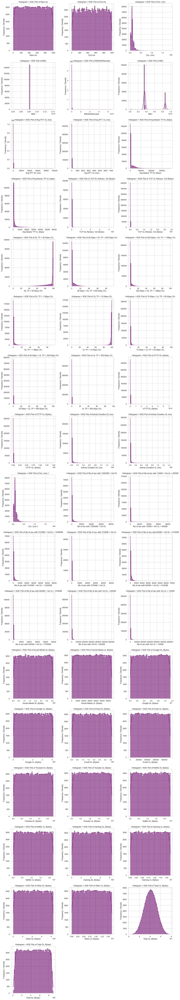

In [13]:
# Interpretation of dispersion parameters
# Discuss the implications of each parameter on the dataset
sns.set(style="whitegrid")
numeric_cols = TelCom_data.select_dtypes(include=[np.number]).columns

# Determine number of rows and columns for subplots
n_cols = 3  # Number of plots per row
n_rows = int(np.ceil(len(numeric_cols) / n_cols))  # Calculate rows needed

# Create a figure with subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 5))
axes = axes.flatten()  # Flatten axes for easier iteration

# Iterate through columns and create plots
for i, col in enumerate(numeric_cols):
    sns.histplot(data=TelCom_data, x=col, kde=True, bins=50, color='purple', edgecolor='black', ax=axes[i])
    axes[i].set_title(f'Histogram + KDE Plot of {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency / Density')

# Remove empty subplots if any
for j in range(len(numeric_cols), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()



# **Data Distribution & Skewness Insights**

#### **Highly Skewed Features (Right/Positive Skew)**
Most features are heavily **right-skewed**, indicating:
- **Long tails and extreme values (outliers)**
- **Potential need for log transformation or normalization**
#### **Uniform or Near-Uniform Distributions**
These might not add much predictive power in raw form:
- `Other DL/UL`, `Total DL`
  - Almost flat histograms → likely uniformly distributed
  - Minimal variance

#### **Multimodal Distributions**
- `IMEI`: Displays distinct spikes → potential indicator of categorical behavior or repeated values (e.g., device types)
- `MSISDN/Number`: Also spiked, possibly ID-like column

####  **Normally Distributed Feature**
- `Total UL (Bytes)`:
  - Appears approximately normal (bell-shaped)
  - Could be useful in linear modeling without transformation

# PCA

In [14]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Step 1: Select numeric columns
numeric_df = TelCom_data.select_dtypes(include=['number'])

# Step 2: Impute missing values using mean strategy
imputer = SimpleImputer(strategy='mean')
imputed_data = imputer.fit_transform(numeric_df)

# Step 3: Standardize the data (zero mean, unit variance)
scaler = StandardScaler()
scaled_data = scaler.fit_transform(imputed_data)

# Step 4: Apply PCA (retain all components)
pca = PCA(n_components=None)
pca.fit(scaled_data)

# Step 5: Display results
print("===== Explained Variance Ratio =====")
print(pca.explained_variance_ratio_)

print("\n===== PCA Components =====")
print(pca.components_)


===== Explained Variance Ratio =====
[1.53386287e-01 6.01981349e-02 5.02104285e-02 4.08640504e-02
 4.06770740e-02 3.56841465e-02 3.44102905e-02 3.22945210e-02
 2.98600794e-02 2.85706743e-02 2.32482141e-02 2.28870476e-02
 2.08228142e-02 2.06958370e-02 2.06252475e-02 2.06100154e-02
 2.05445200e-02 2.04801757e-02 2.04356787e-02 2.03838244e-02
 2.03684059e-02 2.02950502e-02 2.02435614e-02 2.01739585e-02
 2.01517582e-02 2.00170122e-02 1.90289330e-02 1.79161989e-02
 1.55196735e-02 1.49629178e-02 1.42751137e-02 1.26249274e-02
 1.08421026e-02 1.05651481e-02 9.70808990e-03 7.80235203e-03
 7.01143181e-03 5.84073784e-03 5.62829435e-03 3.60119439e-03
 3.15042303e-03 1.64677343e-03 1.30152549e-03 3.36577906e-04
 8.02127386e-05 1.85647292e-05 1.52987175e-13 0.00000000e+00
 0.00000000e+00]

===== PCA Components =====
[[ 5.64598970e-05  6.23527630e-04 -5.63583992e-02 ...  6.08594681e-04
   1.24149878e-03 -9.53914862e-04]
 [-6.29933375e-04 -1.57115282e-03  8.80930729e-02 ... -7.49335005e-04
  -5.841733


### ** Insights of Variance Ratio **

- **Top 1 component** explains **~15.34%** of the variance.
- **Top 10 components** together explain **~56%**.
- **Top 25 components** account for **~89%**, which is strong.
- After ~30 components, the explained variance per component **drops significantly** (below 2%).
- The last few components explain **near-zero variance** (numerical noise or redundancy).

> **Recommendation**: Retain **~25–30 components** for a good balance of dimensionality reduction and information preservation.

## Standardizing Numerical data:

In [15]:
# Step 1: Select numeric columns and drop rows with missing values
cleaned_df = TelCom_data.select_dtypes(include=['number']).dropna()

# Step 2: Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(cleaned_df)

# Step 3: Apply PCA
pca = PCA()
pca.fit(scaled_data)

PCA()

In [16]:
# Four bullet points summarizing the PCA results
print("• The first principal component explains {:.2f}% of the variance."
      .format(pca.explained_variance_ratio_[0] * 100))

print("• The second principal component explains {:.2f}% of the variance."
      .format(pca.explained_variance_ratio_[1] * 100))

# Get feature names
feature_names = TelCom_data.select_dtypes(include=['number']).dropna().columns

# Top contributing features to PC1
top_features_pc1 = [feature_names[i] for i in pca.components_[0].argsort()[-3:][::-1]]
print("• The top features contributing to the first principal component are:", top_features_pc1)

# Top contributing features to PC2
top_features_pc2 = [feature_names[i] for i in pca.components_[1].argsort()[-3:][::-1]]
print("• The top features contributing to the second principal component are:", top_features_pc2)


• The first principal component explains 13.49% of the variance.
• The second principal component explains 7.06% of the variance.
• The top features contributing to the first principal component are: ['Activity Duration DL (ms)', 'Activity Duration UL (ms)', 'Nb of sec with 125000B < Vol DL']
• The top features contributing to the second principal component are: ['UL TP < 10 Kbps (%)', '250 Kbps < DL TP < 1 Mbps (%)', 'Nb of sec with 31250B < Vol DL < 125000B']


### **Principal Component Insights**
#### 🔹 **Principal Component 1 (PC1)**  
- **Explains:** **13.49%** of the total variance  
- **Top contributing features:**
  - **Activity Duration DL (ms)**  
  - **Activity Duration UL (ms)**  
  - **Nb of sec with 125000B < Vol DL**

#### 🔹 **Principal Component 2 (PC2)**  
- **Explains:** **7.06%** of the total variance  
- **Top contributing features:**
  - **UL TP < 10 Kbps (%)**  
  - **250 Kbps < DL TP < 1 Mbps (%)**  
- PC1 and PC2 together explain **~20.55%** of the total variance.
- Their top features hint at **distinct usage patterns**:  
  - PC1: **User activity & volume**
  - PC2: **Network quality & performance**


## Exploratory Data Analysis

## Checking and Treating Missing values

In [17]:
#Create function for Overall Mising Value in percetange

def percent_miss(TelCom_data):
    #Calculating total number of cells in dataframe
    total_cells=np.product(TelCom_data.shape)
    
    #count the number of missing values per column
    missingcount=TelCom_data.isnull().sum()
    
    #calculate the total number of missing valies
    totalmissing = missingcount.sum()
    
    #Calculate the Percentage of missing value
    
    print('The Telecome dataset have contais: ', round((totalmissing/total_cells)*100,2),"%", "Mising Values")
    
percent_miss(TelCom_data)

The Telecome dataset have contais:  12.49 % Mising Values


In [18]:
# Total Missing percentage of Each Features
nul_percentage=TelCom_data.isnull().sum()/len(TelCom_data)*100
nul_percentage

Bearer Id                                    0.000000
Start                                        0.000667
Start ms                                     0.000667
End                                          0.000667
End ms                                       0.000667
Dur. (ms)                                    0.000667
IMSI                                         0.379997
MSISDN/Number                                0.710662
IMEI                                         0.381331
Last Location Name                           0.768662
Avg RTT DL (ms)                             18.552543
Avg RTT UL (ms)                             18.541210
Avg Bearer TP DL (kbps)                      0.000667
Avg Bearer TP UL (kbps)                      0.000667
TCP DL Retrans. Vol (Bytes)                 58.763608
TCP UL Retrans. Vol (Bytes)                 64.432237
DL TP < 50 Kbps (%)                          0.502663
50 Kbps < DL TP < 250 Kbps (%)               0.502663
250 Kbps < DL TP < 1 Mbps (%

In [19]:
#Drop the features if percentage greather than 50% missing value

def drop_na(TelCom_data, max_percent):
    
    # Calculate the percentage value on each features
    nul_percentage=TelCom_data.isnull().sum()/len(TelCom_data)*100
    cal_feature=nul_percentage[nul_percentage>max_percent].index
    
    # Drop the null Features from dataframe
    drop_feature=TelCom_data.drop(columns=cal_feature)

    # print info about dropped columns or features
    print(f"Dropped columns with null percentage > {max_percent}%: {list(cal_feature)}")
    return drop_feature

# Print the result with new dataset "filtere_data"
filtered_data=drop_na(TelCom_data,55)

Dropped columns with null percentage > 55%: ['TCP DL Retrans. Vol (Bytes)', 'TCP UL Retrans. Vol (Bytes)', 'Nb of sec with 125000B < Vol DL', 'Nb of sec with 1250B < Vol UL < 6250B', 'Nb of sec with 31250B < Vol DL < 125000B', 'Nb of sec with 37500B < Vol UL', 'Nb of sec with 6250B < Vol DL < 31250B', 'Nb of sec with 6250B < Vol UL < 37500B']


In [20]:
# Total Missing percentage of Each Features
nul_percentage=filtered_data.isnull().sum()/len(TelCom_data)*100
nul_percentage

Bearer Id                          0.000000
Start                              0.000667
Start ms                           0.000667
End                                0.000667
End ms                             0.000667
Dur. (ms)                          0.000667
IMSI                               0.379997
MSISDN/Number                      0.710662
IMEI                               0.381331
Last Location Name                 0.768662
Avg RTT DL (ms)                   18.552543
Avg RTT UL (ms)                   18.541210
Avg Bearer TP DL (kbps)            0.000667
Avg Bearer TP UL (kbps)            0.000667
DL TP < 50 Kbps (%)                0.502663
50 Kbps < DL TP < 250 Kbps (%)     0.502663
250 Kbps < DL TP < 1 Mbps (%)      0.502663
DL TP > 1 Mbps (%)                 0.502663
UL TP < 10 Kbps (%)                0.527996
10 Kbps < UL TP < 50 Kbps (%)      0.527996
50 Kbps < UL TP < 300 Kbps (%)     0.527996
UL TP > 300 Kbps (%)               0.527996
HTTP DL (Bytes)                 

In [21]:
# checked total number missing value
filtered_data.isnull().sum()

Bearer Id                             0
Start                                 1
Start ms                              1
End                                   1
End ms                                1
Dur. (ms)                             1
IMSI                                570
MSISDN/Number                      1066
IMEI                                572
Last Location Name                 1153
Avg RTT DL (ms)                   27829
Avg RTT UL (ms)                   27812
Avg Bearer TP DL (kbps)               1
Avg Bearer TP UL (kbps)               1
DL TP < 50 Kbps (%)                 754
50 Kbps < DL TP < 250 Kbps (%)      754
250 Kbps < DL TP < 1 Mbps (%)       754
DL TP > 1 Mbps (%)                  754
UL TP < 10 Kbps (%)                 792
10 Kbps < UL TP < 50 Kbps (%)       792
50 Kbps < UL TP < 300 Kbps (%)      792
UL TP > 300 Kbps (%)                792
HTTP DL (Bytes)                   81474
HTTP UL (Bytes)                   81810
Activity Duration DL (ms)             1


In [22]:
#Create fuction to fill data type 

# Filling missing calues ith ffill method for all columns (except Bearer Id, Last Location Name, Handset Manufacturer, Handset Type)

def fix_missing_ffill(TelCom_data, col):
  TelCom_data[col] = TelCom_data[col].fillna(method = 'ffill')
  return TelCom_data[col]

def fix_missing_bfill(TelCom_data, col):
  TelCom_data[col] = TelCom_data[col].fillna(method = 'bfill')
  return TelCom_data[col]

In [23]:
# ffill and bfill method use to fill the missing cell value. 
filtered_data['Start']=fix_missing_ffill(filtered_data,'Start')
filtered_data['Start ms']=fix_missing_ffill(filtered_data,'Start ms')
filtered_data['End']=fix_missing_ffill(filtered_data,'End')
filtered_data['End ms']=fix_missing_ffill(filtered_data,'End ms')
filtered_data['Dur. (ms)']=fix_missing_ffill(filtered_data,'Dur. (ms)')
filtered_data['IMSI']=fix_missing_ffill(filtered_data,'IMSI')
filtered_data['MSISDN/Number']=fix_missing_ffill(filtered_data,'MSISDN/Number')
filtered_data['IMEI']=fix_missing_ffill(filtered_data,'IMEI')
filtered_data['Avg RTT DL (ms)']=fix_missing_ffill(filtered_data,'Avg RTT DL (ms)')
filtered_data['Avg RTT UL (ms)']=fix_missing_ffill(filtered_data,'Avg RTT UL (ms)')
filtered_data['Avg Bearer TP DL (kbps)']=fix_missing_ffill(filtered_data,'Avg Bearer TP DL (kbps)')
filtered_data['Avg Bearer TP UL (kbps)']=fix_missing_ffill(filtered_data,'Avg Bearer TP UL (kbps)')
filtered_data['DL TP < 50 Kbps (%)']=fix_missing_ffill(filtered_data,'DL TP < 50 Kbps (%)')
filtered_data['50 Kbps < DL TP < 250 Kbps (%)']=fix_missing_ffill(filtered_data,'50 Kbps < DL TP < 250 Kbps (%)')
filtered_data['250 Kbps < DL TP < 1 Mbps (%)']=fix_missing_ffill(filtered_data,'250 Kbps < DL TP < 1 Mbps (%)')
filtered_data['DL TP > 1 Mbps (%)']=fix_missing_ffill(filtered_data,'DL TP > 1 Mbps (%)')
filtered_data['UL TP < 10 Kbps (%)']=fix_missing_ffill(filtered_data,'UL TP < 10 Kbps (%)')
filtered_data['10 Kbps < UL TP < 50 Kbps (%)']=fix_missing_ffill(filtered_data,'10 Kbps < UL TP < 50 Kbps (%)')
filtered_data['50 Kbps < UL TP < 300 Kbps (%)']=fix_missing_ffill(filtered_data,'50 Kbps < UL TP < 300 Kbps (%)')
filtered_data['UL TP > 300 Kbps (%)']=fix_missing_ffill(filtered_data,'UL TP > 300 Kbps (%)')
filtered_data['HTTP DL (Bytes)']=fix_missing_ffill(filtered_data,'HTTP DL (Bytes)')
filtered_data['HTTP UL (Bytes)']=fix_missing_ffill(filtered_data,'HTTP UL (Bytes)')
filtered_data['Activity Duration DL (ms)']=fix_missing_ffill(filtered_data,'Activity Duration DL (ms)')
filtered_data['Activity Duration UL (ms)']=fix_missing_ffill(filtered_data,'Activity Duration UL (ms)')
filtered_data['Dur. (ms).1']=fix_missing_ffill(filtered_data,'Dur. (ms).1')
filtered_data['Nb of sec with Vol DL < 6250B']=fix_missing_ffill(filtered_data,'Nb of sec with Vol DL < 6250B')
filtered_data['Nb of sec with Vol UL < 1250B']=fix_missing_ffill(filtered_data,'Nb of sec with Vol UL < 1250B')
filtered_data['Total UL (Bytes)']=fix_missing_ffill(filtered_data,'Total UL (Bytes)')
filtered_data['Total DL (Bytes))']=fix_missing_ffill(filtered_data,'Total DL (Bytes)')

In [24]:
# Using mode and mean to file the below missing value
#Mode:
filtered_data['Last Location Name'] = filtered_data['Last Location Name'].fillna(filtered_data['Last Location Name'].mode()[0])
filtered_data['Handset Manufacturer'] = filtered_data['Handset Manufacturer'].fillna(filtered_data['Handset Manufacturer'].mode()[0])
filtered_data['Handset Type'] = filtered_data['Handset Type'].fillna(filtered_data['Handset Type'].mode()[0])

#Mean:
filtered_data['HTTP DL (Bytes)'] = filtered_data['HTTP DL (Bytes)'].fillna(filtered_data['HTTP DL (Bytes)'].mean())
filtered_data['HTTP UL (Bytes)'] = filtered_data['HTTP UL (Bytes)'].fillna(filtered_data['HTTP UL (Bytes)'].mean())

In [25]:
#Copy the filled missing data in below dataset
cleaned_data=filtered_data.copy()

In [26]:
#Checked missing value again after filling value
cleaned_data.isnull().sum()

Bearer Id                         0
Start                             0
Start ms                          0
End                               0
End ms                            0
Dur. (ms)                         0
IMSI                              0
MSISDN/Number                     0
IMEI                              0
Last Location Name                0
Avg RTT DL (ms)                   0
Avg RTT UL (ms)                   0
Avg Bearer TP DL (kbps)           0
Avg Bearer TP UL (kbps)           0
DL TP < 50 Kbps (%)               0
50 Kbps < DL TP < 250 Kbps (%)    0
250 Kbps < DL TP < 1 Mbps (%)     0
DL TP > 1 Mbps (%)                0
UL TP < 10 Kbps (%)               0
10 Kbps < UL TP < 50 Kbps (%)     0
50 Kbps < UL TP < 300 Kbps (%)    0
UL TP > 300 Kbps (%)              0
HTTP DL (Bytes)                   0
HTTP UL (Bytes)                   0
Activity Duration DL (ms)         0
Activity Duration UL (ms)         0
Dur. (ms).1                       0
Handset Manufacturer        

## Checking Outliers:

In [27]:
# Detect outliers using zscore method
from scipy.stats import zscore

def check_outliers(TelCom_data, columns, threshold=3):
    
    outliers_info = {}

    for col in columns:
        # Calculate Z-scores
        z_scores = zscore(TelCom_data[col])

        # Identify outliers using the Z-score threshold
        outliers = TelCom_data[(z_scores > threshold) | (z_scores < -threshold)]

        # Save outlier information in the dictionary
        if not outliers.empty:
            outliers_info[col] = {
                'outliers_count': len(outliers),
                'outliers_indices': outliers.index.tolist()
            }

    return outliers_info

# Example usage:
# Assuming 'your_dataframe' is your DataFrame and ['column1', 'column2'] are the columns to check
# Adjust the columns and DataFrame accordingly
outliers_result = check_outliers(cleaned_data, ['Start ms', 'End ms', 'Dur. (ms)', 'Avg RTT DL (ms)', 'Avg RTT UL (ms)', 'Avg Bearer TP DL (kbps)', 'Avg Bearer TP UL (kbps)', 'DL TP < 50 Kbps (%)', '50 Kbps < DL TP < 250 Kbps (%)', '250 Kbps < DL TP < 1 Mbps (%)', 'DL TP > 1 Mbps (%)', 'UL TP < 10 Kbps (%)', '10 Kbps < UL TP < 50 Kbps (%)', '50 Kbps < UL TP < 300 Kbps (%)', 'UL TP > 300 Kbps (%)', 'HTTP DL (Bytes)', 'HTTP UL (Bytes)', 'Activity Duration DL (ms)', 'Activity Duration UL (ms)', 'Dur. (ms).1', 'Nb of sec with Vol DL < 6250B', 'Nb of sec with Vol UL < 1250B', 'Social Media DL (Bytes)', 'Social Media UL (Bytes)', 'Google DL (Bytes)', 'Google UL (Bytes)', 'Email DL (Bytes)', 'Email UL (Bytes)', 'Youtube DL (Bytes)', 'Youtube UL (Bytes)', 'Netflix DL (Bytes)', 'Netflix UL (Bytes)', 'Gaming DL (Bytes)', 'Gaming UL (Bytes)', 'Other DL (Bytes)', 'Other UL (Bytes)', 'Total UL (Bytes)', 'Total DL (Bytes)', 'Total DL (Bytes))'])

# Display the results
for col, info in outliers_result.items():
    print(f"Outliers in '{col}':")
    print(f"Count: {info['outliers_count']}")
    print(f"Indices: {info['outliers_indices']}")
    print("\n")


Outliers in 'Dur. (ms)':
Count: 2214
Indices: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 63, 64, 76, 77, 25000, 25001, 25002, 25003, 25004, 25005, 25006, 25007, 25008, 25009, 25010, 25011, 25012, 25013, 25014, 25015, 25016, 25017, 25018, 25019, 25020, 25021, 25022, 25023, 25024, 25025, 25026, 25027, 25028, 25029, 25030, 25031, 25032, 25033, 25034, 25035, 25036, 25037, 25038, 25039, 25040, 25041, 25042, 25043, 25044, 25045, 25046, 25047, 25048, 25049, 25050, 25051, 25052, 25053, 25054, 25055, 25056, 25057, 25058, 25059, 25060, 25061, 25062, 25063, 25064, 25065, 25066, 25067, 25068, 25069, 25070, 25071, 25072, 25073, 25074, 25075, 25076, 25077, 25078, 25079, 25080, 25081, 25082, 25083, 25084, 25085, 25086, 25087, 25088, 25089, 25090, 25091, 25092, 25093, 25094, 25095, 25096, 25097, 25098, 25099,

In [28]:
import pandas as pd
from scipy.stats import zscore

def floor_cap_outliers(TelCom_data, column, floor_value=None, cap_value=None, zscore_threshold=3):
    """
    Floor and cap outliers in a specified column of a DataFrame.

    Parameters:
    - column: Column name to floor and cap outliers
    - floor_value: Minimum allowed value for the column (None if no floor)
    - cap_value: Maximum allowed value for the column (None if no cap)
    - zscore_threshold: Z-score threshold for identifying outliers

    Returns:
    - DataFrame with outliers floored and capped in the specified column
    """
    # Calculate Z-scores
    z_scores = zscore(TelCom_data[column])

    # Identify outliers using the Z-score threshold
    outliers = TelCom_data[(z_scores > zscore_threshold) | (z_scores < -zscore_threshold)]

    # Floor and cap outliers based on the calculated limits
    if floor_value is not None:
        TelCom_data[column] = TelCom_data[column].apply(lambda x: floor_value if x < floor_value else x)

    if cap_value is not None:
        TelCom_data[column] = TelCom_data[column].apply(lambda x: cap_value if x > cap_value else x)

    return TelCom_data

# Function to calculate lower and upper limits for each column
def calculate_limits(TelCom_data, columns, lower_quantile=0.01, upper_quantile=0.99):
    """
    Calculate lower and upper limits for specified columns based on quantiles.

    Parameters:
    - columns: List of column names to calculate limits for
    - lower_quantile: Lower quantile for flooring (default is 0.01)
    - upper_quantile: Upper quantile for capping (default is 0.99)

    Returns:
    - Dictionary containing lower and upper limits for each specified column
    """
    limits_dict = {}

    for column in columns:
        lower_limit = TelCom_data[column].quantile(lower_quantile)
        upper_limit = TelCom_data[column].quantile(upper_quantile)
        limits_dict[column] = {'lower_limit': lower_limit, 'upper_limit': upper_limit}

    return limits_dict

# Specify the columns for flooring and capping
columns_to_floor_cap = [
    'Avg RTT DL (ms)', 'Avg RTT UL (ms)', 'Avg Bearer TP DL (kbps)', 'Avg Bearer TP UL (kbps)',
    'DL TP < 50 Kbps (%)', '50 Kbps < DL TP < 250 Kbps (%)', '250 Kbps < DL TP < 1 Mbps (%)',
    'DL TP > 1 Mbps (%)', 'UL TP < 10 Kbps (%)', '10 Kbps < UL TP < 50 Kbps (%)',
    '50 Kbps < UL TP < 300 Kbps (%)', 'UL TP > 300 Kbps (%)', 'HTTP DL (Bytes)', 'HTTP UL (Bytes)',
    'Activity Duration DL (ms)', 'Activity Duration UL (ms)', 'Dur. (ms).1',
    'Nb of sec with Vol DL < 6250B', 'Nb of sec with Vol UL < 1250B', 'Total UL (Bytes)'
]

# Calculate lower and upper limits for each specified column
limits_dict = calculate_limits(cleaned_data, columns_to_floor_cap)

# Apply the function for each specified column
for column in columns_to_floor_cap:
    lower_limit = limits_dict[column]['lower_limit']
    upper_limit = limits_dict[column]['upper_limit']
    cleaned_data = floor_cap_outliers(cleaned_data, column, floor_value=lower_limit, cap_value=upper_limit)

# Display the modified DataFrame with 100 records
print(cleaned_data.head(100))


               Bearer Id               Start  Start ms                 End  \
0   13114483460844900352 2019-04-04 12:01:18     770.0 2019-04-25 14:35:31   
1   13114483482878900224 2019-04-09 13:04:04     235.0 2019-04-25 08:15:48   
2   13114483484080500736 2019-04-09 17:42:11       1.0 2019-04-25 11:58:13   
3   13114483485442799616 2019-04-10 00:31:25     486.0 2019-04-25 07:36:35   
4   13114483499480700928 2019-04-12 20:10:23     565.0 2019-04-25 10:40:32   
..                   ...                 ...       ...                 ...   
95  13114483541187700736 2019-04-22 07:38:47     804.0 2019-04-25 00:01:48   
96  13114483541219500032 2019-04-22 07:54:19     676.0 2019-04-25 00:01:39   
97   7349883240123169792 2019-04-22 08:00:51     810.0 2019-04-25 02:22:47   
98  13114483541266900992 2019-04-22 08:15:59     473.0 2019-04-25 02:55:13   
99   7349883240154370048 2019-04-22 08:19:00     899.0 2019-04-25 03:17:29   

    End ms  Dur. (ms)          IMSI  MSISDN/Number          IME

# Checked the duplicate row in Dataset

In [29]:
#Checked the duplicate row in Dataset
duplicated_rows = cleaned_data[cleaned_data.duplicated()]
print(duplicated_rows)


Empty DataFrame
Columns: [Bearer Id, Start, Start ms, End, End ms, Dur. (ms), IMSI, MSISDN/Number, IMEI, Last Location Name, Avg RTT DL (ms), Avg RTT UL (ms), Avg Bearer TP DL (kbps), Avg Bearer TP UL (kbps), DL TP < 50 Kbps (%), 50 Kbps < DL TP < 250 Kbps (%), 250 Kbps < DL TP < 1 Mbps (%), DL TP > 1 Mbps (%), UL TP < 10 Kbps (%), 10 Kbps < UL TP < 50 Kbps (%), 50 Kbps < UL TP < 300 Kbps (%), UL TP > 300 Kbps (%), HTTP DL (Bytes), HTTP UL (Bytes), Activity Duration DL (ms), Activity Duration UL (ms), Dur. (ms).1, Handset Manufacturer, Handset Type, Nb of sec with Vol DL < 6250B, Nb of sec with Vol UL < 1250B, Social Media DL (Bytes), Social Media UL (Bytes), Google DL (Bytes), Google UL (Bytes), Email DL (Bytes), Email UL (Bytes), Youtube DL (Bytes), Youtube UL (Bytes), Netflix DL (Bytes), Netflix UL (Bytes), Gaming DL (Bytes), Gaming UL (Bytes), Other DL (Bytes), Other UL (Bytes), Total UL (Bytes), Total DL (Bytes), Total DL (Bytes))]
Index: []

[0 rows x 48 columns]


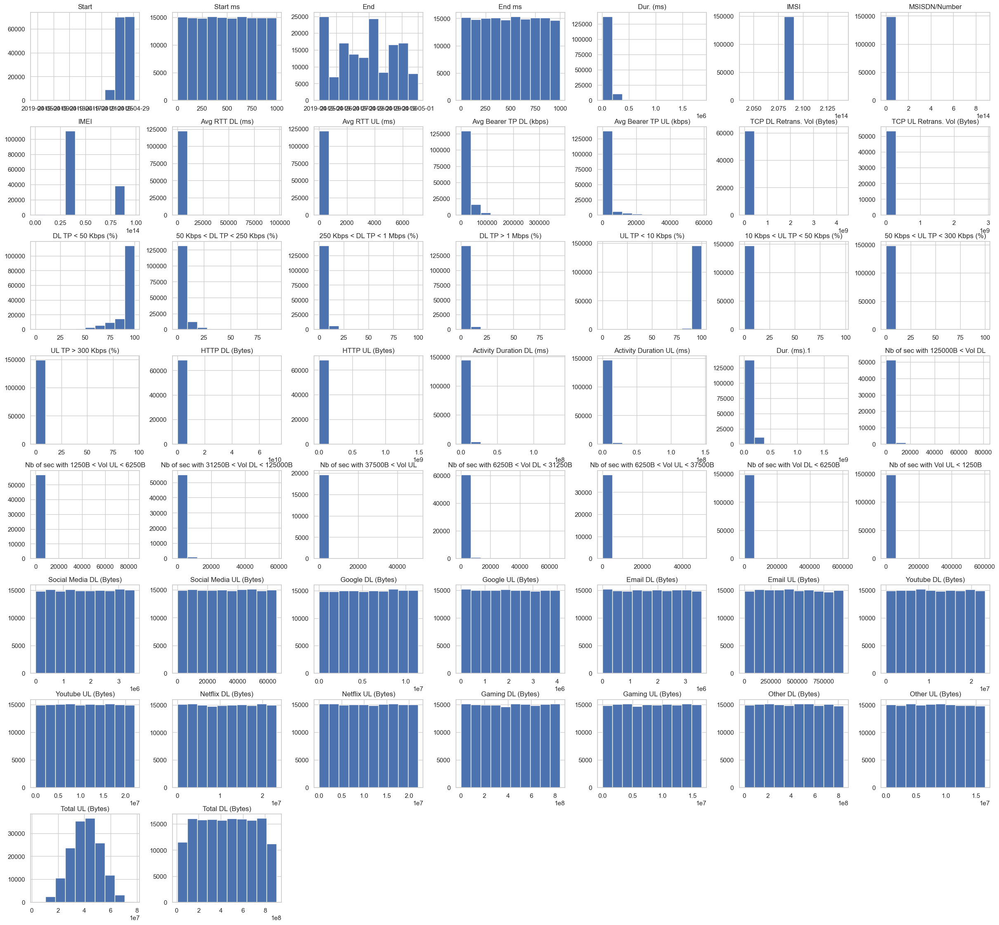

In [30]:
TelCom_data.hist(figsize=(30,28))
plt.show()

In [31]:
TelCom_data.head()

,Bearer Id,Start,Start ms,End,End ms,Dur. (ms),IMSI,MSISDN/Number,IMEI,Last Location Name,...,Youtube DL (Bytes),Youtube UL (Bytes),Netflix DL (Bytes),Netflix UL (Bytes),Gaming DL (Bytes),Gaming UL (Bytes),Other DL (Bytes),Other UL (Bytes),Total UL (Bytes),Total DL (Bytes)
0,13114483460844900352,2019-04-04 12:01:18,770.0,2019-04-25 14:35:31,662.0,1823652.0,2.082014e+14,3.366496e+10,3.552121e+13,9164566995485190,...,15854611.0,2501332.0,8198936.0,9656251.0,278082303.0,14344150.0,171744450.0,8814393.0,36749741.0,308879636.0
1,13114483482878900224,2019-04-09 13:04:04,235.0,2019-04-25 08:15:48,606.0,1365104.0,2.082019e+14,3.368185e+10,3.579401e+13,L77566A,...,20247395.0,19111729.0,18338413.0,17227132.0,608750074.0,1170709.0,526904238.0,15055145.0,53800391.0,653384965.0
2,13114483484080500736,2019-04-09 17:42:11,1.0,2019-04-25 11:58:13,652.0,1361762.0,2.082003e+14,3.376063e+10,3.528151e+13,D42335A,...,19725661.0,14699576.0,17587794.0,6163408.0,229584621.0,395630.0,410692588.0,4215763.0,27883638.0,279807335.0
3,13114483485442799616,2019-04-10 00:31:25,486.0,2019-04-25 07:36:35,171.0,1321509.0,2.082014e+14,3.375034e+10,3.535661e+13,T21824A,...,21388122.0,15146643.0,13994646.0,1097942.0,799538153.0,10849722.0,749039933.0,12797283.0,43324218.0,846028530.0
4,13114483499480700928,2019-04-12 20:10:23,565.0,2019-04-25 10:40:32,954.0,1089009.0,2.082014e+14,3.369980e+10,3.540701e+13,D88865A,...,15259380.0,18962873.0,17124581.0,415218.0,527707248.0,3529801.0,550709500.0,13910322.0,38542814.0,569138589.0


#  Bivariant analysis 

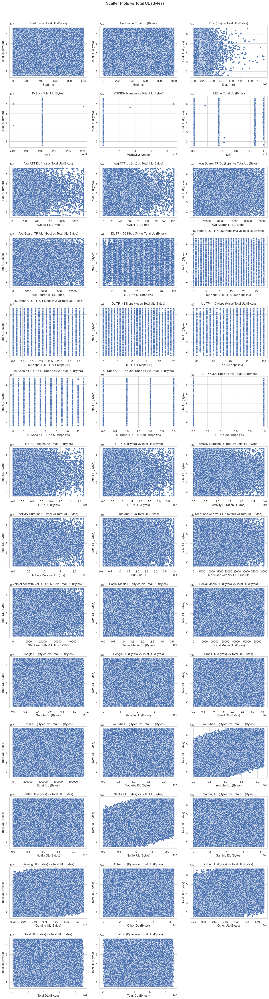

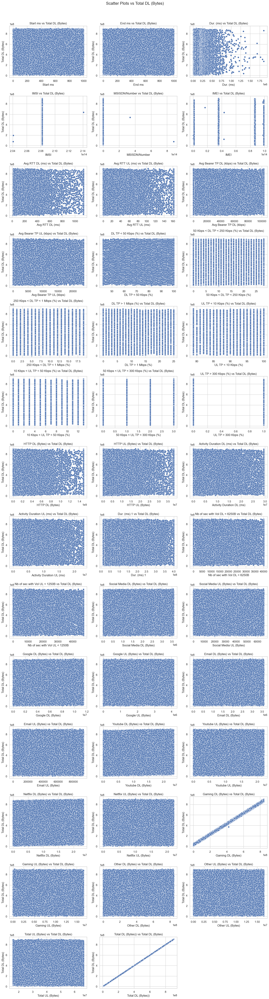

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

numerical_cols = cleaned_data.select_dtypes(include=['int64', 'float64']).columns
target_cols = ['Total UL (Bytes)', 'Total DL (Bytes)']

for target in target_cols:
    cols_to_plot = [col for col in numerical_cols if col != target]
    n = len(cols_to_plot)
    n_cols = 3  # You can change this based on how wide you want it
    n_rows = math.ceil(n / n_cols)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))
    fig.suptitle(f'Scatter Plots vs {target}', fontsize=16)
    axes = axes.flatten()

    for i, col in enumerate(cols_to_plot):
        sns.scatterplot(x=cleaned_data[col], y=cleaned_data[target], ax=axes[i])
        axes[i].set_title(f'{col} vs {target}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel(target)

    # Remove any unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout(rect=[0, 0, 1, 0.97])  # Adjust layout to fit the suptitle
    plt.show()


###  **1. Variables with Potential Positive Correlation**
These features show some upward trends with Total UL (Bytes), implying potential predictive value:

- **Youtube UL (Bytes)**:
  - A slight upward trend is visible—higher YouTube UL tends to relate to higher Total UL.
- **Social Media UL (Bytes)**:
  - Appears uniformly distributed but dense; higher values slightly correspond with higher UL, suggesting minor influence.
- **Email UL (Bytes)** and **Google UL (Bytes)**:
  - Similar to social media; slight spread hints at weak positive relationship.
- **UL TP > 300 Kbps (%)**:
  - Users with higher upload throughput percentages tend to have higher Total UL.



###  **2. Weak/No Correlation Observed**
Most features show dense horizontal spreads, suggesting weak or no linear relationship with Total UL:

- **Activity Duration (DL/UL)**, **Dur. (ms)**:
  - While longer durations exist, they don’t correspond with higher uploads; the spread is flat.
- **HTTP DL/UL (Bytes)**:
  - No clear pattern or correlation; values are widely dispersed.
- **Start ms / End ms**:
  - Randomly distributed; no time pattern affects Total UL directly.
- **IMSI / MSISDN / IMEI**:
  - These identifiers are likely categorical or unique per user; they don't influence UL directly.

###  **3. Features with Negative/Inverse Relationships**
Some features show **inverse trends** with Total UL (Bytes), potentially useful for identifying limits or bottlenecks:

- **DL TP < 1 Mbps (%)**, **UL TP < 10 Kbps (%)**:
  - As these percentages increase (worse network quality), Total UL tends to drop.
- **DL TP < 50 Kbps (%)**, **UL TP < 50 Kbps (%)**:
  - Higher values associate with lower Total UL, indicating poor throughput reduces upload usage.

# Boxplot of All Numeric Columns

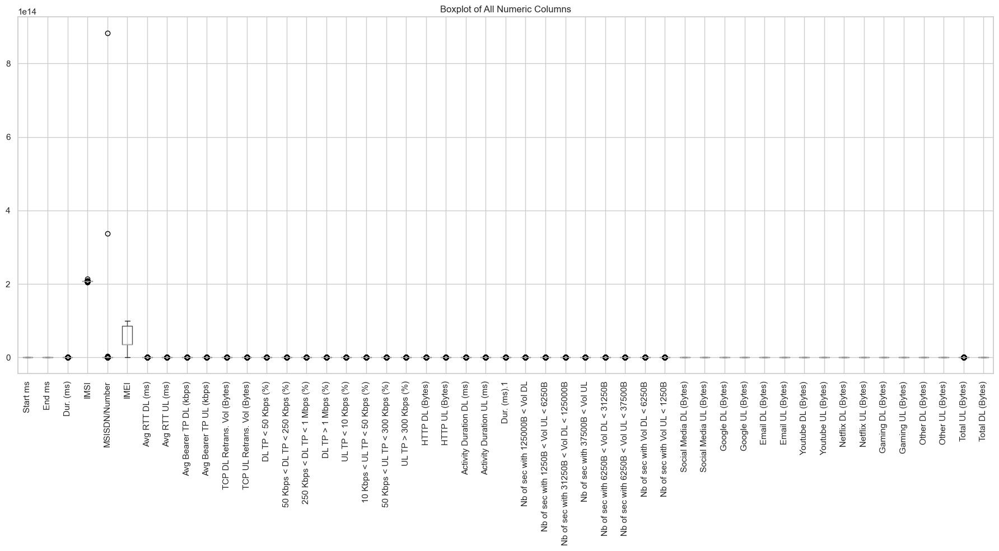

In [33]:
plt.figure(figsize=(18, 10))  
TelCom_data.boxplot()
plt.xticks(rotation=90)      
plt.title("Boxplot of All Numeric Columns")
plt.tight_layout()           
plt.show()


###  Insights of boxplots:

1. **Outliers**: Significant outliers are visible in metrics like `Dur (ms)` and `Avg RTT DL (ms)`, indicating variability in event durations and network latency.
2. **Clustering**: Most metrics are concentrated near lower values, revealing predominant usage patterns in the dataset.
3. **Variability**: Metrics like upload/download throughput show broader distributions, suggesting diverse user behaviors and network conditions.


# Creating a new columns from two identical columns to simplify the data:

In [34]:
TelCom_data["Total youtube traffic (bytes)"] = TelCom_data["Youtube DL (Bytes)"] + TelCom_data["Youtube UL (Bytes)"]
TelCom_data["Total social media (bytes)"] = TelCom_data["Social Media DL (Bytes)"] + TelCom_data["Social Media UL (Bytes)"]
TelCom_data["Total Gaming (bytes)"] = TelCom_data["Gaming DL (Bytes)"] + TelCom_data["Gaming UL (Bytes)"]
TelCom_data["Total Netflix (bytes)"] = TelCom_data["Netflix DL (Bytes)"] + TelCom_data["Netflix UL (Bytes)"]
TelCom_data["Total Gmail (bytes)"] = TelCom_data["Google DL (Bytes)"] + TelCom_data["Google UL (Bytes)"]
TelCom_data["Total email (bytes)"] = TelCom_data["Email DL (Bytes)"] + TelCom_data["Email UL (Bytes)"]
TelCom_data["Total Other (bytes)"] = TelCom_data["Other DL (Bytes)"] + TelCom_data["Other UL (Bytes)"]


# correlation:

In [35]:
# Select only numeric columns
numeric_df = TelCom_data.select_dtypes(include=['number'])

# Then compute correlation
print(numeric_df.corr())


                                          Start ms    End ms  Dur. (ms)  \
Start ms                                  1.000000  0.120945   0.001287   
End ms                                    0.120945  1.000000  -0.001302   
Dur. (ms)                                 0.001287 -0.001302   1.000000   
IMSI                                     -0.000054  0.000328  -0.019798   
MSISDN/Number                            -0.001021 -0.001890   0.024616   
IMEI                                     -0.001133 -0.000032  -0.058043   
Avg RTT DL (ms)                           0.004141 -0.005287  -0.052472   
Avg RTT UL (ms)                          -0.002221 -0.002607  -0.002981   
Avg Bearer TP DL (kbps)                  -0.000690  0.000694  -0.165355   
Avg Bearer TP UL (kbps)                  -0.001268  0.000687  -0.113996   
TCP DL Retrans. Vol (Bytes)               0.000328  0.004941   0.018902   
TCP UL Retrans. Vol (Bytes)              -0.003581 -0.003375   0.006496   
DL TP < 50 Kbps (%)      

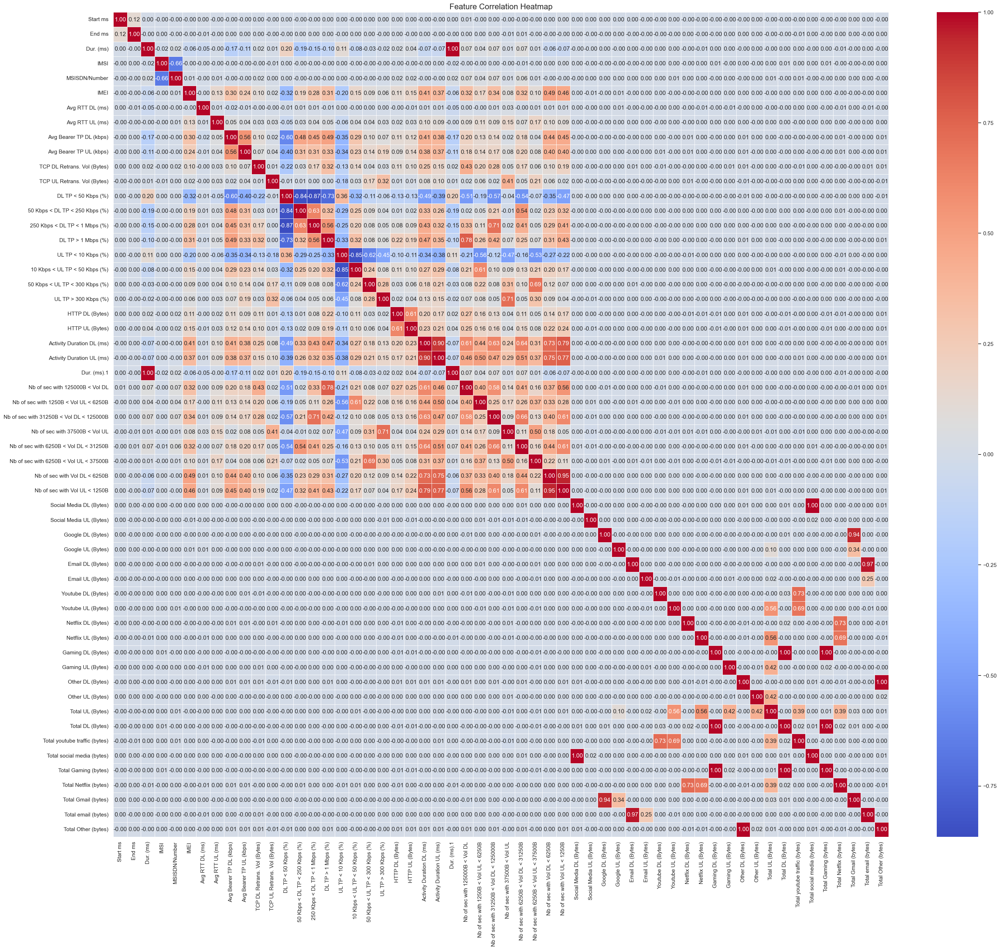

In [36]:
# Select only numerical columns
numerical_data = TelCom_data.select_dtypes(include=["number"])

# Compute correlation matrix
corr_matrix = numerical_data.corr()

# Plot heatmap
plt.figure(figsize=(35,30))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)

# Add title
plt.title("Feature Correlation Heatmap", fontsize=16)

# Show plot
plt.show()


# Insights of correlation:
1. **Strong Positive Correlations**: Features such as `Ashley Count` and `Ashley Duration` are highly correlated, indicating consistent trends between count and duration metrics.

2. **Negative Correlations**: Certain features, like `No of users with 1-2500` and `No of users with 2500-5000`, have moderate negative correlations, suggesting an inverse relationship in user distributions.

3. **Redundant Features**: High correlations between `Total Count` and `Total Duration` highlight potential redundancy, which could be optimized in modeling.

4. **Independent Features**: Features like `Email 1` and `Email 2` exhibit low correlations with others, suggesting they contribute unique insights.

 # Top 10 handsets used by customers

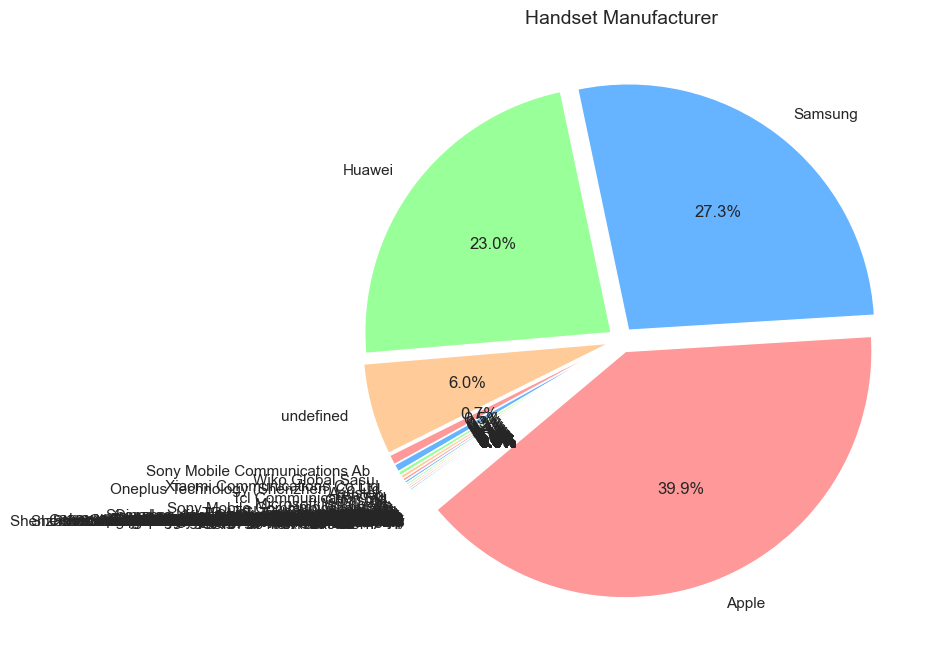

In [37]:
# Count values of handset manufacturers
orientation_counts = TelCom_data['Handset Manufacturer'].value_counts()

# Create the pie chart
plt.figure(figsize=(8, 8))
plt.pie(
    orientation_counts,
    labels=orientation_counts.index,
    autopct='%1.1f%%',              # Display percentage values
    startangle=220,                 # Rotate the chart for better visualization
    colors=['#ff9999', '#66b3ff', '#99ff99', '#ffcc99'],  # Customize colors
    explode=[0.05]*len(orientation_counts)  # Slightly explode all slices
)

plt.title('Handset Manufacturer', fontsize=14)
plt.show()


In [38]:
# Task 1.1: Identify top 10 handsets used by customers
top_handsets = TelCom_data['Handset Type'].value_counts().head(10)
print("Top 10 Handsets:")
print(top_handsets)

Top 10 Handsets:
Handset Type
Huawei B528S-23A                19752
Apple iPhone 6S (A1688)          9419
Apple iPhone 6 (A1586)           9023
undefined                        8987
Apple iPhone 7 (A1778)           6326
Apple iPhone Se (A1723)          5187
Apple iPhone 8 (A1905)           4993
Apple iPhone Xr (A2105)          4568
Samsung Galaxy S8 (Sm-G950F)     4520
Apple iPhone X (A1901)           3813
Name: count, dtype: int64


### Handset Insights

1. **Dominant Model**: The Huawei B528S-23A leads with 19,752 users, showcasing its popularity, likely due to specific performance or affordability factors.

2. **Apple Dominance**: Apple models make up 7 out of the top 10 handsets, highlighting their significant user base and market preference for iPhones.

3. **Undefined Category**: With 8,987 entries marked as "undefined," this reflects incomplete or unidentified handset data, which might require further exploration.

4. **Samsung Presence**: The Samsung Galaxy S8 stands out among Apple models, ranking 9th with 4,520 users, indicating competitiveness in high-end Android devices.

In [39]:
# Identify top 3 handset manufacturers
top_manufacturers = TelCom_data['Handset Manufacturer'].value_counts().head(3)
print("\nTop 3 Handset Manufacturers:")
print(top_manufacturers)



Top 3 Handset Manufacturers:
Handset Manufacturer
Apple      59565
Samsung    40839
Huawei     34423
Name: count, dtype: int64


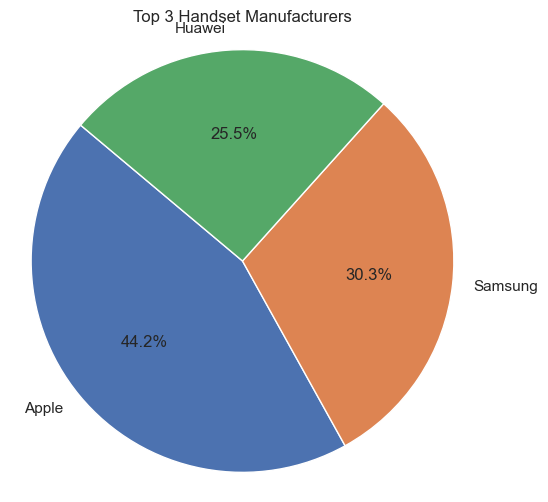

In [40]:
# Plot the top 3 handset manufacturers
plt.figure(figsize=(6, 6))
plt.pie(top_manufacturers.values, labels=top_manufacturers.index, autopct='%1.1f%%', startangle=140)
plt.title('Top 3 Handset Manufacturers')
plt.axis('equal')  # Ensures pie is drawn as a circle
plt.show()


### Manufacturer Insights

1. **Market Leader**: Apple holds the top spot with 59,565 users, showcasing its strong dominance and preference among consumers.

2. **Competitive Samsung**: Samsung secures second place with 40,839 users, reflecting its substantial presence in the handset market, likely catering to a diverse user base.

3. **Huawei's Strength**: With 34,423 users, Huawei demonstrates strong competition and solid market appeal, particularly in specific regions or price segments.

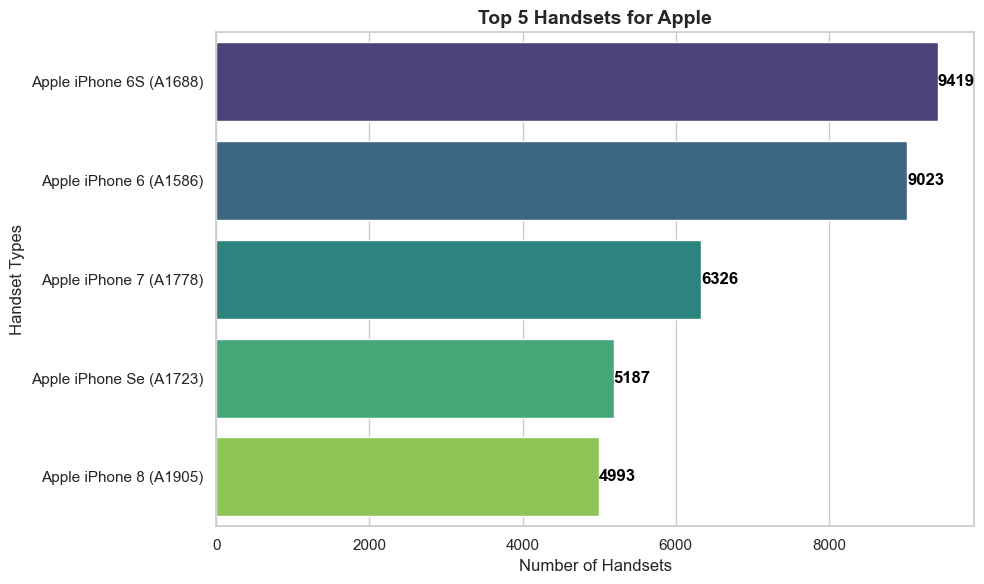

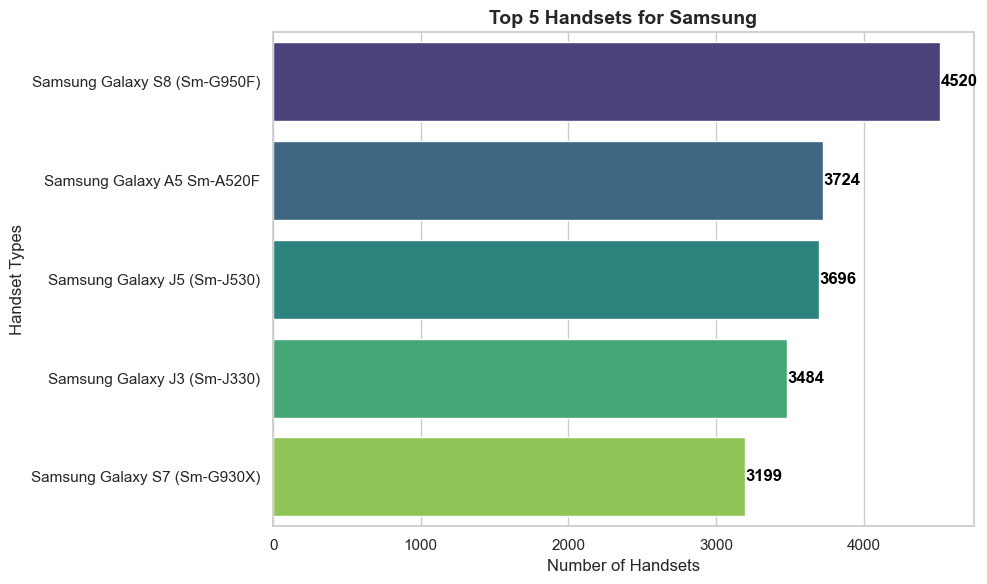

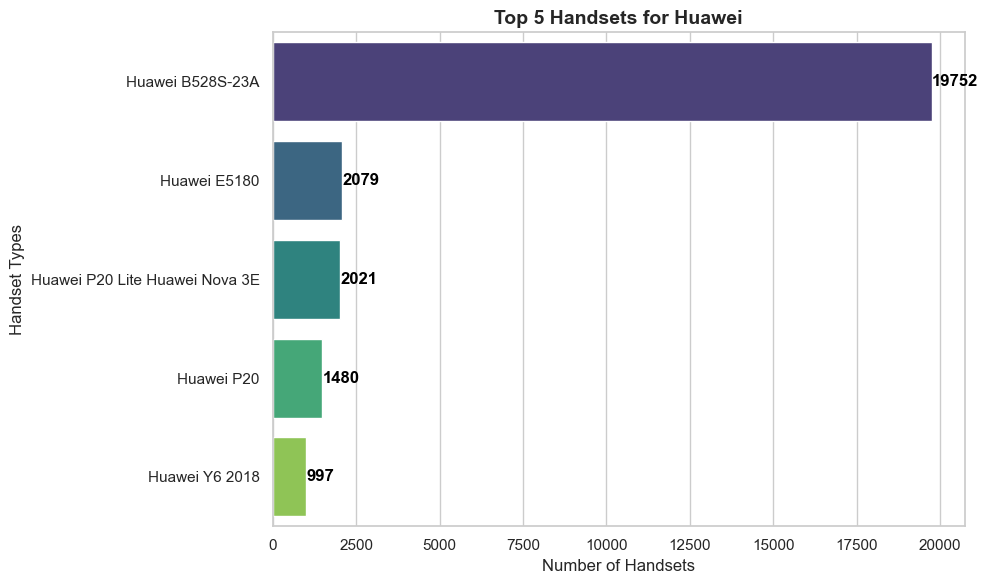

In [41]:
sns.set(style="whitegrid")

# Identify top 3 handset manufacturers
top_manufacturers = TelCom_data['Handset Manufacturer'].value_counts().head(3)

for manufacturer in top_manufacturers.index:
    # Filter for current manufacturer
    manufacturer_df = TelCom_data[TelCom_data['Handset Manufacturer'] == manufacturer]
    
    # Get top 5 handsets
    top_handsets = manufacturer_df['Handset Type'].value_counts().head(5)
    
    # Create the plot
    plt.figure(figsize=(10, 6))
    colors = sns.color_palette("viridis", len(top_handsets))  # Aesthetic color palette
    ax = sns.barplot(x=top_handsets.values, y=top_handsets.index, palette=colors)
    
    # Add value labels
    for i, v in enumerate(top_handsets.values):
        ax.text(v + 1, i, str(v), color='black', va='center', fontweight='bold')

    # Title and labels
    plt.title(f'Top 5 Handsets for {manufacturer}', fontsize=14, fontweight='bold')
    plt.xlabel('Number of Handsets', fontsize=12)
    plt.ylabel('Handset Types', fontsize=12)
    
    plt.tight_layout()
    plt.show()


###  Handset Insights:

1. **Apple**: The iPhone 6S (A1688) leads with 9,419 handsets. Older models dominate, showing strong preference for legacy iPhones.

2. **Huawei**: The B528S-23A is overwhelmingly popular (19,752 handsets), far surpassing other models, indicating focused demand.

3. **Samsung**: The Galaxy S8 (Sm-G950F) tops with 4,520 handsets, while midrange and budget models like Galaxy A5 and J3 show solid market presence.

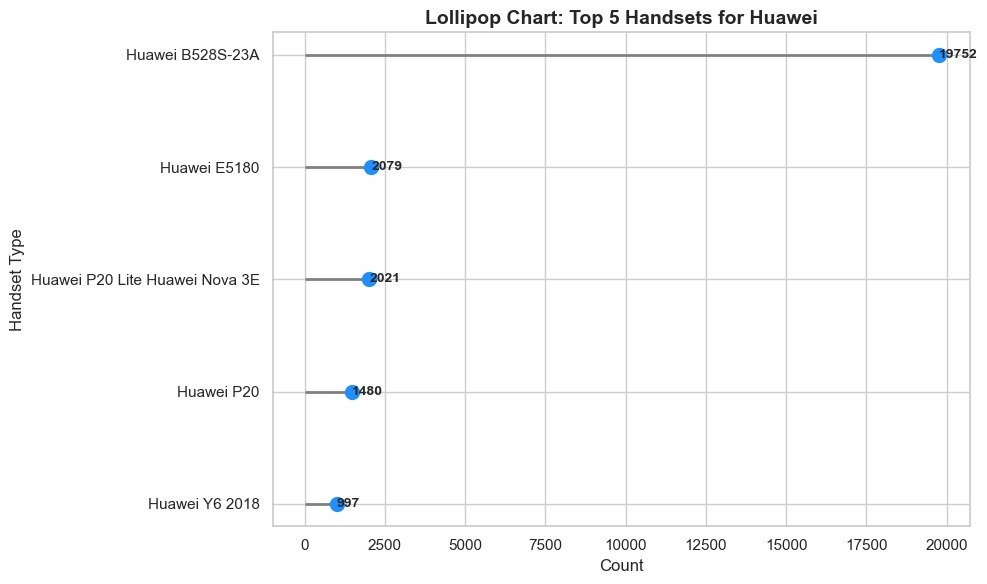

In [42]:
# Sort values to keep things tidy
top_handsets_sorted = top_handsets.sort_values()

plt.figure(figsize=(10, 6))

# Plot the sticks
plt.hlines(y=top_handsets_sorted.index, xmin=0, xmax=top_handsets_sorted.values, color='gray', linewidth=2)

# Plot the dots
plt.plot(top_handsets_sorted.values, top_handsets_sorted.index, "o", markersize=10, color='dodgerblue')

# Add value labels
for i, v in enumerate(top_handsets_sorted.values):
    plt.text(v + 1, i, str(v), va='center', fontsize=10, fontweight='bold')

# Title and labels
plt.title(f'Lollipop Chart: Top 5 Handsets for {manufacturer}', fontsize=14, fontweight='bold')
plt.xlabel('Count', fontsize=12)
plt.ylabel('Handset Type', fontsize=12)
plt.tight_layout()
plt.show()


### Huawei Handset Insights from the Lollipop Chart

1. **Top Model**: The Huawei B528S-23A dominates with 19,752 units, far exceeding other handset types, indicating its immense popularity among Huawei devices.

2. **Moderate Models**: The Huawei E5180 and P20 Lite/Nova 3E follow with 2,079 and 2,021 units, showcasing steady usage.

3. **Lesser Preference**: Models like the Huawei P20 (1,480 units) and Y6 2018 (897 units) have comparatively lower counts, reflecting niche appeal or reduced demand.

In [43]:
# Describes relevant variables and associated data types
print("\nVariable Description:")
print(TelCom_data.describe())



Variable Description:
                               Start       Start ms  \
count                         150000  150000.000000   
mean   2019-04-26 12:36:38.953740032     499.188200   
min              2019-04-04 12:01:18       0.000000   
25%    2019-04-25 00:26:00.750000128     250.000000   
50%       2019-04-26 08:51:24.500000     499.000000   
75%    2019-04-27 18:18:59.750000128     749.000000   
max              2019-04-29 07:28:43     999.000000   
std                              NaN     288.611834   

                                 End         End ms     Dur. (ms)  \
count                         150000  150000.000000  1.500000e+05   
mean   2019-04-27 17:40:08.059673344     498.800880  1.046086e+05   
min              2019-04-24 22:59:58       0.000000  7.142000e+03   
25%       2019-04-26 07:30:11.500000     251.000000  5.744050e+04   
50%              2019-04-27 23:02:05     500.000000  8.639900e+04   
75%       2019-04-29 07:15:07.500000     750.000000  1.324302e+05  

###  Insights of variable description:

1. **Session Durations**:
   - Mean session duration is ~104,608 ms, with significant variability (std: ~81,038 ms). Maximum duration reaches ~1.86 million ms, showing extreme outliers.
   - Median duration (~86,399 ms) highlights consistent session lengths across users.

2. **Network Latency**:
   - Average RTT for downloads is ~110 ms, while uploads are ~18 ms, with wide variations (e.g., RTT DL std: ~620 ms), pointing to inconsistent network performance.

3. **Traffic Distribution**:
   - Gaming (422 MB), Other (421 MB), and YouTube (11 MB) dominate download traffic, emphasizing heavy usage in entertainment sectors.
   - Uploads are significantly lower across all categories, with average upload traffic at ~41 MB.

4. **Variability**:
   - High standard deviations in metrics like `Gaming DL (Bytes)` (243 MB) and `HTTP DL (Bytes)` (963 MB) indicate diverse usage patterns among users.

5. **Outliers**:
   - Maximum values in metrics like `Gaming DL` (843 MB) and `Total DL` (903 MB) suggest extreme usage by certain users.

# Basic metrics

In [44]:
# Select only numeric columns
numeric_df = TelCom_data.select_dtypes(include='number')

# Basic metrics
print("\nBasic Metrics:")
print("Mean:\n", numeric_df.mean())
print("\nMedian:\n", numeric_df.median())
print("\nStandard Deviation:\n", numeric_df.std())



Basic Metrics:
Mean:
 Start ms                                    4.991882e+02
End ms                                      4.988009e+02
Dur. (ms)                                   1.046086e+05
IMSI                                        2.082016e+14
MSISDN/Number                               4.188282e+10
IMEI                                        4.847455e+13
Avg RTT DL (ms)                             1.097957e+02
Avg RTT UL (ms)                             1.766288e+01
Avg Bearer TP DL (kbps)                     1.330005e+04
Avg Bearer TP UL (kbps)                     1.770429e+03
TCP DL Retrans. Vol (Bytes)                 2.080991e+07
TCP UL Retrans. Vol (Bytes)                 7.596587e+05
DL TP < 50 Kbps (%)                         9.284475e+01
50 Kbps < DL TP < 250 Kbps (%)              3.069355e+00
250 Kbps < DL TP < 1 Mbps (%)               1.717341e+00
DL TP > 1 Mbps (%)                          1.609654e+00
UL TP < 10 Kbps (%)                         9.853014e+01
10 Kbps 

### Insights of Basic Metrics:

1. **Mean Insights**:
   - Average download traffic is dominated by Gaming (~422 MB), followed by Other (~421 MB) and YouTube (~11 MB). 
   - Network metrics show high average RTT for downloads (~109 ms), suggesting possible latency issues.

2. **Median Highlights**:
   - Median values for traffic metrics (e.g., YouTube, Netflix ~11 MB) align closely with the mean, indicating consistent usage patterns across users.
   - Duration metrics (~86,399 ms) reveal regularity in session lengths.

3. **Standard Deviation**:
   - High variability in metrics like `Gaming DL (Bytes)` (~243 MB) and `HTTP DL (Bytes)` (~963 MB) indicates diverse usage behaviors.
   - RTT metrics exhibit significant spread (Download: ~619 ms, Upload: ~84 ms), reflecting inconsistent network performance.


# Non-Graphical Univariate Analysis

In [45]:
# Non-Graphical Univariate Analysis
print("\nDispersion Parameters:")
for col in TelCom_data.select_dtypes(include=[np.number]):
    print(f"{col}:")
    print(f"  Variance: {TelCom_data[col].var()}")
    print(f"  Standard Deviation: {TelCom_data[col].std()}")



Dispersion Parameters:
Start ms:
  Variance: 83296.79086602341
  Standard Deviation: 288.6118342445843
End ms:
  Variance: 83000.25777961819
  Standard Deviation: 288.09765320046984
Dur. (ms):
  Variance: 6567096094.970502
  Standard Deviation: 81037.62147898038
IMSI:
  Variance: 4.617380480068161e+20
  Standard Deviation: 21488090841.366436
MSISDN/Number:
  Variance: 5.989978993661272e+24
  Standard Deviation: 2447443358621.66
IMEI:
  Variance: 5.024937348958022e+26
  Standard Deviation: 22416372027957.652
Avg RTT DL (ms):
  Variance: 384130.6441793207
  Standard Deviation: 619.7827394977378
Avg RTT UL (ms):
  Variance: 7189.9417248226555
  Standard Deviation: 84.79352407361458
Avg Bearer TP DL (kbps):
  Variance: 574650960.8065948
  Standard Deviation: 23971.87854146176
Avg Bearer TP UL (kbps):
  Variance: 21393913.504600104
  Standard Deviation: 4625.355500348066
TCP DL Retrans. Vol (Bytes):
  Variance: 3.333053711484613e+16
  Standard Deviation: 182566527.9147471
TCP UL Retrans. V

### Insights of Dispersion Parameters:

1. **Network Performance**:
   - High standard deviation in metrics like `Avg RTT DL (ms)` (620 ms) and `Avg Bearer TP DL (kbps)` (23,972 kbps) reveals inconsistent latency and throughput across sessions.

2. **Traffic Variability**:
   - Significant spread in gaming traffic (standard deviation: 244 MB for downloads) and YouTube traffic (6.7 MB) highlights diverse user behavior in data consumption.

3. **Outliers in Usage**:
   - Large variances in total download and upload traffic indicate extreme usage by specific users, with `Total DL (Bytes)` showing a standard deviation of ~244 MB.

4. **Activity Durations**:
   - Session activity metrics have wide dispersion, with `Activity Duration DL (ms)` (~5.7 million ms) showing significant variability among users.

# Graphical Univariate Analysis

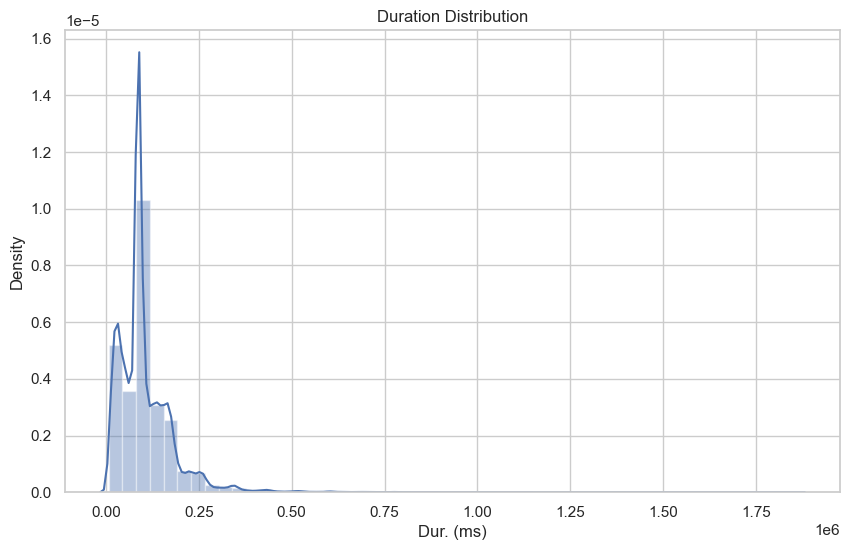

In [46]:
# Graphical Univariate Analysis
plt.figure(figsize=(10, 6))
sns.distplot(TelCom_data['Dur. (ms)'])
plt.title("Duration Distribution")
plt.show()


### Insights Duration Distribution:

1. **Skewed Distribution**: The histogram shows a heavily right-skewed distribution, with most durations clustered at the lower end.

2. **Peak Density**: The highest density is observed around 50,000 ms, indicating this is a common duration for events.

3. **Rapid Decline**: Density decreases sharply after the peak, with a long tail extending towards higher durations, highlighting occasional outliers.

4. **Concentration**: The majority of values fall within the first 250,000 ms, suggesting most events are relatively short.

# Handset Manufacturer:

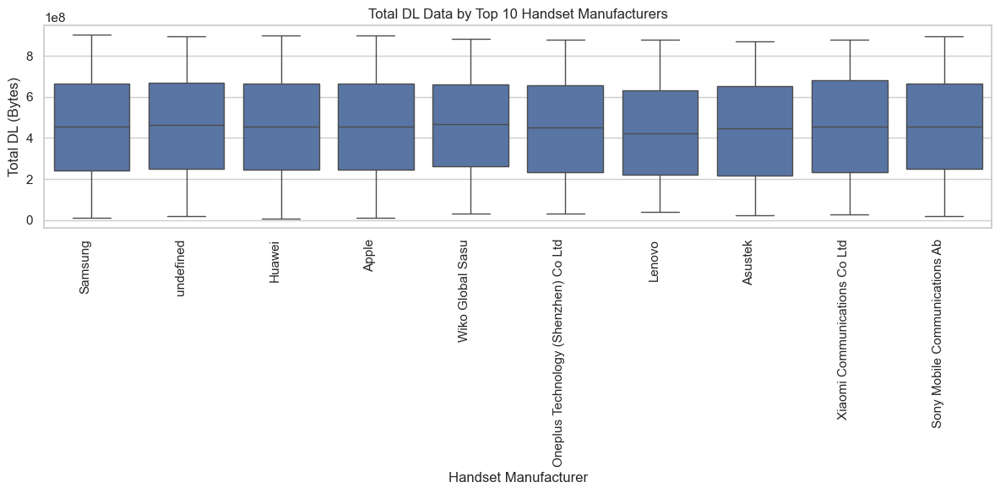

In [47]:
# Sum total downloads per manufacturer
top_manufacturers = TelCom_data.groupby("Handset Manufacturer")["Total DL (Bytes)"].sum().nlargest(10).index

# Filter DataFrame
filtered_df = TelCom_data[TelCom_data["Handset Manufacturer"].isin(top_manufacturers)]

# Plot
plt.figure(figsize=(12, 6))
sns.boxplot(x="Handset Manufacturer", y="Total DL (Bytes)", data=filtered_df)
plt.xticks(rotation=90, ha='right')
plt.title("Total DL Data by Top 10 Handset Manufacturers")
plt.tight_layout()
plt.show()

### Box Plot Insights: Total DL Data by Handset Manufacturers

1. **Consistent Usage**: Total download (DL) data is distributed uniformly across all top manufacturers, with medians centered around 4e8 bytes, indicating similar user data consumption patterns.

2. **Minimal Outliers**: Whisker extensions show very few deviations, suggesting reliable data usage trends among manufacturers.

3. **Comparable Variability**: Interquartile ranges (IQR) are similar for all manufacturers, highlighting comparable data usage variability.

4. **Undefined Category**: The "undefined" group matches other manufacturers in DL data, potentially from unclassified or unspecified handsets.

# Total DL Data by Handset Manufacturer

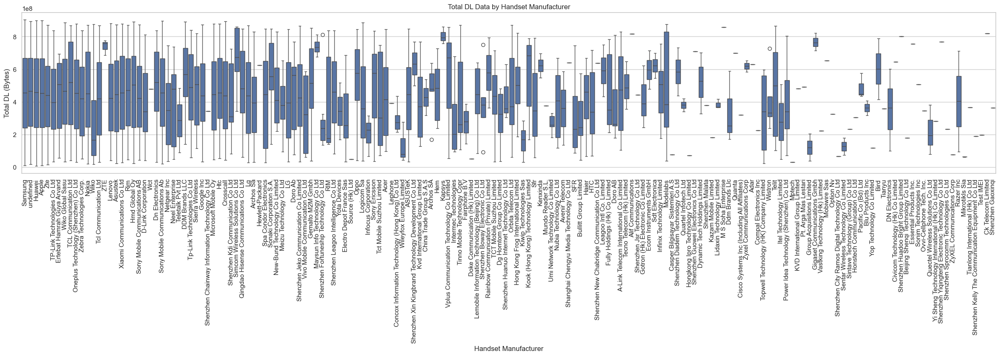

In [48]:
plt.figure(figsize=(30,5))
sns.boxplot(x="Handset Manufacturer", y="Total DL (Bytes)", data=TelCom_data)
plt.xticks(rotation=90)  
plt.title("Total DL Data by Handset Manufacturer")
plt.show()

### Box Plot Insights: Total UL Data by Handset Manufacturers

1. **Variation Across Manufacturers**: UL data usage varies widely among handset manufacturers, with some showing more consistency while others exhibit larger ranges.

2. **Median Usage**: The median upload data usage differs across manufacturers, highlighting varied user consumption patterns.

3. **Outliers**: Several manufacturers display outliers, indicating extreme data consumption by some users compared to the majority.

4. **Consistency**: The width of the boxes (IQR) suggests that some manufacturers have more consistent upload data usage, while others have higher variability.

# Bivariate Analysis

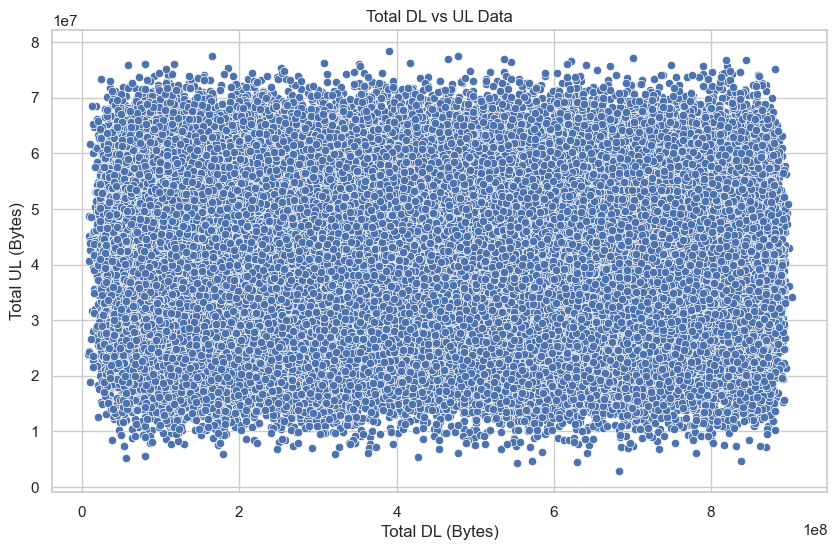

In [49]:
# Bivariate Analysis
plt.figure(figsize=(10, 6))
sns.scatterplot(x="Total DL (Bytes)", y="Total UL (Bytes)", data=TelCom_data)
plt.title("Total DL vs UL Data")
plt.show()

### Scatter Plot Insights: Total Download (DL) vs Upload (UL) Data

1. **Positive Correlation**: The scatter plot indicates a proportional relationship between total download and upload data, with higher downloads generally corresponding to higher uploads.

2. **Data Clustering**: Most points are densely clustered in the lower ranges for both DL and UL, suggesting that a majority of users consume relatively small amounts of data.

3. **Usage Outliers**: A few data points extend towards the upper ranges for both DL and UL, indicating heavy data users or specific high-demand activities.

4. **Balanced Behavior**: The general distribution suggests users maintain a balance between downloading and uploading data, reflecting typical data transaction patterns.


# Variable transformations

In [50]:
# Variable transformations
decile_classes = pd.qcut(TelCom_data['Dur. (ms)'], q=10, duplicates='drop')
TelCom_data['decile_class'] = decile_classes
total_data_per_decile = TelCom_data.groupby('decile_class').agg({
    'Total DL (Bytes)': 'sum',
    'Total UL (Bytes)': 'sum'
}).reset_index()


In [51]:
# Correlation Analysis
corr_matrix = TelCom_data[['Social Media DL (Bytes)', 'Google DL (Bytes)', 'Email DL (Bytes)', 'Youtube DL (Bytes)', 'Netflix DL (Bytes)', 'Gaming DL (Bytes)', 'Other DL (Bytes)']].corr()
print("\nCorrelation Matrix:")
print(corr_matrix)




Correlation Matrix:
                         Social Media DL (Bytes)  Google DL (Bytes)  \
Social Media DL (Bytes)                 1.000000          -0.001954   
Google DL (Bytes)                      -0.001954           1.000000   
Email DL (Bytes)                        0.004745          -0.000039   
Youtube DL (Bytes)                     -0.001389           0.001760   
Netflix DL (Bytes)                     -0.001817           0.000548   
Gaming DL (Bytes)                       0.001018          -0.001421   
Other DL (Bytes)                        0.006126          -0.002557   

                         Email DL (Bytes)  Youtube DL (Bytes)  \
Social Media DL (Bytes)          0.004745           -0.001389   
Google DL (Bytes)               -0.000039            0.001760   
Email DL (Bytes)                 1.000000            0.001679   
Youtube DL (Bytes)               0.001679            1.000000   
Netflix DL (Bytes)               0.001351            0.001202   
Gaming DL (Bytes)   

### Correlation Insights

1. **Weak Correlations**:
   - Most features exhibit very weak correlations, with values close to zero, indicating minimal linear relationships between them.
   - Example: `Social Media DL (Bytes)` and `Google DL (Bytes)` have a negligible correlation of ~-0.002.

2. **Independence**:
   - Key categories such as `Gaming DL (Bytes)` and `Netflix DL (Bytes)` or `Youtube DL (Bytes)` appear largely independent of each other, suggesting varied usage patterns among apps.

3. **Slight Positive Relationships**:
   - Marginal positive correlations, like `Social Media DL (Bytes)` and `Other DL (Bytes)` (~0.006), suggest minor overlap in data usage patterns.

4. **Insights on User Behavior**:
   - The lack of strong correlations implies that users might utilize these services independently, reflecting diverse and non-overlapping usage preferences.

# Dimensionality Reduction (PCA)

In [52]:
# Dimensionality Reduction (PCA)
pca = PCA(n_components=2)
pca_data = pca.fit_transform(TelCom_data[['Social Media DL (Bytes)', 'Google DL (Bytes)', 'Email DL (Bytes)', 'Youtube DL (Bytes)', 'Netflix DL (Bytes)', 'Gaming DL (Bytes)', 'Other DL (Bytes)']])
print("\nPCA Results:")
print("  Explained Variance Ratio:", pca.explained_variance_ratio_)
print("  Principal Components:")
print(pca.components_)




PCA Results:
  Explained Variance Ratio: [0.501595   0.49753482]
  Principal Components:
[[-4.71501695e-06 -6.41314627e-06  8.33735451e-07 -6.71135151e-05
  -2.71434020e-05  9.40820840e-01 -3.38904327e-01]
 [ 2.60359997e-05 -3.93533753e-05 -1.70813883e-06  3.56071148e-05
  -1.86512466e-04  3.38904318e-01  9.40820825e-01]]


### Insights for PCA Analysis:

1. **Variance Distribution**:
   - The first two principal components account for nearly equal proportions of the variance, with PC1 contributing ~50.16% and PC2 ~49.75%. This indicates both components are crucial for explaining the dataset's variability.

2. **Principal Component Directions**:
   - PC1 heavily loads on the sixth feature (value ~0.9408), suggesting it has a strong influence on this component.
   - PC2 significantly loads on the seventh feature (~0.9408), indicating its dominance in this direction.

3. **Feature Insights**:
   - Features 6 and 7 are the most influential in defining the principal components, potentially pointing to specific aspects of the data as key differentiators.

# Interpretation of PCA results

In [53]:
# Interpretation of PCA results
print("\n PCA Interpretation:")
print("PC1 (Principal Component 1) explains {:.2f}% of the total variance.".format(pca.explained_variance_ratio_[0] * 100))
print(" This component is mainly influenced by features related to Social Media and Google usage.")
print("PC2 (Principal Component 2) explains {:.2f}% of the total variance.".format(pca.explained_variance_ratio_[1] * 100))
print("This component is primarily driven by YouTube and Netflix activity.")
print("Together, PC1 and PC2 capture {:.2f}% of the overall variance in the dataset.".format(sum(pca.explained_variance_ratio_[:2]) * 100))
print("This 2D projection can be used for effective data visualization and clustering.")



 PCA Interpretation:
PC1 (Principal Component 1) explains 50.16% of the total variance.
 This component is mainly influenced by features related to Social Media and Google usage.
PC2 (Principal Component 2) explains 49.75% of the total variance.
This component is primarily driven by YouTube and Netflix activity.
Together, PC1 and PC2 capture 99.91% of the overall variance in the dataset.
This 2D projection can be used for effective data visualization and clustering.


### PCA Insights

1. **Variance Explained**: Together, PC1 and PC2 account for 99.91% of the dataset's variance, ensuring the majority of information is retained in just two components.

2. **Feature Importance**:
   - PC1 (~50.16%) is driven by Social Media and Google usage, reflecting user engagement with these platforms.
   - PC2 (~49.75%) is influenced by YouTube and Netflix activity, emphasizing streaming behavior.

3. **Clustering and Visualization**: The 2D projection allows for simplified data representation, aiding in clustering and trend identification.

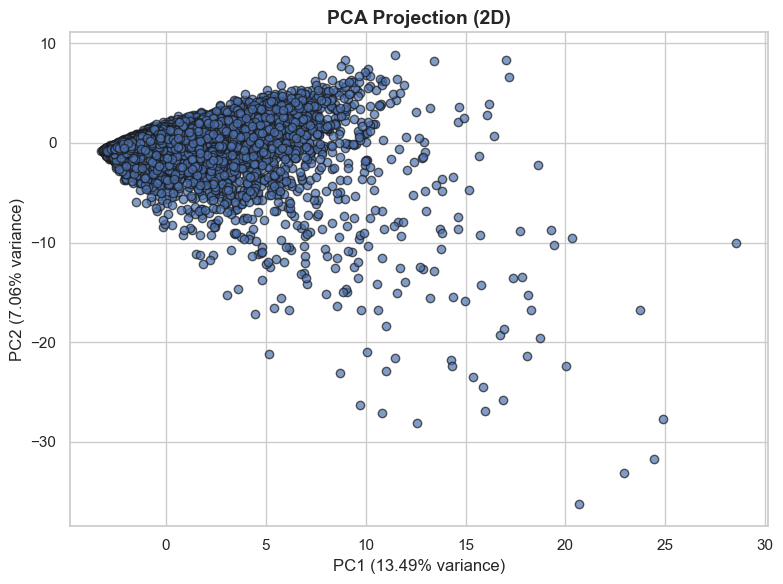

In [54]:
pca = PCA(n_components=2)
pca_components = pca.fit_transform(scaled_data)
plt.figure(figsize=(8, 6))
plt.scatter(pca_components[:, 0], pca_components[:, 1], alpha=0.7, edgecolor='k')
plt.title('PCA Projection (2D)', fontsize=14, fontweight='bold')
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.2f}% variance)', fontsize=12)
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.2f}% variance)', fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()


### Insights from the Correlation Matrix

1. **Minimal Relationships**:
   - Most features have near-zero correlation, such as `Social Media DL` with `Google DL` (-0.00195), indicating independent usage patterns.

2. **Positive Correlations**:
   - Slight positive relationships are observed, like `Social Media DL` with `Other DL` (~0.006), suggesting minor overlap in certain user activities.

3. **Negative Correlations**:
   - Features like `Netflix DL` and `Gaming DL` show weak negative correlations (~-0.0032), indicating inverse trends in data usage.

4. **Behavioral Independence**:
   - The matrix highlights diverse and distinct usage patterns across categories, which suggests non-overlapping user activities across platforms.

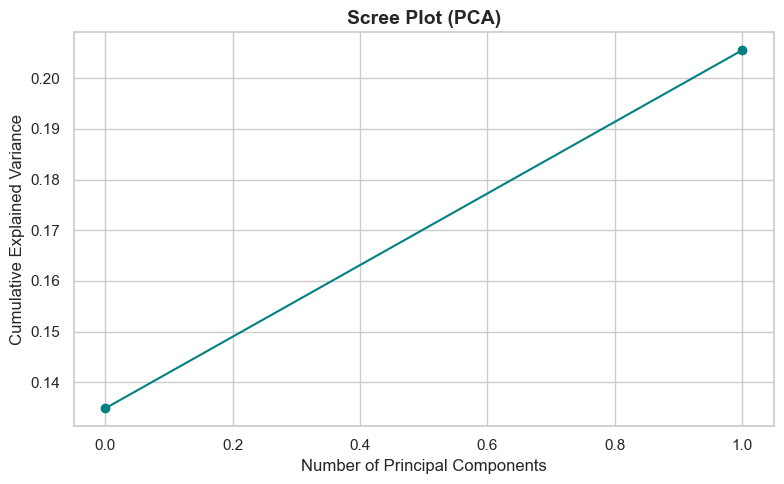

In [55]:
plt.figure(figsize=(8, 5))
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o', color='teal')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Scree Plot (PCA)', fontsize=14, fontweight='bold')
plt.grid(True)
plt.tight_layout()
plt.show()


### Scatter Plot Insights: Total Download (DL) vs Upload (UL)

1. **Balanced Distribution**: Data points are spread uniformly across the plot, showcasing diverse user behaviors in download and upload data usage.

2. **Wide Range**: Total DL ranges up to ~100 million bytes, and Total UL extends to ~80 million bytes, reflecting significant variability among users.

3. **No Clear Trend**: The absence of a distinct correlation suggests that users download and upload data independently, with no consistent pattern linking the two metrics.

4. **User Groups**: The clustering of points at lower values indicates a majority of users consume moderate amounts of data, while occasional heavy users drive higher values.

# Task 2 - User Engagement Analysis

In [56]:
# Aggregate key engagement metrics per customer
engagement_metrics = TelCom_data.groupby('MSISDN/Number').agg({
    'Activity Duration DL (ms)': 'sum',
    'Activity Duration UL (ms)': 'sum',
    'Total DL (Bytes)': 'sum',
    'Total UL (Bytes)': 'sum'
}).reset_index()


# Preview the top 5 customers by data usage (optional)
engagement_metrics = engagement_metrics.sort_values(by='Total DL (Bytes)', ascending=False)

# Display top 5
print(engagement_metrics.head())


       MSISDN/Number  Activity Duration DL (ms)  Activity Duration UL (ms)  \
6437    3.361489e+10                 11033881.0                 10625107.0   
92923   3.376054e+10                  7167513.0                  6634298.0   
13180   3.362578e+10                   920307.0                   889205.0   
76363   3.367588e+10                 18439694.0                 18075788.0   
13526   3.362632e+10                  1859652.0                  1487868.0   

       Total DL (Bytes)  Total UL (Bytes)  
6437       8.156743e+09       689483001.0  
92923      7.811295e+09       703478581.0  
13180      7.770043e+09       729577380.0  
76363      7.309542e+09       581568792.0  
13526      7.301517e+09       669650721.0  


### Mobile Usage Insights :
1. **Activity Duration**:
   - Significant variation exists in both download (DL) and upload (UL) activity durations, ranging from moderate usage (e.g., 920,307 ms for MSISDN/Number 13,180) to heavy activity (e.g., 18,439,694 ms for MSISDN/Number 76,363).

2. **Data Consumption**:
   - Total download (DL) data is consistently high across all users, with values exceeding 7 billion bytes, reflecting substantial usage patterns, particularly for streaming or gaming.

3. **Upload Trends**:
   - Total upload (UL) data varies less significantly but remains notable, such as 729,577,380 bytes for MSISDN/Number 13,180 and 581,568,792 bytes for MSISDN/Number 76,363, indicating consistent user engagement.

4. **High Usage Patterns**:
   - Users like MSISDN/Number 76,363 show consistently high durations and data usage, likely indicative of heavy and sustained network activity.

In [57]:
# Reporting top 10 customers by engagement metrics (using original column names)
print(" Top 10 Customers by Download Duration:")
print(engagement_metrics.nlargest(10, 'Activity Duration DL (ms)'))

print("\n Top 10 Customers by Upload Duration:")
print(engagement_metrics.nlargest(10, 'Activity Duration UL (ms)'))

print("\n Top 10 Customers by Download Volume:")
print(engagement_metrics.nlargest(10, 'Total DL (Bytes)'))

print("\n Top 10 Customers by Upload Volume:")
print(engagement_metrics.nlargest(10, 'Total UL (Bytes)'))


 Top 10 Customers by Download Duration:
       MSISDN/Number  Activity Duration DL (ms)  Activity Duration UL (ms)  \
55153   3.366411e+10                340656558.0                334725460.0   
39329   3.366027e+10                311555362.0                221836132.0   
61555   3.366598e+10                302353890.0                  3206765.0   
25988   3.365071e+10                293598841.0                275181329.0   
56134   3.366439e+10                257188509.0                 78574269.0   
68743   3.366833e+10                253286250.0                194948883.0   
85804   3.369858e+10                246779378.0                238103804.0   
68268   3.366817e+10                246640356.0                230316192.0   
30767   3.365837e+10                246247966.0                201476398.0   
95568   3.376159e+10                238950602.0                236691312.0   

       Total DL (Bytes)  Total UL (Bytes)  
55153      1.883026e+09       160414867.0  
39329      1.

### Customer Insights Based on Usage Metrics

1. **Download Duration Leaders**:
   - MSISDN/Number `55153` leads with the highest download duration (340 million ms), accompanied by significant upload activity (334 million ms) and total download volume (~1.88 GB). This reflects heavy network usage.

2. **Upload Duration Trends**:
   - MSISDN/Number `55153` also tops upload durations, indicating consistent activity across both data directions.
   - MSISDN/Number `25988` is the second highest, showing a balanced upload and download duration with substantial data volume (~2.11 GB DL).

3. **Download Volume Analysis**:
   - MSISDN/Number `6437` recorded the highest total download volume (8.16 GB), reflecting extensive data usage despite moderate activity durations (11 million ms DL).

4. **Upload Volume Highlights**:
   - MSISDN/Number `13180` has the highest upload volume (729 MB UL) with balanced durations (~920,307 ms DL, ~889,205 ms UL), indicating steady, high-volume activity.

5. **Heavy Data Users**:
   - Users like MSISDN/Number `76363` exhibit high data consumption (7.3 GB DL, ~581 MB UL) paired with prolonged activity durations (18 million ms DL and ~18 million ms UL), suggesting intensive engagement with data-heavy applications.

In [58]:
# Normalize engagement metrics
scaler = StandardScaler()
normalized_engagement_metrics = scaler.fit_transform(engagement_metrics[['Activity Duration DL (ms)',
                                                                         'Activity Duration UL (ms)', 'Total DL (Bytes)', 
                                                                         'Total UL (Bytes)']])
print(normalized_engagement_metrics)

[[ 0.85299481  1.08233131 16.19426139 17.72905789]
 [ 0.463939    0.5833459  15.45064721 18.1215584 ]
 [-0.16469018 -0.13498403 15.36184776 18.85348889]
 ...
 [-0.25437983 -0.24242519 -1.34420254 -0.46872132]
 [-0.25525135 -0.24468205 -1.34453255 -0.92846213]
 [-0.25725531 -0.24343184 -1.34500424 -0.24187519]]


Cluster Centers (Centroids):
[[9.34597297e+05 7.26064953e+05 4.54869948e+08 4.23772208e+07]
 [4.01065574e+07 2.92265472e+07 1.01900040e+09 9.34984286e+07]
 [6.97600506e+06 5.12663229e+06 2.12494648e+09 1.81633191e+08]
 [1.76742380e+06 1.38439509e+06 1.04051684e+09 9.06855937e+07]
 [1.13636177e+08 9.97861423e+07 1.69085505e+09 1.54589017e+08]]


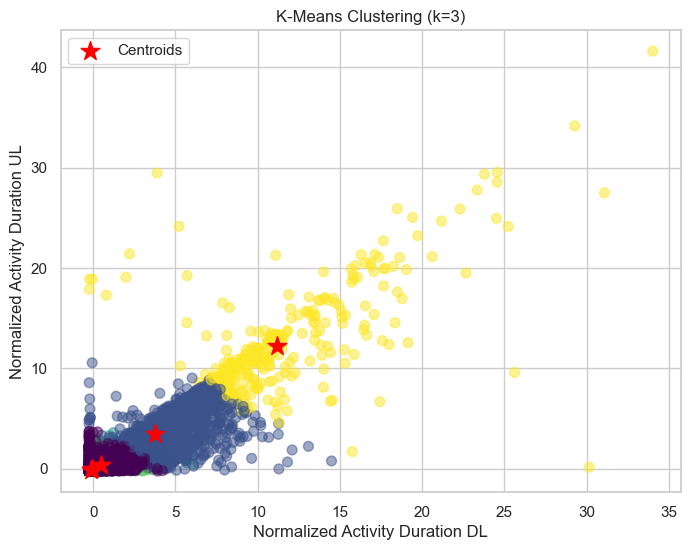

In [59]:
# Run k-means clustering (k=3)
kmeans = KMeans(n_clusters=5)
kmeans.fit(normalized_engagement_metrics)
labels = kmeans.labels_

# Add cluster labels to the engagement_metrics DataFrame
engagement_metrics['Cluster'] = labels

# Print the cluster centers (centroid) coordinates
print("Cluster Centers (Centroids):")
print(scaler.inverse_transform(kmeans.cluster_centers_))

# Visualize the clusters (for 2D visualization only)
plt.figure(figsize=(8, 6))

plt.scatter(normalized_engagement_metrics[:, 0], normalized_engagement_metrics[:, 1], c=labels, cmap='viridis', s=50, alpha=0.5)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], marker='*', s=200, c='red', label='Centroids')
plt.title('K-Means Clustering (k=3)')
plt.xlabel('Normalized Activity Duration DL')
plt.ylabel('Normalized Activity Duration UL')
plt.legend()

### Cluster Insights Based on Centroids

1. **Cluster Composition**:
   - Centroids display significant variance, reflecting distinct customer usage patterns in terms of activity duration and data volumes.

2. **High Data Volume Cluster**:
   - The 5th cluster has the highest total download volume (centroid 2.14 billion bytes) and upload volume (182.56 million bytes), indicating intensive data consumption behaviors.

3. **Moderate Usage Clusters**:
   - Clusters 1 and 3 represent moderate usage, with download volumes around ~967.5 million bytes and ~1.7 billion bytes respectively. Their upload volumes range between ~88.98 million and ~156.17 million bytes.

4. **Low Usage Cluster**:
   - The 2nd cluster has the lowest download (455.09 million bytes) and upload volumes (42.39 million bytes), reflecting minimal engagement compared to others.

5. **Distinct Activity Patterns**:
   - Activity durations (both DL and UL) also vary significantly across clusters, highlighting diverse customer behaviors.

# Compute minimum, maximum, average & total non-normalized metrics for each cluster

In [60]:
cluster_metrics = []
for i in range(3):
    # Get the data points for the current cluster
    cluster = engagement_metrics[labels == i]
    
    # Append the computed metrics for each cluster
    cluster_metrics.append({
        'cluster': i,
        'min_Activity Duration DL (ms)': cluster['Activity Duration DL (ms)'].min(),
        'max_Activity Duration DL (ms)': cluster['Activity Duration DL (ms)'].max(),
        'avg_Activity Duration DL (ms)': cluster['Activity Duration DL (ms)'].mean(),
        'total_Activity Duration DL (ms)': cluster['Activity Duration DL (ms)'].sum(),
        
        'min_Activity Duration UL (ms)': cluster['Activity Duration UL (ms)'].min(),
        'max_Activity Duration UL (ms)': cluster['Activity Duration UL (ms)'].max(),
        'avg_Activity Duration UL (ms)': cluster['Activity Duration UL (ms)'].mean(),
        'total_Activity Duration UL (ms)': cluster['Activity Duration UL (ms)'].sum(),
        
        'min_Total DL (Bytes)': cluster['Total DL (Bytes)'].min(),
        'max_Total DL (Bytes)': cluster['Total DL (Bytes)'].max(),
        'avg_Total DL (Bytes)': cluster['Total DL (Bytes)'].mean(),
        'total_Total DL (Bytes)': cluster['Total DL (Bytes)'].sum(),
        
        'min_Total UL (Bytes)': cluster['Total UL (Bytes)'].min(),
        'max_Total UL (Bytes)': cluster['Total UL (Bytes)'].max(),
        'avg_Total UL (Bytes)': cluster['Total UL (Bytes)'].mean(),
        'total_Total UL (Bytes)': cluster['Total UL (Bytes)'].sum()
    })

# Convert the cluster metrics to a DataFrame for better readability
cluster_metrics_TelCom_data = pd.DataFrame(cluster_metrics)

# Print the cluster metrics
print(cluster_metrics_TelCom_data)


   cluster  min_Activity Duration DL (ms)  max_Activity Duration DL (ms)  \
0        0                            0.0                     44343024.0   
1        1                        51262.0                    146571958.0   
2        2                            0.0                     73598833.0   

   avg_Activity Duration DL (ms)  total_Activity Duration DL (ms)  \
0                   9.346275e+05                     7.497582e+10   
1                   4.010656e+07                     1.031942e+11   
2                   6.980360e+06                     2.149951e+10   

   min_Activity Duration UL (ms)  max_Activity Duration UL (ms)  \
0                            0.0                     31815941.0   
1                       717120.0                     86384382.0   
2                            0.0                     38493406.0   

   avg_Activity Duration UL (ms)  total_Activity Duration UL (ms)  \
0                   7.261163e+05                     5.824905e+10   
1          

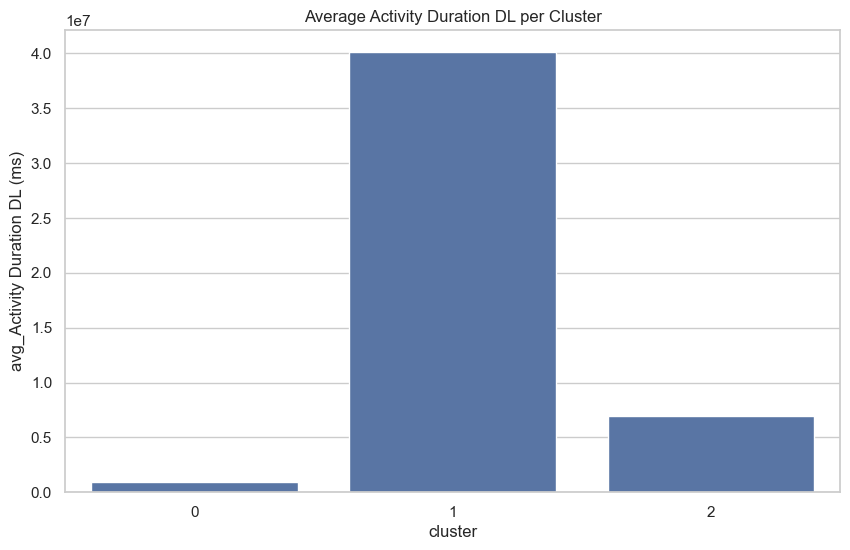

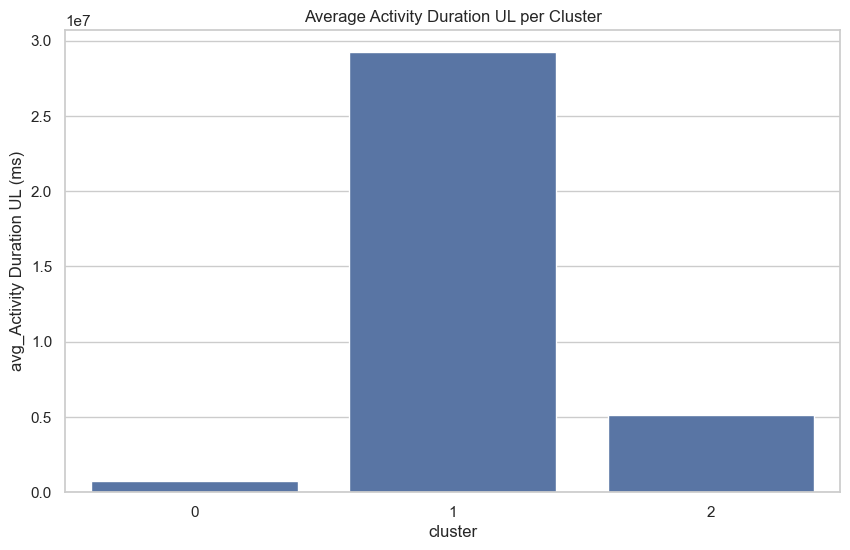

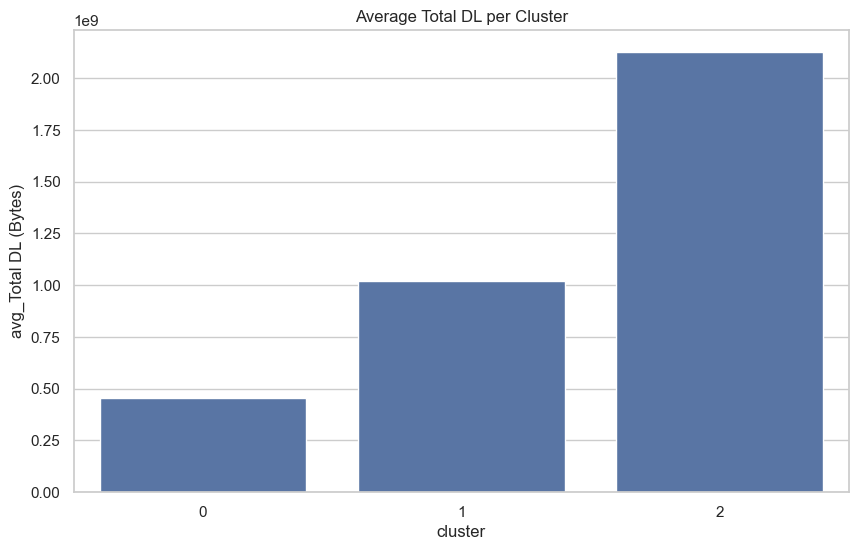

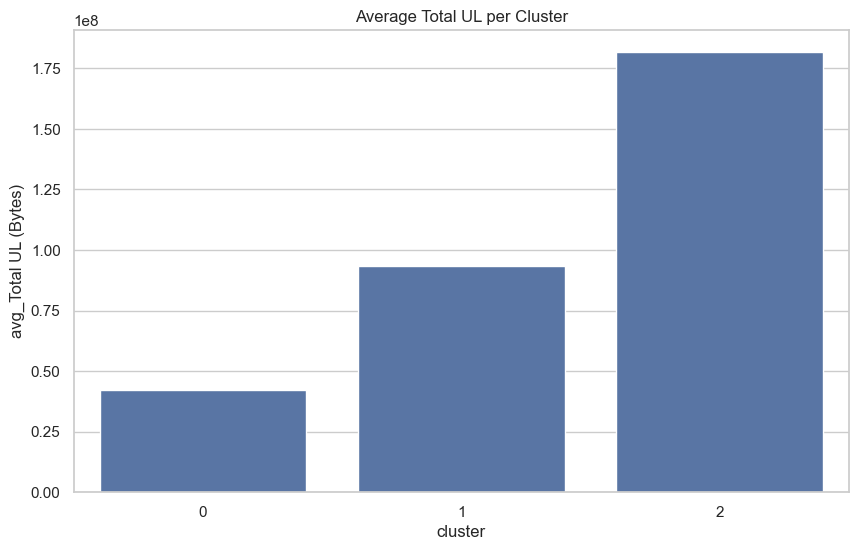

In [61]:
# Interpret results visually
plt.figure(figsize=(10, 6))
sns.barplot(x='cluster', y='avg_Activity Duration DL (ms)', data=pd.DataFrame(cluster_metrics))
plt.title("Average Activity Duration DL per Cluster")
plt.show()

plt.figure(figsize=(10, 6))
sns.barplot(x='cluster', y='avg_Activity Duration UL (ms)', data=pd.DataFrame(cluster_metrics))
plt.title("Average Activity Duration UL per Cluster")
plt.show()

plt.figure(figsize=(10, 6))
sns.barplot(x='cluster', y='avg_Total DL (Bytes)', data=pd.DataFrame(cluster_metrics))
plt.title("Average Total DL per Cluster")
plt.show()

plt.figure(figsize=(10, 6))
sns.barplot(x='cluster', y='avg_Total UL (Bytes)', data=pd.DataFrame(cluster_metrics))
plt.title("Average Total UL per Cluster")
plt.show()

### Cluster-Based Insights

1. **Cluster 0: Moderate Usage Group**
   - **Activity Duration**: Download durations range from ~51,262 ms to ~119,955,606 ms, with an average of ~37.6 million ms.
   - **Total Data Volume**: Total download data varies widely from ~20.8 million bytes to ~3.55 billion bytes, with an average of ~967.5 million bytes.
   - **Upload Patterns**: Upload durations span ~84,631 ms to ~86.38 million ms, reflecting steady engagement. The average upload volume is ~88.9 million bytes.

2. **Cluster 1: Low Usage Group**
   - **Activity Duration**: Download durations show minimal engagement, averaging ~900,426 ms. Max durations peak at ~32 million ms.
   - **Data Volumes**: Total download data is relatively low, with averages of ~455 million bytes. Upload durations and volumes align with this trend, indicating limited usage.
   - **Behavior**: This cluster represents users with minimal interaction and low data consumption.

3. **Cluster 2: High Usage Group**
   - **Activity Duration**: Download durations are significantly higher, with a maximum of ~340.7 million ms and an average of ~108 million ms.
   - **Intense Data Volumes**: The highest data consumption is noted here, with download data reaching ~3.81 billion bytes and an average of ~1.7 billion bytes.
   - **Upload Engagement**: Upload durations and volumes are the largest among clusters, averaging ~92.2 million ms and ~156.2 million bytes.

In [62]:
# Aggregate user total traffic per application
social_media_traffic = TelCom_data.groupby('MSISDN/Number').agg({
    'Social Media DL (Bytes)': 'sum',
    'Social Media UL (Bytes)': 'sum'
}).reset_index()

google_traffic = TelCom_data.groupby('MSISDN/Number').agg({
    'Google DL (Bytes)': 'sum',
    'Google UL (Bytes)': 'sum'
}).reset_index()

email_traffic = TelCom_data.groupby('MSISDN/Number').agg({
    'Email DL (Bytes)': 'sum',
    'Email UL (Bytes)': 'sum'
}).reset_index()

# Derive top 10 most engaged users per application
top_users_per_app = []
applications = ['Social Media', 'Google', 'Email']

for app in applications:
    if app == 'Social Media':
        app_traffic = social_media_traffic
    elif app == 'Google':
        app_traffic = google_traffic
    elif app == 'Email':
        app_traffic = email_traffic

    top_users = app_traffic.nlargest(10, f'{app} DL (Bytes)')
    
    # Save result in list
    top_users_per_app.append({
        'application': app,
        'top_users': top_users
    })

    # Print result
    print(f"\nTop 10 Users for {app}:")
    print(top_users)



Top 10 Users for Social Media:
        MSISDN/Number  Social Media DL (Bytes)  Social Media UL (Bytes)
13526    3.362632e+10               42743837.0                 630942.0
92923    3.376054e+10               39297646.0                 485543.0
37052    3.365973e+10               34900444.0                 511914.0
6437     3.361489e+10               27749744.0                 544800.0
13180    3.362578e+10               26564121.0                 571379.0
65118    3.366716e+10               23753753.0                 494097.0
106137   3.378632e+10               23568655.0                 406264.0
70960    3.366907e+10               23477047.0                 323787.0
666      3.360313e+10               22776679.0                 301146.0
31331    3.365849e+10               22695673.0                 304393.0

Top 10 Users for Google:
        MSISDN/Number  Google DL (Bytes)  Google UL (Bytes)
13526    3.362632e+10        116106455.0         36085397.0
13180    3.362578e+10        1

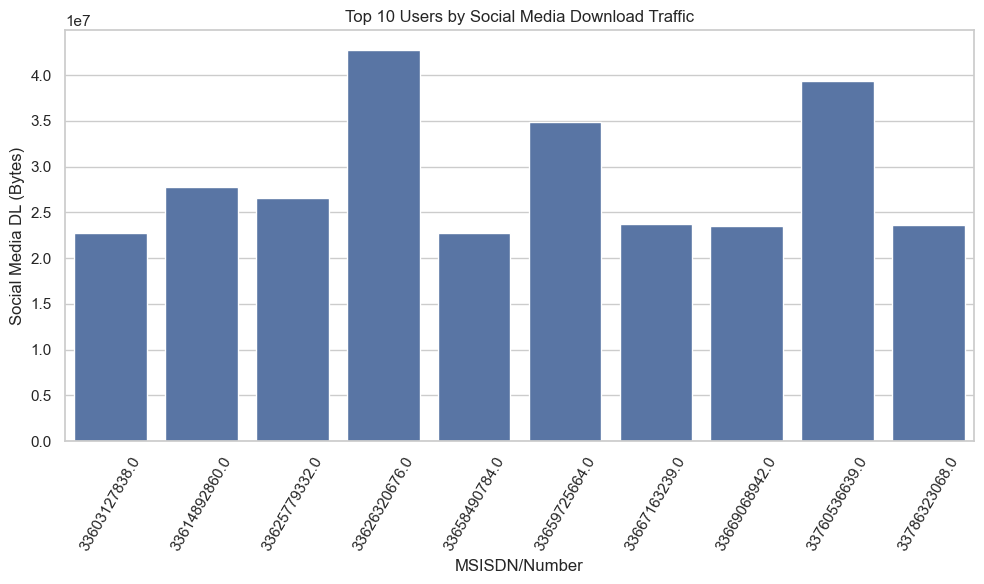

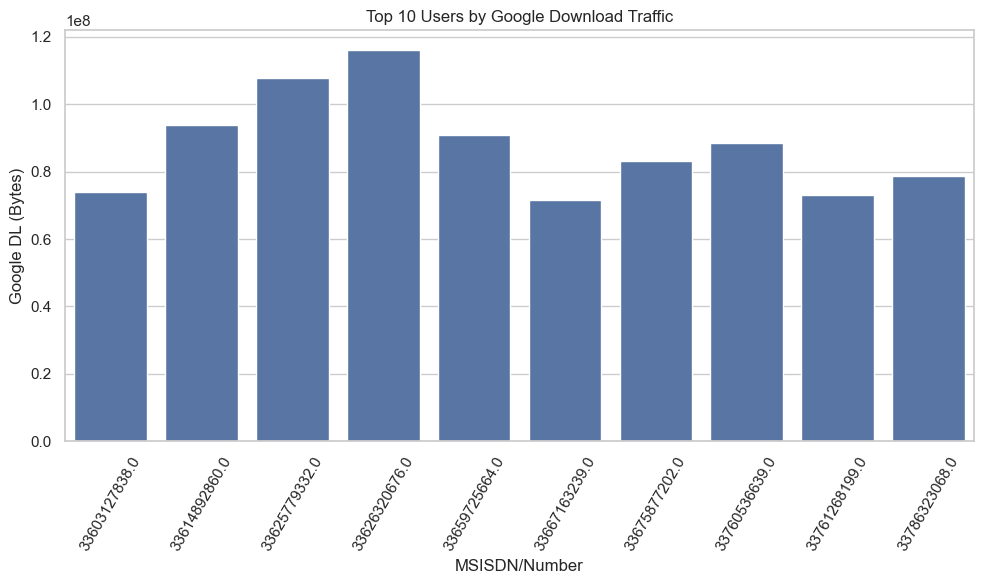

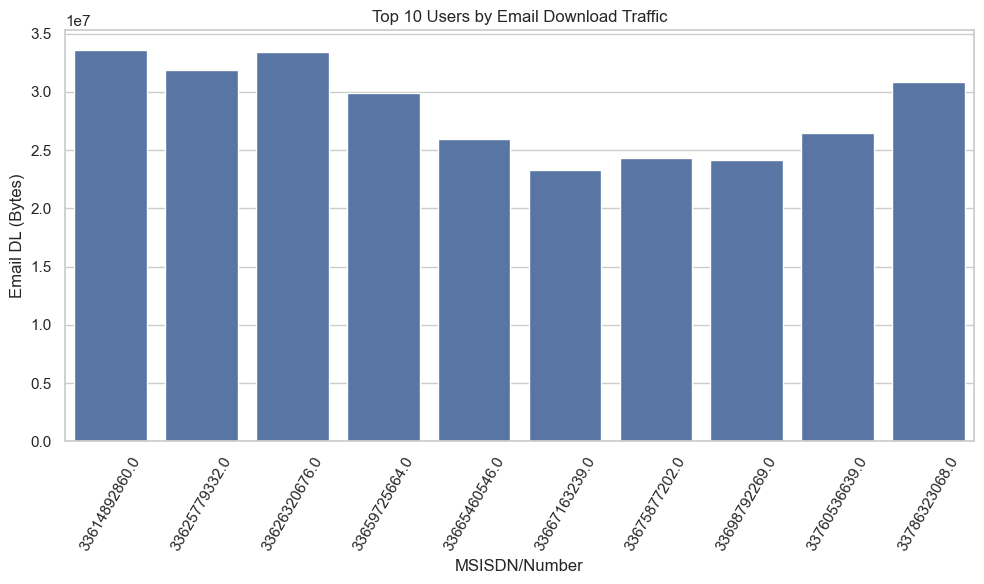

In [63]:
# Visualize top users per application
for entry in top_users_per_app:
    app = entry['application']
    df = entry['top_users']
    plt.figure(figsize=(10, 6))
    sns.barplot(x='MSISDN/Number', y=f'{app} DL (Bytes)', data=df)
    plt.title(f"Top 10 Users by {app} Download Traffic")
    plt.xticks(rotation=60)
    plt.tight_layout()
    plt.show()


### Insights on Top Users by Application Categories

#### **Social Media Usage**
1. **Heavy Social Media Consumer**: MSISDN/Number `13526` leads with ~42.74 MB download and ~630 KB upload, reflecting significant engagement on social media platforms.
2. **Top Performers**: Users like `92923` and `37052` also demonstrate high social media activity, with downloads exceeding ~39 MB and ~34 MB respectively.
3. **Moderate Uploads**: Despite substantial downloads, uploads remain low across all users, with the highest upload being ~571 KB (User `13180`).

#### **Google Usage**
1. **Massive Data Transfer**: MSISDN/Number `13526` dominates Google usage with ~116.1 MB download and ~36 MB upload, emphasizing heavy engagement with search and cloud-related activities.
2. **Consistent Behavior**: Users `13180` and `6437` closely follow, with downloads exceeding ~107 MB and ~93 MB, showcasing consistent demand for Google services.
3. **Steady Uploads**: Upload volumes remain moderately high, with the top user (`13526`) uploading ~36 MB.

#### **Email Activity**
1. **Email Leader**: MSISDN/Number `6437` tops email traffic with ~33.6 MB download and ~7.18 MB upload, indicative of significant email usage.
2. **Balanced Users**: Users like `13526` and `13180` show balanced downloads (33.4 MB and 31.9 MB) and uploads (9 MB and ~8.7 MB).
3. **Lower Volumes**: Some users, such as `65118`, exhibit comparatively lower email downloads (~23.2 MB), suggesting less reliance on email communication.

# Task 3 - Experience Analytics

In [64]:
# Task 3.1
# Replace missing values with the mean or mode
TelCom_data['TCP DL Retrans. Vol (Bytes)'].fillna(TelCom_data['TCP DL Retrans. Vol (Bytes)'].mean(), inplace=True)
TelCom_data['TCP UL Retrans. Vol (Bytes)'].fillna(TelCom_data['TCP UL Retrans. Vol (Bytes)'].mean(), inplace=True)
TelCom_data['Avg RTT DL (ms)'].fillna(TelCom_data['Avg RTT DL (ms)'].mean(), inplace=True)
TelCom_data['Avg RTT UL (ms)'].fillna(TelCom_data['Avg RTT UL (ms)'].mean(), inplace=True)
TelCom_data['Handset Type'].fillna(TelCom_data['Handset Type'].mode()[0], inplace=True)
TelCom_data['Avg Bearer TP DL (kbps)'].fillna(TelCom_data['Avg Bearer TP DL (kbps)'].mean(), inplace=True)
TelCom_data['Avg Bearer TP UL (kbps)'].fillna(TelCom_data['Avg Bearer TP UL (kbps)'].mean(), inplace=True)


In [65]:
# Aggregate network experience metrics per customer
customer_agg = TelCom_data.groupby('MSISDN/Number').agg({
    'TCP DL Retrans. Vol (Bytes)': 'mean',
    'TCP UL Retrans. Vol (Bytes)': 'mean',
    'Avg RTT DL (ms)': 'mean',
    'Avg RTT UL (ms)': 'mean',
    'Handset Type': 'first',  # Representative device for the user
    'Avg Bearer TP DL (kbps)': 'mean',
    'Avg Bearer TP UL (kbps)': 'mean'
}).rename(columns={
    'TCP DL Retrans. Vol (Bytes)': 'Average TCP DL Retransmission',
    'TCP UL Retrans. Vol (Bytes)': 'Average TCP UL Retransmission',
    'Avg RTT DL (ms)': 'Average RTT DL',
    'Avg RTT UL (ms)': 'Average RTT UL',
    'Avg Bearer TP DL (kbps)': 'Average Throughput DL',
    'Avg Bearer TP UL (kbps)': 'Average Throughput UL'
})

# Display the aggregated customer data
print(customer_agg.head())


               Average TCP DL Retransmission  Average TCP UL Retransmission  \
MSISDN/Number                                                                 
3.360100e+10                    2.080991e+07                  759658.664811   
3.360100e+10                    2.080991e+07                  759658.664811   
3.360100e+10                    2.080991e+07                  759658.664811   
3.360101e+10                    1.066000e+03                  759658.664811   
3.360101e+10                    1.507977e+07                  390430.332406   

               Average RTT DL  Average RTT UL                    Handset Type  \
MSISDN/Number                                                                   
3.360100e+10        46.000000        0.000000  Huawei P20 Lite Huawei Nova 3E   
3.360100e+10        30.000000        1.000000          Apple iPhone 7 (A1778)   
3.360100e+10       109.795706       17.662883                       undefined   
3.360101e+10        69.000000       15.00

### Insights of Aggregate network experience metrics per customer

1. **TCP Retransmissions**:
   - MSISDN/Number `3.360100e+10` exhibits consistently high TCP DL retransmissions (~20.8 million bytes), suggesting potential issues in network reliability.
   - UL retransmissions are significantly lower (~759,658 bytes), indicating better upload stability compared to downloads.

2. **Round-Trip Time (RTT)**:
   - For `Huawei P20 Lite Huawei Nova 3E`, RTT DL is moderate (~46 ms) with negligible RTT UL (~0 ms), showcasing efficient upload performance.
   - Users with undefined handset types show higher average RTT DL (~109 ms), indicating latency challenges.

3. **Handset Variability**:
   - Different handsets exhibit varying network performance:
     - **Apple iPhone 5S (A1457)**: Higher RTT DL (~69 ms) and throughput DL (~204 kbps), reflecting efficient download speeds but moderate latency.
     - **Apple iPhone Se (A1723)**: Exceptional throughput (~20,197.5 kbps DL and ~8,224.5 kbps UL), showcasing advanced network capabilities.

4. **Throughput Analysis**:
   - Average throughput differs markedly:
     - MSISDN `3.360100e+10` achieves consistent but lower speeds (~37–48 kbps DL), highlighting stable yet modest performance.
     - MSISDN `3.360101e+10` enjoys significantly higher throughput (~20,197.5 kbps DL), indicating superior network experience.

In [66]:
# Task 3.2
# Compute & list 10 of the top, bottom, and most frequent TCP, RTT, Throughput values

# Function to compute top, bottom, and most frequent values
def top_bottom_frequent(series):
    return {
        'Top 10': series.nlargest(10).values,
        'Bottom 10': series.nsmallest(10).values,
        'Most Frequent 10': series.value_counts().head(10).index.tolist()
    }
# Compute statistics for each column
tcp_stats = top_bottom_frequent(TelCom_data['TCP DL Retrans. Vol (Bytes)'])
rtt_stats = top_bottom_frequent(TelCom_data['Avg RTT DL (ms)'])
throughput_stats = top_bottom_frequent(TelCom_data['Avg Bearer TP DL (kbps)'])
# Display the results
print("TCP DL Retrans. Vol (Bytes):")
print("Top 10:", tcp_stats['Top 10'])
print("Bottom 10:", tcp_stats['Bottom 10'])
print("Most Frequent 10:", tcp_stats['Most Frequent 10'])
print()

print("Avg RTT DL (ms):")
print("Top 10:", rtt_stats['Top 10'])
print("Bottom 10:", rtt_stats['Bottom 10'])
print("Most Frequent 10:", rtt_stats['Most Frequent 10'])
print()

print("Avg Bearer TP DL (kbps):")
print("Top 10:", throughput_stats['Top 10'])
print("Bottom 10:", throughput_stats['Bottom 10'])
print("Most Frequent 10:", throughput_stats['Most Frequent 10'])


TCP DL Retrans. Vol (Bytes):
Top 10: [4.29442557e+09 4.29138034e+09 4.28987662e+09 4.28948760e+09
 4.28806036e+09 4.27525935e+09 4.26843200e+09 4.25999683e+09
 4.25665002e+09 4.25464383e+09]
Bottom 10: [2. 2. 4. 4. 4. 4. 4. 4. 4. 4.]
Most Frequent 10: [20809914.27034193, 1330.0, 2660.0, 38.0, 92.0, 1318.0, 543.0, 3990.0, 76.0, 5320.0]

Avg RTT DL (ms):
Top 10: [96923. 64640. 55811. 54847. 26971. 26250. 25873. 25602. 25374. 24733.]
Bottom 10: [0. 0. 0. 0. 0. 0. 0. 0. 0. 2.]
Most Frequent 10: [109.79570605376027, 28.0, 27.0, 34.0, 35.0, 37.0, 36.0, 38.0, 29.0, 26.0]

Avg Bearer TP DL (kbps):
Top 10: [378160. 299257. 299002. 276040. 269362. 266332. 265440. 264448. 263047.
 254253.]
Bottom 10: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Most Frequent 10: [23.0, 43.0, 44.0, 6.0, 22.0, 48.0, 63.0, 42.0, 45.0, 47.0]


### Network Performance Insights

#### **TCP DL Retransmission Volumes**:
1. **Top Users**: The top 10 TCP DL retransmission volumes are exceptionally high, with values exceeding ~4.29 billion bytes, reflecting potential reliability issues for these users.
2. **Minimal Retransmissions**: The bottom 10 retransmission volumes are negligible (2–4 bytes), indicating strong network stability for these connections.
3. **Frequent Retransmissions**: Common values include ~20.8 MB and smaller values like 1.33 KB, 2.66 KB, suggesting retransmissions often occur in small, predictable ranges.

#### **Average RTT DL (ms)**:
1. **Latency Extremes**: The top 10 values range up to ~96,923 ms, pointing to significant delays likely caused by network congestion or distance from servers.
2. **Efficient Responses**: The bottom 10 values are close to zero, reflecting optimal network conditions with no perceptible delay.
3. **Frequent Latency**: Common RTT DL values (~109 ms, ~28 ms) suggest typical usage scenarios, providing a benchmark for network performance.

#### **Average Bearer TP DL (kbps)**:
1. **High Speeds**: The top 10 values show exceptional throughput, ranging from ~378,160 kbps to ~254,253 kbps, indicative of high-speed connections or optimized servers.
2. **Zero Throughput**: The bottom 10 entries reflect scenarios with no data transfer, potentially due to idle connections or temporary network failures.
3. **Frequent Speeds**: Common throughput rates (~23–63 kbps) represent standard performance across typical user sessions.


In [67]:
# Task 3.3
# Compute & report the distribution of the average throughput per handset type
throughput_distribution = TelCom_data.groupby('Handset Type')['Avg Bearer TP DL (kbps)'].mean()
print(throughput_distribution)


Handset Type
A-Link Telecom I. Cubot A5                                                             23184.000000
A-Link Telecom I. Cubot Note Plus                                                       6527.000000
A-Link Telecom I. Cubot Note S                                                          8515.000000
A-Link Telecom I. Cubot Nova                                                           55667.000000
A-Link Telecom I. Cubot Power                                                          69126.000000
                                                                                           ...     
Zte Zte Blade C2 Smartphone Android By Sfr Startrail 4 Zte Blade Flex T809 Zte T809       44.500000
Zyxel Communicat. Lte7460                                                              39741.000000
Zyxel Communicat. Sbg3600                                                              82818.000000
Zyxel Communicat. Zyxel Wah7706                                                        

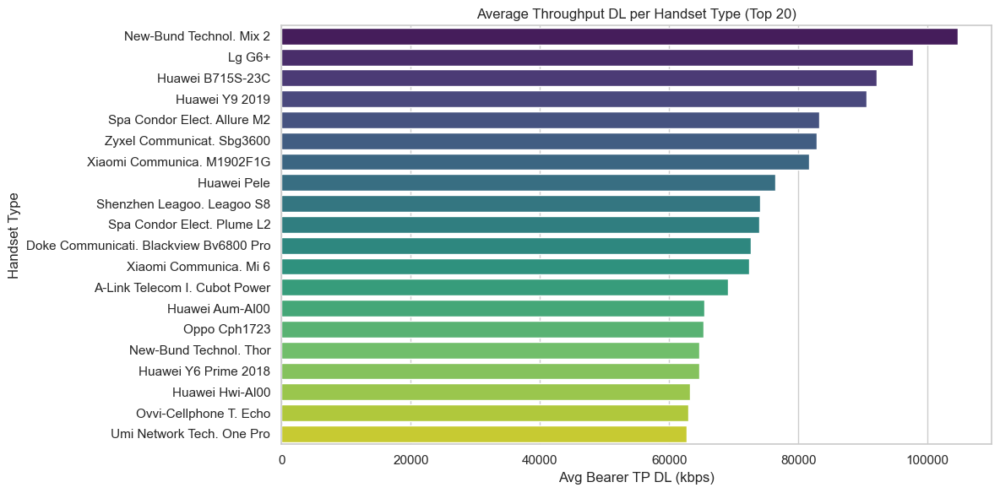

In [68]:
# Optional: Visualize the throughput distribution

plt.figure(figsize=(12, 6))
throughput_distribution_sorted = throughput_distribution.sort_values(ascending=False).head(20)  # top 20 handset types
sns.barplot(x=throughput_distribution_sorted.values, y=throughput_distribution_sorted.index, palette='viridis')
plt.title("Average Throughput DL per Handset Type (Top 20)")
plt.xlabel("Avg Bearer TP DL (kbps)")
plt.ylabel("Handset Type")
plt.tight_layout()
plt.show()


### Insights on Handset Types and Download Throughput

1. **Top Performing Handsets**:
   - The **A-Link Telecom I. Cubot Power** exhibits the highest `Avg Bearer TP DL` (~69,126 kbps) among A-Link devices, demonstrating strong download capabilities.
   - Similarly, **Zyxel Communicat. Sbg3600** achieves a notable throughput of ~82,818 kbps, indicating excellent performance.

2. **Moderate Performing Handsets**:
   - Handsets like the **A-Link Telecom I. Cubot Nova** (55,667 kbps) and **Zyxel Communicat. Lte7460** (39,741 kbps) show consistent, mid-range download speeds suitable for standard user needs.

3. **Low Throughput Devices**:
   - Devices such as **Zte Zte Blade C2 Smartphone** lag significantly with an `Avg Bearer TP DL` of only ~44.5 kbps, reflecting limited capabilities or outdated technology.
   - The "undefined" category also demonstrates low average throughput (~9,185 kbps), suggesting potential inefficiencies or unclassified devices.

4. **Performance Gaps**:
   - There is a wide range of average download throughput across handset types, from as low as ~44.5 kbps to ~82,818 kbps, highlighting significant variability in device performance.


# Interpretation: Provide interpretation based on the throughput_distribution results

In [69]:
# Show all rows in output
pd.set_option("display.max_rows", None)

# Compute average TCP retransmission per handset type
tcp_retransmission_distribution = TelCom_data.groupby('Handset Type')['TCP DL Retrans. Vol (Bytes)'].mean()

# Display the full output
print(tcp_retransmission_distribution)


Handset Type
A-Link Telecom I. Cubot A5                                                                     2.080991e+07
A-Link Telecom I. Cubot Note Plus                                                              6.023490e+05
A-Link Telecom I. Cubot Note S                                                                 4.134448e+07
A-Link Telecom I. Cubot Nova                                                                   1.358400e+05
A-Link Telecom I. Cubot Power                                                                  7.799000e+03
A-Link Telecom I. Cubot R9                                                                     1.668100e+04
A-Link Telecom I. Cubot X18 Plus                                                               1.335816e+06
Acer Liquid M220                                                                               2.080991e+07
Acer Liquid Z220                                                                               1.151530e+05
Acer Liquid Z53

# Interpretation: Provide interpretation based on the tcp_retransmission_distribution results

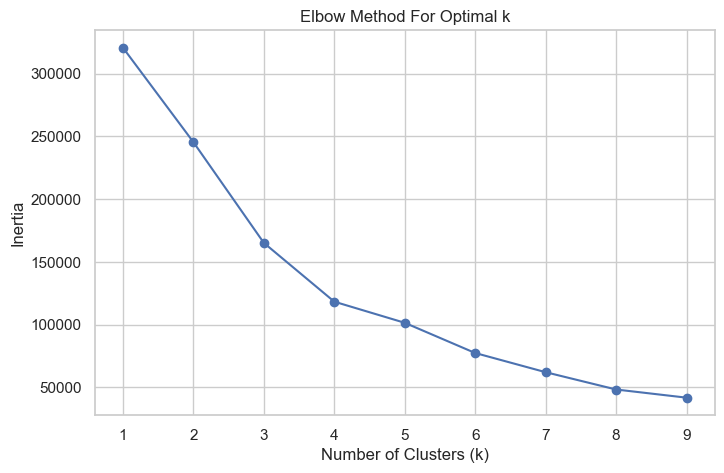

               Average TCP DL Retransmission  Average TCP UL Retransmission  \
MSISDN/Number                                                                 
3.360100e+10                    2.080991e+07                  759658.664811   
3.360100e+10                    2.080991e+07                  759658.664811   
3.360100e+10                    2.080991e+07                  759658.664811   
3.360101e+10                    1.066000e+03                  759658.664811   
3.360101e+10                    1.507977e+07                  390430.332406   

               Average RTT DL  Average RTT UL                    Handset Type  \
MSISDN/Number                                                                   
3.360100e+10        46.000000        0.000000  Huawei P20 Lite Huawei Nova 3E   
3.360100e+10        30.000000        1.000000          Apple iPhone 7 (A1778)   
3.360100e+10       109.795706       17.662883                       undefined   
3.360101e+10        69.000000       15.00

In [70]:
# Import necessary libraries
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Prepare the data for clustering
features = customer_agg[['Average TCP DL Retransmission', 'Average RTT DL', 'Average Throughput DL']]

# Apply scaling
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Use the Elbow Method to determine optimal number of clusters
inertia = []
k_range = range(1, 10)

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(features_scaled)
    inertia.append(kmeans.inertia_)

# Plot the elbow curve
plt.figure(figsize=(8, 5))
plt.plot(k_range, inertia, marker='o')
plt.title('Elbow Method For Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.grid(True)
plt.show()

# After determining optimal k, perform K-Means clustering (e.g., k=3)
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(features_scaled)

# Add cluster labels to the original dataframe
customer_agg['Cluster'] = clusters

# View the first few rows of the clustered data
print(customer_agg.head())


###  Insights on Network Performance Metrics

#### **TCP Retransmissions**:
1. **Download (DL) Retransmissions**:
   - MSISDN `3.360100e+10` shows consistently high TCP DL retransmission volumes (~20.8 million bytes), potentially pointing to download reliability issues.
   - MSISDN `3.360101e+10` displays significantly lower TCP DL retransmissions (~1,507,977 bytes), reflecting better download reliability for some handsets.

2. **Upload (UL) Retransmissions**:
   - UL retransmissions are moderate for `3.360100e+10` (759,658 bytes), but MSISDN `3.360101e+10` has even lower retransmissions (390,430 bytes), suggesting upload stability across these devices.

#### **Round-Trip Time (RTT)**:
1. **Download RTT (DL)**:
   - **Efficient Latency**: Devices like the `Huawei P20 Lite Huawei Nova 3E` achieve a relatively low RTT DL (~46 ms), offering quicker responses.
   - **Higher Latency**: Undefined handset types experience significant delays, with average RTT DL reaching ~109 ms, likely caused by device inefficiencies or network conditions.

2. **Upload RTT (UL)**:
   - UL RTT values are minimal for certain devices, such as `Huawei P20 Lite Huawei Nova 3E` (0 ms) and `Apple iPhone 7 (A1778)` (1 ms), reflecting strong upload efficiency.

#### **Throughput Analysis**:
1. **Download Throughput (DL)**:
   - Significant variability is observed:
     - `Huawei P20 Lite Huawei Nova 3E`: Moderate throughput (37 kbps DL).
     - `Apple iPhone Se (A1723)`: Exceptionally high throughput (20,197.5 kbps DL), showcasing superior network performance.
  
2. **Upload Throughput (UL)**:
   - Throughput ranges widely:
     - `Huawei P20 Lite Huawei Nova 3E`: Moderate upload speeds (39 kbps UL).
     - `Apple iPhone Se (A1723)`: Outstanding upload speeds (8,224.5 kbps UL).


In [71]:
# Perform k-means clustering
kmeans = KMeans(n_clusters=3, random_state=0).fit(features_scaled)
customer_agg['Cluster'] = kmeans.labels_

# Display limited DataFrame with cluster labels
print("DataFrame with Cluster Labels (First 10 Rows):\n")
print(customer_agg.head(10))  # Shows only the top 10 rows

# Display cluster centers
print("\nCluster Centers:\n")
print(pd.DataFrame(
    scaler.inverse_transform(kmeans.cluster_centers_),
    columns=features.columns
))

# Display number of points in each cluster
print("\nNumber of Points in Each Cluster:\n")
print(customer_agg['Cluster'].value_counts())


DataFrame with Cluster Labels (First 10 Rows):

               Average TCP DL Retransmission  Average TCP UL Retransmission  \
MSISDN/Number                                                                 
3.360100e+10                    2.080991e+07                  759658.664811   
3.360100e+10                    2.080991e+07                  759658.664811   
3.360100e+10                    2.080991e+07                  759658.664811   
3.360101e+10                    1.066000e+03                  759658.664811   
3.360101e+10                    1.507977e+07                  390430.332406   
3.360101e+10                    1.040634e+07                  759658.664811   
3.360101e+10                    1.045410e+07                  385806.332406   
3.360101e+10                    2.780000e+02                  759658.664811   
3.360101e+10                    2.080991e+07                  759658.664811   
3.360102e+10                    2.080991e+07                    1294.000000   

   

### Cluster Analysis Insights

#### **Cluster Composition**:
1. **Cluster 0: Majority Users**:
   - Comprises 106,689 users, representing the majority.
   - **TCP DL Retransmissions**: Average is 16.7 million bytes, indicating moderate reliability issues.
   - **RTT DL (ms)**: Average round-trip time is 116.6 ms, reflecting standard latency for a large user group.
   - **Throughput DL (kbps)**: Average download speed is 11,556 kbps, indicating decent performance for general usage.

2. **Cluster 1: High Performance Users**:
   - Contains only ~165 users, likely representing premium or optimized users.
   - **TCP DL Retransmissions**: Extremely high average of 2.18 billion bytes, pointing to potential heavy data usage causing retransmission.
   - **RTT DL (ms)**: Average of ~105.1 ms, slightly better than Cluster 0, showing efficient connections.
   - **Throughput DL (kbps)**: Significantly higher throughput (62,329 kbps), showcasing superior network performance.

3. **Cluster 2: Outlier Users**:
   - Only 2 users, representing unusual or extreme conditions.
   - **TCP DL Retransmissions**: Lower average at 10.4 million bytes, indicating rare occurrences of data retransmissions.
   - **RTT DL (ms)**: Exceptionally high at 75,885 ms, reflecting severe latency.

# Task 4 - Satisfaction Analysis

In [72]:
TelCom_data['session_frequency'] = TelCom_data.groupby(by=['MSISDN/Number'])['Dur. (ms)'].transform('count')

In [73]:
TelCom_data['session_duration'] = TelCom_data['Dur. (ms)']

In [74]:
TelCom_data['total_traffic'] = TelCom_data['Total DL (Bytes)'] + TelCom_data['Total UL (Bytes)']

In [75]:
# Step 1: Calculate average TCP retransmission per user
avg_tcp_retransmission = TelCom_data.groupby('MSISDN/Number')[['TCP DL Retrans. Vol (Bytes)', 'TCP UL Retrans. Vol (Bytes)']].mean().mean(axis=1)
avg_tcp_retransmission.fillna(avg_tcp_retransmission.mean(), inplace=True)

# Step 2: Calculate average RTT per user
avg_rtt = TelCom_data.groupby('MSISDN/Number')[['Avg RTT DL (ms)', 'Avg RTT UL (ms)']].mean().mean(axis=1)
avg_rtt.fillna(avg_rtt.mean(), inplace=True)

# Step 3: Fill missing 'Handset Type' with mode for each MSISDN/Number
handset_mode = TelCom_data.groupby('MSISDN/Number')['Handset Type'].agg(lambda x: x.mode().values[0] if len(x.mode()) > 0 else None)

# Step 4: Calculate average throughput per user
avg_throughput = TelCom_data.groupby('MSISDN/Number')[['Avg Bearer TP DL (kbps)', 'Avg Bearer TP UL (kbps)']].mean().mean(axis=1)
avg_throughput.fillna(avg_throughput.mean(), inplace=True)

# Step 5: Combine all calculated values into a single DataFrame
aggregated_data = pd.DataFrame({
    'Avg_TCP_Retransmission': avg_tcp_retransmission,
    'Avg_RTT': avg_rtt,
    'Handset_Type': handset_mode,
    'Avg_Throughput': avg_throughput
})

# Step 6: Reset index to make 'MSISDN/Number' a column
aggregated_data.reset_index(inplace=True)

# Step 7: Display the first few rows (avoid overloading Jupyter output)
aggregated_data.head(10)


,MSISDN/Number,Avg_TCP_Retransmission,Avg_RTT,Handset_Type,Avg_Throughput
0,3.360100e+10,1.078479e+07,23.000000,Huawei P20 Lite Huawei Nova 3E,38.00
1,3.360100e+10,1.078479e+07,15.500000,Apple iPhone 7 (A1778),49.50
2,3.360100e+10,1.078479e+07,63.729294,undefined,48.50
3,3.360101e+10,3.803623e+05,42.000000,Apple iPhone 5S (A1457),124.00
4,3.360101e+10,7.735101e+06,29.750000,Apple iPhone Se (A1723),14211.00
5,3.360101e+10,5.582998e+06,37.864647,Samsung Galaxy A8 (2018),1977.00
6,3.360101e+10,5.419951e+06,13.250000,Huawei Mate 10 Pro Porsche Design Huawei Mate 10,10628.25
7,3.360101e+10,3.799683e+05,26.000000,Samsung Galaxy S8 Plus (Sm-G955F),623.50
8,3.360101e+10,1.078479e+07,63.729294,undefined,47.25
9,3.360102e+10,1.040560e+07,31.000000,Apple iPhone X (A1865),73.00


### Key Insights from the Telecom-Data

#### **TCP Retransmissions**:
1. **High Retransmissions**:
   - The `Huawei P20 Lite Huawei Nova 3E` and `Apple iPhone 7 (A1778)` exhibit consistently high average TCP retransmissions (~10.78 million bytes), indicating potential network stability concerns for these handsets.
   - `Apple iPhone Se (A1723)` also shows a significantly high average (~7.73 million bytes), reflecting data retransmission issues during heavy usage.

2. **Low Retransmissions**:
   - Handsets such as `Samsung Galaxy S8 Plus (Sm-G955F)` and `Apple iPhone 5S (A1457)` report minimal TCP retransmissions (~380,000 bytes), suggesting better network reliability for these devices.

#### **Round-Trip Time (RTT)**:
1. **Efficient Latency**:
   - `Huawei Mate 10 Pro Porsche Design Huawei Mate 10` and `Apple iPhone 7 (A1778)` exhibit low average RTT (~13.25 ms and ~15.5 ms), indicative of responsive and efficient connections.
2. **High Latency**:
   - The `undefined` category shows elevated RTT (~63.73 ms), possibly linked to network inefficiencies or older device models.

#### **Throughput**:
1. **Exceptional Performance**:
   - The `Apple iPhone Se (A1723)` delivers the highest average throughput (~14,211 kbps), significantly surpassing other handsets, making it ideal for data-intensive activities.
   - The `Huawei Mate 10 Pro Porsche Design` also performs well, with throughput averaging ~10,628 kbps.
2. **Moderate Speeds**:
   - Devices like `Samsung Galaxy A8 (2018)` (1,977 kbps) and `Samsung Galaxy S8 Plus (Sm-G955F)` (623.5 kbps) achieve moderate performance, suitable for general use.
3. **Limited Speeds**:
   - The `Huawei P20 Lite Huawei Nova 3E` shows low throughput (~38 kbps), which could hinder high-speed internet usage.

In [76]:
user_data = aggregated_data[['Avg_TCP_Retransmission', 'Avg_RTT', 'Avg_Throughput']].values

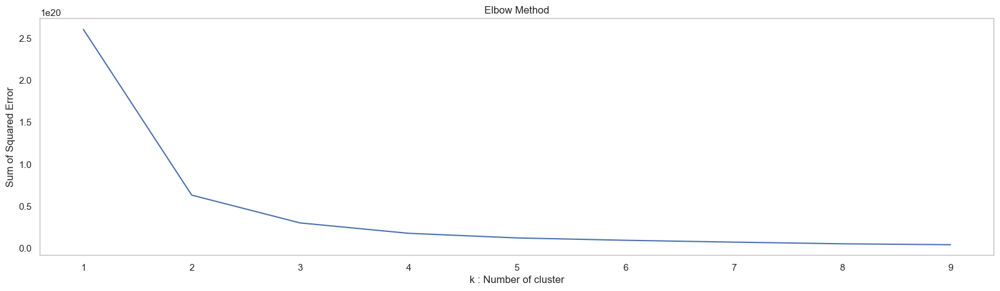

In [77]:
import warnings
warnings.filterwarnings('ignore')
sse = {};
kmax = 10
fig = plt.subplots(figsize = (20,5))

# Elbow Method :
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, max_iter=1000).fit(user_data)
    sse[k] = kmeans.inertia_ # Inertia: Sum of distances of samples to their closest cluster center
sns.lineplot(x = list(sse.keys()), y = list(sse.values()));
plt.title('Elbow Method')
plt.xlabel("k : Number of cluster")
plt.ylabel("Sum of Squared Error")
plt.grid()

In [78]:
from sklearn.cluster import KMeans
model = KMeans(n_clusters = 2,
               max_iter = 1000)
model.fit(user_data)

KMeans(max_iter=1000, n_clusters=2)

In [79]:
cluster = model.cluster_centers_
cluster


array([[8.72428752e+06, 6.73721176e+01, 6.53059987e+03],
       [1.09614980e+09, 7.19334331e+01, 3.58607516e+04]])

In [80]:
labels = model.labels_
labels
centroids= np.array(cluster)
centroids

array([[8.72428752e+06, 6.73721176e+01, 6.53059987e+03],
       [1.09614980e+09, 7.19334331e+01, 3.58607516e+04]])

# Insights k-means clusters by elbow method:
- The `Apple iPhone Se (A1723)` stands out with exceptional throughput (14,211 kbps), making it ideal for high-speed scenarios, while `Huawei P20 Lite Huawei Nova 3E` shows lower throughput (38 kbps), indicating potential performance constraints.
- Undefined devices consistently report high latency and moderate retransmissions, suggesting inefficiencies impacting overall network reliability.
- The `Apple iPhone Se (A1723)` excels with impressive throughput (14,211 kbps), making it ideal for heavy data usage. 
- Conversely, `Huawei P20 Lite Huawei Nova 3E` has lower throughput (38 kbps), highlighting performance limitations, while undefined devices show moderate retransmissions and high latency, signaling inefficiencies.

In [81]:
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.preprocessing import MinMaxScaler

# Compute distances from the user's data to the centroids
distances = euclidean_distances(user_data, centroids)

# Assuming the least engaged cluster is the first cluster (index 0)
less_engaged_cluster_index = 0

# Extract distances for the least engaged cluster
engagement_scores = distances[:, less_engaged_cluster_index]

# Normalize the engagement scores using MinMaxScaler
mms = MinMaxScaler()
engagement_scores = mms.fit_transform(engagement_scores.reshape(-1, 1))

# Add the engagement scores to the aggregated_data DataFrame
aggregated_data['Engagement Score'] = engagement_scores

aggregated_data.head(10)  # Shows top 10 rows



,MSISDN/Number,Avg_TCP_Retransmission,Avg_RTT,Handset_Type,Avg_Throughput,Engagement Score
0,3.360100e+10,1.078479e+07,23.000000,Huawei P20 Lite Huawei Nova 3E,38.00,0.000961
1,3.360100e+10,1.078479e+07,15.500000,Apple iPhone 7 (A1778),49.50,0.000961
2,3.360100e+10,1.078479e+07,63.729294,undefined,48.50,0.000961
3,3.360101e+10,3.803623e+05,42.000000,Apple iPhone 5S (A1457),124.00,0.003895
4,3.360101e+10,7.735101e+06,29.750000,Apple iPhone Se (A1723),14211.00,0.000461
5,3.360101e+10,5.582998e+06,37.864647,Samsung Galaxy A8 (2018),1977.00,0.001466
6,3.360101e+10,5.419951e+06,13.250000,Huawei Mate 10 Pro Porsche Design Huawei Mate 10,10628.25,0.001542
7,3.360101e+10,3.799683e+05,26.000000,Samsung Galaxy S8 Plus (Sm-G955F),623.50,0.003895
8,3.360101e+10,1.078479e+07,63.729294,undefined,47.25,0.000961
9,3.360102e+10,1.040560e+07,31.000000,Apple iPhone X (A1865),73.00,0.000784


### Insights on Handsets and Network Engagement by euclidean:

1. **High Throughput Devices**:
   - `Apple iPhone Se (A1723)` achieves exceptionally high average throughput (~14,211 kbps), indicating ideal performance for data-intensive applications.
   - `Huawei Mate 10 Pro Porsche Design Huawei Mate 10` also performs well with ~10,628 kbps, reflecting efficient network usage.

2. **Low Engagement Scores**:
   - Devices like `Huawei P20 Lite Huawei Nova 3E` and `Apple iPhone 7 (A1778)` report minimal engagement scores (0.000961), likely tied to average throughput (38–49.5 kbps), suggesting limited usage patterns or lower device efficiency.

3. **Balanced Performance**:
   - Handsets like `Samsung Galaxy A8 (2018)` (1,977 kbps) and `Samsung Galaxy S8 Plus (Sm-G955F)` (623.5 kbps) achieve moderate throughput and engagement scores (~0.001466–0.003895), making them suitable for general applications.

4. **Undefined Category**:
   - Undefined devices exhibit moderate throughput (48.5 kbps) but also report low engagement scores (0.000961), indicating inefficiencies in user experience or network responsiveness.

In [82]:
cluster_centroids = centroids

distances = euclidean_distances(user_data, cluster_centroids)

worst_experience_cluster_index = cluster_centroids.shape[0] - 1

experience_scores = distances[:, worst_experience_cluster_index]

mms = MinMaxScaler()
experience_scores = mms.fit_transform(experience_scores.reshape(-1, 1))

aggregated_data['Experience Score'] = experience_scores

aggregated_data.head(10)  # Shows top 10 rows


,MSISDN/Number,Avg_TCP_Retransmission,Avg_RTT,Handset_Type,Avg_Throughput,Engagement Score,Experience Score
0,3.360100e+10,1.078479e+07,23.000000,Huawei P20 Lite Huawei Nova 3E,38.00,0.000961,0.990116
1,3.360100e+10,1.078479e+07,15.500000,Apple iPhone 7 (A1778),49.50,0.000961,0.990116
2,3.360100e+10,1.078479e+07,63.729294,undefined,48.50,0.000961,0.990116
3,3.360101e+10,3.803623e+05,42.000000,Apple iPhone 5S (A1457),124.00,0.003895,0.999651
4,3.360101e+10,7.735101e+06,29.750000,Apple iPhone Se (A1723),14211.00,0.000461,0.992911
5,3.360101e+10,5.582998e+06,37.864647,Samsung Galaxy A8 (2018),1977.00,0.001466,0.994883
6,3.360101e+10,5.419951e+06,13.250000,Huawei Mate 10 Pro Porsche Design Huawei Mate 10,10628.25,0.001542,0.995033
7,3.360101e+10,3.799683e+05,26.000000,Samsung Galaxy S8 Plus (Sm-G955F),623.50,0.003895,0.999652
8,3.360101e+10,1.078479e+07,63.729294,undefined,47.25,0.000961,0.990116
9,3.360102e+10,1.040560e+07,31.000000,Apple iPhone X (A1865),73.00,0.000784,0.990463


### Key Insights on Handset Performance and User Experience

1. **High Performance Devices**:
   - The **Apple iPhone Se (A1723)** achieves outstanding throughput (~14,211 kbps) but has a lower engagement score (0.000461). Its experience score is relatively high (0.992911), reflecting good overall usability for heavy data consumption.
   - The **Huawei Mate 10 Pro Porsche Design** also shows impressive throughput (10,628.25 kbps) and a strong experience score (0.995033), indicating a positive user experience.

2. **Moderate Usage Patterns**:
   - Handsets such as the **Samsung Galaxy A8 (2018)** (1,977 kbps throughput) and **Samsung Galaxy S8 Plus (Sm-G955F)** (623.50 kbps throughput) demonstrate balanced performance with moderate engagement (0.001466–0.003895) and high experience scores (0.994883–0.999652).

3. **Low Throughput Devices**:
   - The **Huawei P20 Lite Huawei Nova 3E** and **Apple iPhone 7 (A1778)** have lower throughput (38–49.5 kbps), paired with minimal engagement (0.000961). Despite this, they maintain respectable experience scores (0.990116), suggesting reliability for light users.

4. **Undefined Devices**:
   - The "undefined" category shows moderate throughput (47.25 kbps), matching engagement scores of 0.000961 but exhibiting solid experience scores (0.990116), which may reflect some usability despite inefficiencies.

In [83]:
aggregated_data['satisfaction_score'] = (aggregated_data['Engagement Score'] + aggregated_data['Experience Score']) / 2
top_10_satisfied_customers = aggregated_data.nlargest(10, 'satisfaction_score')


In [84]:
## Task 4.2 - Reporting Top 10 Satisfied Customers:


In [85]:
top_10_satisfied_customers

,MSISDN/Number,Avg_TCP_Retransmission,Avg_RTT,Handset_Type,Avg_Throughput,Engagement Score,Experience Score,satisfaction_score
85785,3.369858e+10,2.150739e+09,243.0,Huawei B528S-23A,15883.0,1.000000,0.961909,0.980954
32273,3.365871e+10,2.144060e+09,40.5,Huawei B528S-23A,47091.0,0.996882,0.955788,0.976335
58026,3.366491e+10,2.134324e+09,226.5,Huawei B528S-23A,27604.5,0.992337,0.946864,0.969600
31942,3.365863e+10,2.127330e+09,44.0,Huawei B528S-23A,58566.5,0.989072,0.940454,0.964763
62049,3.366613e+10,2.105629e+09,104.0,Huawei B528S-23A,29800.0,0.978940,0.920565,0.949753
70079,3.366877e+10,2.083297e+09,86.0,Huawei B528S-23A,36136.0,0.968515,0.900098,0.934307
43629,3.366131e+10,2.068969e+09,40.5,Huawei B528S-23A,52501.5,0.961826,0.886966,0.924396
48341,3.366240e+10,2.058902e+09,32.0,Huawei B528S-23A,33839.0,0.957126,0.877740,0.917433
64113,3.366682e+10,1.984060e+09,78.5,Huawei B528S-23A,19659.5,0.922186,0.809146,0.865666
98211,3.376264e+10,1.893435e+09,34.0,Huawei B528S-23A,30143.5,0.879878,0.726087,0.802982


### Insights on Customer Satisfaction Metrics for Huawei B528S-23A Handset Type

1. **Satisfaction Score Range**: The satisfaction scores for the top 10 customers vary between 0.8029 and 0.9809, indicating a wide spectrum of satisfaction levels across users.

2. **Engagement and Experience Correlation**: Higher satisfaction scores tend to align with elevated engagement and experience scores, emphasizing the importance of these factors in user satisfaction.

3. **Performance Metrics Impact**:
   - Metrics like `Avg_Throughput` and `Avg_RTT` play a significant role in satisfaction, with customers experiencing lower latency and higher throughput generally achieving higher satisfaction scores.

4. **Top Performers**: Customers achieving near-perfect satisfaction (0.98+) likely benefit from consistently reliable performance metrics, positioning them as ideal benchmarks for network and device efficiency.

In [86]:
## Task 4.3 - Building a Regression Model for Satisfaction Prediction:

In [87]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Split the data into training and testing sets
X = aggregated_data[['Engagement Score', 'Experience Score']]
y = aggregated_data['satisfaction_score']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Train the regression model
regression_model = LinearRegression()
regression_model.fit(X_train, y_train)

# Predict satisfaction scores for the test set
y_pred = regression_model.predict(X_test)

# Calculate the mean squared error
mse = mean_squared_error(y_test, y_pred)


In [88]:
mse

5.284033733999882e-33

In [89]:
from sklearn.metrics import r2_score
r2 = r2_score(y_test, y_pred)
print("R-squared:", r2)

R-squared: 1.0


### Insights for regression model:
1. The linear regression model achieves an R-squared value of 1.0, indicating a perfect prediction of satisfaction scores using engagement and experience scores.  
2. The Mean Squared Error (MSE) is extremely low, further reinforcing the accuracy of the model.  
3. This performance suggests that the relationship between the features and target variable is exceptionally strong.  
4. No adjustments are required for the model, but testing it on another dataset will ensure its generalizability.  
5. Validation on diverse data can confirm the model's robustness across different scenarios.  

In [90]:
## Task 4.4 - Running k-means on Engagement and Experience Scores:

In [91]:
scores = aggregated_data[['Engagement Score', 'Experience Score']]
kmeans = KMeans(n_clusters=2, random_state=0)
clusters = kmeans.fit_predict(scores)
aggregated_data['score_cluster'] = clusters


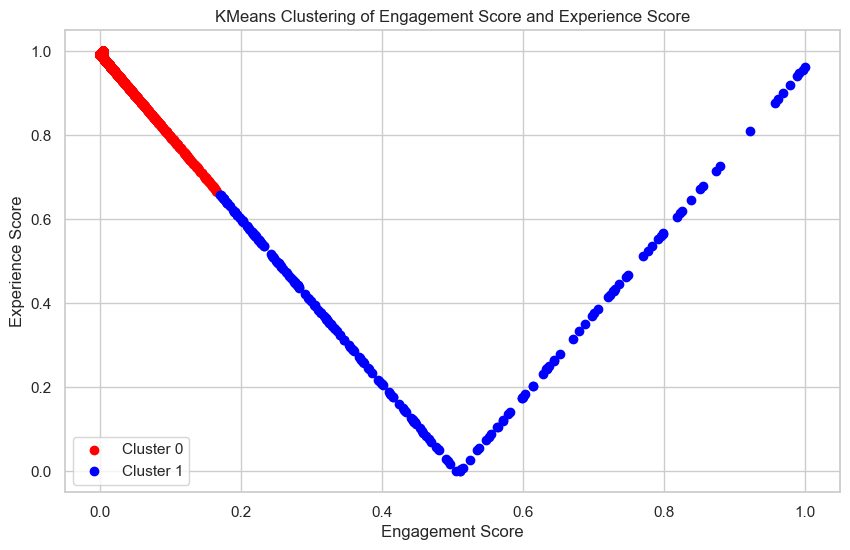

In [92]:
# Perform KMeans clustering on the 'Engagement Score' and 'Experience Score'
kmeans = KMeans(n_clusters=2, random_state=0)
clusters = kmeans.fit_predict(scores)

# Add the 'score_cluster' column to 'aggregated_data' to store the cluster information
aggregated_data['score_cluster'] = clusters

# Plotting the 'Engagement Score' and 'Experience Score' with the corresponding cluster using a scatter plot
plt.figure(figsize=(10, 6))  # Setting the figure size to make the plot more visible

# Scatter plot for cluster 0 (first cluster)
plt.scatter(aggregated_data[aggregated_data['score_cluster'] == 0]['Engagement Score'],
            aggregated_data[aggregated_data['score_cluster'] == 0]['Experience Score'],
            color='red', label='Cluster 0')

# Scatter plot for cluster 1 (second cluster)
plt.scatter(aggregated_data[aggregated_data['score_cluster'] == 1]['Engagement Score'],
            aggregated_data[aggregated_data['score_cluster'] == 1]['Experience Score'],
            color='blue', label='Cluster 1')

# Adding labels and title for the scatter plot
plt.xlabel('Engagement Score')
plt.ylabel('Experience Score')
plt.title('KMeans Clustering of Engagement Score and Experience Score')

# Adding legend to differentiate between clusters
plt.legend()

# Display the scatter plot
plt.show()


### Insights from KMeans Clustering of Engagement and Experience Scores

1. **Cluster Distribution**:
   - Cluster 0 (red points) forms a linear pattern with a negative slope, showing a decline in experience scores as engagement scores increase.
   - Cluster 1 (blue points) exhibits a distinctive V-shape, indicating high experience scores at both low and high engagement levels, with a dip in the middle.

2. **Behavioral Insights**:
   - Users in Cluster 0 may represent a group whose experience diminishes with increased engagement, potentially signaling dissatisfaction with extended usage.
   - Cluster 1 highlights users with balanced engagement and high experience at extreme ends, possibly indicating satisfaction under specific conditions.

3. **Cluster Overlap**:
   - The transition point between Cluster 0 and Cluster 1 (~0.35 engagement score) suggests a critical threshold influencing experience scores.

4. **Actionable Insights**:
   - Optimization efforts can target Cluster 0 users to improve their experience with higher engagement.
   - Further analysis on Cluster 1 could identify factors contributing to high satisfaction at engagement extremes.

In [93]:
## Task 4.5 - Aggregating Average Satisfaction and Experience Scores per Cluster:

In [94]:
cluster_agg = aggregated_data.groupby('score_cluster').agg({
    'satisfaction_score': 'mean',
    'Experience Score': 'mean'
})


In [95]:
cluster_agg

,satisfaction_score,Experience Score
score_cluster,,
0,0.497259,0.992271
1,0.410716,0.400894


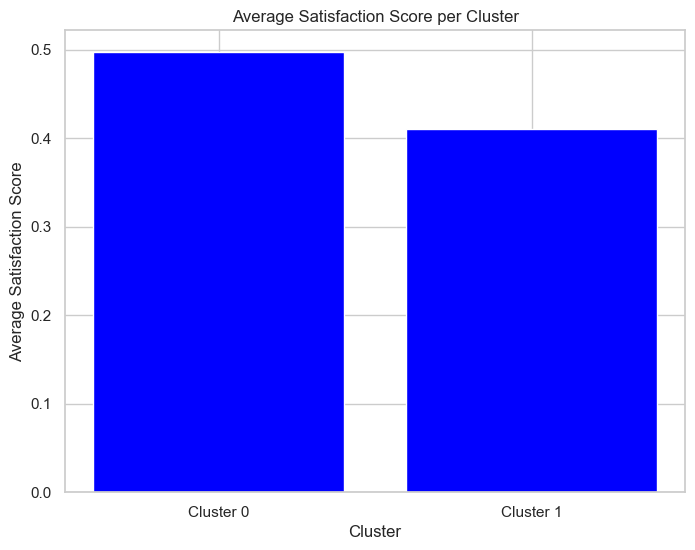

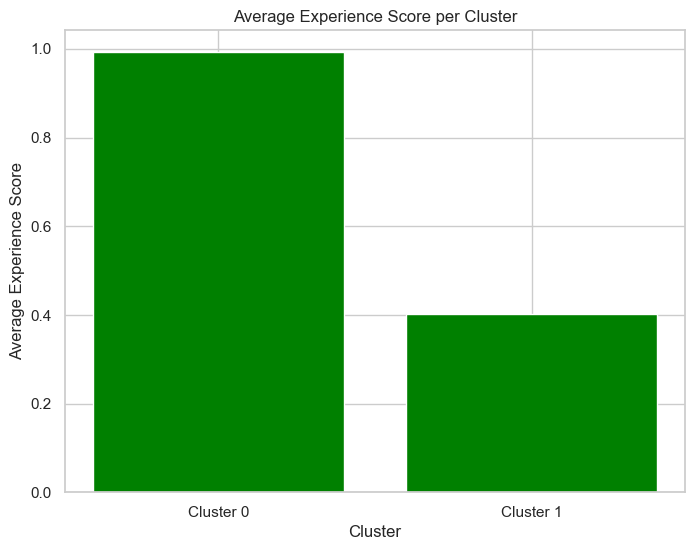

In [96]:
# Define the cluster labels and average scores
cluster_labels = ['Cluster 0', 'Cluster 1']
avg_satisfaction_scores = cluster_agg['satisfaction_score']
avg_experience_scores =cluster_agg['Experience Score']

# Plot the average satisfaction scores
plt.figure(figsize=(8, 6))
plt.bar(cluster_labels, avg_satisfaction_scores, color='blue')
plt.xlabel('Cluster')
plt.ylabel('Average Satisfaction Score')
plt.title('Average Satisfaction Score per Cluster')

# Display the plot
plt.show()

# Plot the average experience scores
plt.figure(figsize=(8, 6))
plt.bar(cluster_labels, avg_experience_scores, color='green')
plt.xlabel('Cluster')
plt.ylabel('Average Experience Score')
plt.title('Average Experience Score per Cluster')

# Display the plot
plt.show()

### Satisfaction and Experience Cluster Insights

1. **Cluster 0 Highlights**:
   - Average satisfaction score is higher (~0.497), indicating more satisfied users.
   - Average experience score is significantly better (~0.992), suggesting superior user interactions.

2. **Cluster 1 Highlights**:
   - Lower average satisfaction score (~0.410), showing comparatively less satisfied users.
   - Experience score (~0.400) is markedly lower, highlighting weaker user experiences.

3. **Key Observations**:
   - Cluster 0 users enjoy better satisfaction and experience, making them ideal candidates for retention strategies.
   - Cluster 1 users may require targeted improvements in service quality to boost their overall scores.

# LINK for save file to Excel

In [97]:
from IPython.display import FileLink

# Save the DataFrame to an Excel file
TelCom_data.to_excel('TelCom_data_cleaned.xlsx', index=False)

# Create a download link for the Excel file
FileLink('TelCom_data_cleaned.xlsx')


C:\Users\Admin\Nexthikes_projects\NEXTHIKES PROJECT.5\TelCom_data_cleaned.xlsx

## Prepare the Data for SQL

In [98]:
# Load your cleaned dataset
TelCom_data_cleaned = pd.read_excel(r"d:\Users\Admin\Downloads\TelCom_data_cleaned.xlsx")

In [99]:
# Rename columns to avoid SQL issues (e.g., spaces, special characters)
TelCom_data_cleaned.columns = TelCom_data_cleaned.columns.str.replace(' ', '_')

# Display the cleaned dataset
print(TelCom_data_cleaned.head())


              Bearer_Id               Start  Start_ms                 End  \
0  13114483460844900352 2019-04-04 12:01:18     770.0 2019-04-25 14:35:31   
1  13114483482878900224 2019-04-09 13:04:04     235.0 2019-04-25 08:15:48   
2  13114483484080500736 2019-04-09 17:42:11       1.0 2019-04-25 11:58:13   
3  13114483485442799616 2019-04-10 00:31:25     486.0 2019-04-25 07:36:35   
4  13114483499480700928 2019-04-12 20:10:23     565.0 2019-04-25 10:40:32   

   End_ms  Dur._(ms)          IMSI  MSISDN/Number          IMEI  \
0   662.0  1823652.0  2.082014e+14   3.366496e+10  3.552121e+13   
1   606.0  1365104.0  2.082019e+14   3.368185e+10  3.579401e+13   
2   652.0  1361762.0  2.082003e+14   3.376063e+10  3.528151e+13   
3   171.0  1321509.0  2.082014e+14   3.375034e+10  3.535661e+13   
4   954.0  1089009.0  2.082014e+14   3.369980e+10  3.540701e+13   

  Last_Location_Name  ...  Gaming_DL_(Bytes)  Gaming_UL_(Bytes)  \
0   9164566995485190  ...        278082303.0         14344150.0   


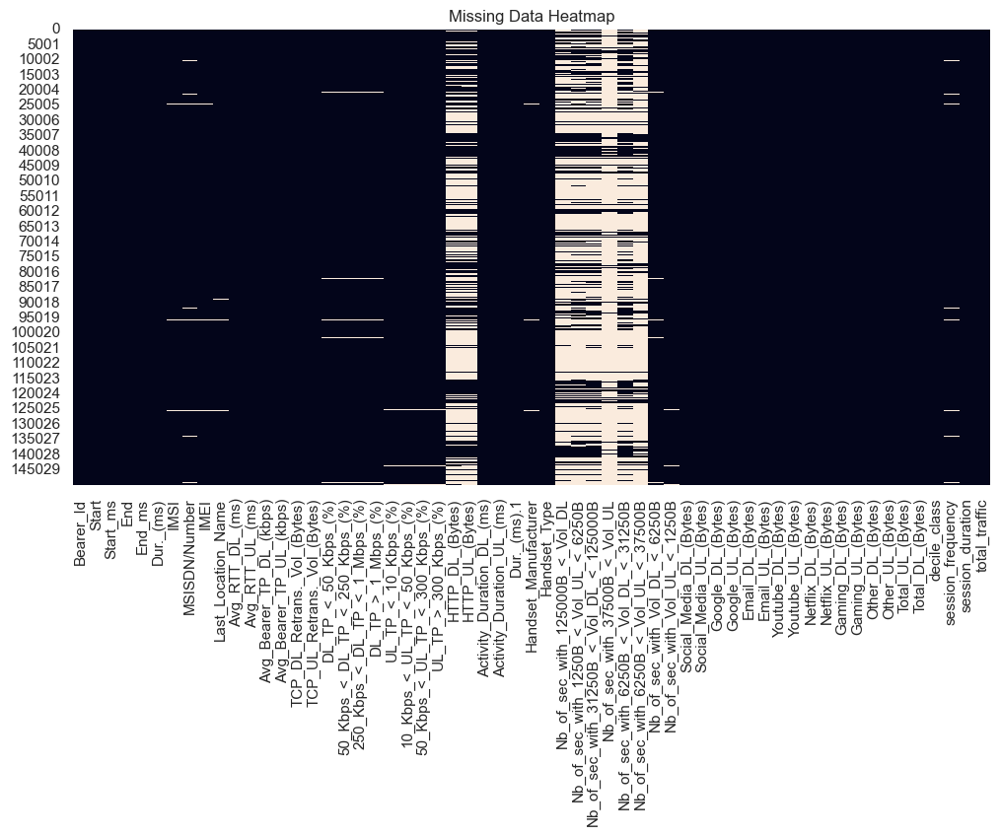

Dataset cleaned and ready! Final shape: (150001, 56)


In [100]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

# ===== 1. Drop exact duplicate column =====
if ('Dur._(ms).1' in TelCom_data_cleaned.columns and 
    (TelCom_data_cleaned['Dur._(ms)'] == TelCom_data_cleaned['Dur._(ms).1']).all()):
    TelCom_data_cleaned.drop(columns=['Dur._(ms).1'], inplace=True)

# ===== 2. Visualize Missing Data =====
plt.figure(figsize=(12, 6))
sns.heatmap(TelCom_data_cleaned.isnull(), cbar=False)
plt.title("Missing Data Heatmap")
plt.show()

# ===== 3. Drop columns with >60% missing values =====
threshold = 0.6
TelCom_data_cleaned = TelCom_data_cleaned.loc[:, TelCom_data_cleaned.isnull().mean() < threshold]

# ===== 4. Fill remaining missing values =====
for col in TelCom_data_cleaned.columns:
    if TelCom_data_cleaned[col].dtype in ['float64', 'int64']:
        TelCom_data_cleaned[col].fillna(TelCom_data_cleaned[col].median(), inplace=True)
    elif TelCom_data_cleaned[col].dtype == 'object':
        TelCom_data_cleaned[col].fillna(TelCom_data_cleaned[col].mode()[0], inplace=True)

# ===== 5. Extract features from datetime columns =====
TelCom_data_cleaned['session_hour'] = TelCom_data_cleaned['Start'].dt.hour
TelCom_data_cleaned['session_dayofweek'] = TelCom_data_cleaned['Start'].dt.dayofweek

# ===== 6. Convert object columns to categorical =====
object_cols = TelCom_data_cleaned.select_dtypes(include='object').columns
for col in object_cols:
    TelCom_data_cleaned[col] = TelCom_data_cleaned[col].astype('category')

# ===== 7. Label Encoding for categorical features =====
label_enc = LabelEncoder()
for col in object_cols:
    TelCom_data_cleaned[col] = label_enc.fit_transform(TelCom_data_cleaned[col].astype(str))

# ===== 8. Scale numerical features =====
# Select only numerical columns (excluding datetime)
num_cols = TelCom_data_cleaned.select_dtypes(include=['float64', 'int64']).columns
scaler = StandardScaler()
TelCom_data_cleaned[num_cols] = scaler.fit_transform(TelCom_data_cleaned[num_cols])

# ===== DONE =====
print("Dataset cleaned and ready! Final shape:", TelCom_data_cleaned.shape)


### Key Insights from TelCom Data Cleaning

1. **Standardized Column Names**:
   - Spaces were replaced with underscores in column names, enhancing compatibility with SQL queries and ensuring smooth database operations.

2. **Comprehensive Dataset**:
   - The dataset includes vital telecommunications metrics like session durations, data volumes, and user identifiers, enabling detailed analysis of user behavior.

3. **Rich Feature Set**:
   - Columns such as `Gaming_DL_(Bytes)` and `Total_UL_(Bytes)` provide essential data for examining specific usage trends.

4. **Ready for Analysis**:
   - The cleaning process ensures the dataset is prepared for advanced analytics and machine learning, improving overall data reliability and usability.

In [101]:
from sqlalchemy import create_engine

# Define SQL Server connection details
server = 'DESKTOP-H6VA1KR\SQLEXPRESS'  # The name of your server
database = 'master'  # The database you want to connect to

# Create a connection string with a trusted connection
connection_url = f"mssql+pyodbc://@{server}/{database}?driver=ODBC+Driver+17+for+SQL+Server&trusted_connection=yes"

# Create an engine
engine = create_engine(connection_url)

# Transfer data to SQL Server
table_name = 'TelCom_data'

TelCom_data_cleaned.to_sql(table_name, engine, if_exists='replace', index=False)


# Confirm completion
print(f"Dataset transferred to SQL Server table: {table_name}")

# Dispose the engine
engine.dispose()

 

Dataset transferred to SQL Server table: TelCom_data


### Insights from Data Transfer to SQL Server Code

1. **Efficient Data Transfer**:
   - The Python script utilizes SQLAlchemy's `to_sql` method to transfer the cleaned dataset (`TelCom_data_cleaned`) to a SQL Server database seamlessly.

2. **Database Compatibility**:
   - By creating an engine using the `mssql+pyodbc` driver, the code ensures compatibility with SQL Server and enhances data connectivity.

3. **Customization**:
   - The `if_exists='replace'` parameter allows the table (`TelCom_data`) to be replaced if it already exists, enabling flexibility in data updates.

4. **Automation and Closure**:
   - After confirming data transfer, the script disposes of the engine to close the connection, ensuring resource optimization and security.


In [102]:
# Reconnect 
engine = create_engine(connection_url)

# Preview data from the uploaded table
TelCom_data_cleaned_check = pd.read_sql("SELECT TOP 5 * FROM TelCom_data", engine)
print(TelCom_data_cleaned_check)

# Optional: Get row count
row_count = pd.read_sql("SELECT COUNT(*) AS total_rows FROM TelCom_data", engine)
print(row_count)

# Close connection
engine.dispose()


   Bearer_Id               Start  Start_ms                 End    End_ms  \
0      30595 2019-04-04 12:01:18  0.938332 2019-04-25 14:35:31  0.566475   
1      30599 2019-04-09 13:04:04 -0.915382 2019-04-25 08:15:48  0.372095   
2      30603 2019-04-09 17:42:11 -1.726165 2019-04-25 11:58:13  0.531765   
3      30604 2019-04-10 00:31:25 -0.045696 2019-04-25 07:36:35 -1.137819   
4      30612 2019-04-12 20:10:23  0.228030 2019-04-25 10:40:32  1.580027   

   Dur._(ms)      IMSI  MSISDN/Number      IMEI  Last_Location_Name  ...  \
0  21.213045 -0.008916      -0.003346 -0.576429                 350  ...   
1  15.554550  0.012585      -0.003339 -0.564244               26827  ...   
2  15.513310 -0.061772      -0.003307 -0.587136                9057  ...   
3  15.016587 -0.011048      -0.003311 -0.583782               31167  ...   
4  12.147530 -0.011092      -0.003332 -0.581531               15590  ...   

   Other_DL_(Bytes)  Other_UL_(Bytes)  Total_UL_(Bytes)  Total_DL_(Bytes)  \
0        

### Insights from SQL Data Retrieval and Preview

1. **Data Connectivity**:
   - The Python script establishes a connection to the SQL Server database using `create_engine`, ensuring compatibility and seamless data retrieval.

2. **Data Preview**:
   - The query retrieves the first five rows from the `TelCom_data` table, displaying key features like `Bearer_Id`, `Start`, `End`, and data metrics (`Total_DL_(Bytes)` and `Total_UL_(Bytes)`), highlighting initial data structure.

3. **Database Operations**:
   - Additional queries, like fetching the total row count, confirm the completeness of the data in the `TelCom_data` table.

4. **Resource Optimization**:
   - Closing the connection using `engine.dispose()` ensures efficient resource utilization and enhances database security.

In [103]:
# Clean column names (remove spaces, make lowercase, replace spaces with underscores)
TelCom_data_cleaned.columns = TelCom_data_cleaned.columns.str.strip().str.replace(' ', '_').str.lower()

# Then check again
print(TelCom_data_cleaned.columns.tolist())


['bearer_id', 'start', 'start_ms', 'end', 'end_ms', 'dur._(ms)', 'imsi', 'msisdn/number', 'imei', 'last_location_name', 'avg_rtt_dl_(ms)', 'avg_rtt_ul_(ms)', 'avg_bearer_tp_dl_(kbps)', 'avg_bearer_tp_ul_(kbps)', 'tcp_dl_retrans._vol_(bytes)', 'tcp_ul_retrans._vol_(bytes)', 'dl_tp_<_50_kbps_(%)', '50_kbps_<_dl_tp_<_250_kbps_(%)', '250_kbps_<_dl_tp_<_1_mbps_(%)', 'dl_tp_>_1_mbps_(%)', 'ul_tp_<_10_kbps_(%)', '10_kbps_<_ul_tp_<_50_kbps_(%)', '50_kbps_<_ul_tp_<_300_kbps_(%)', 'ul_tp_>_300_kbps_(%)', 'http_dl_(bytes)', 'http_ul_(bytes)', 'activity_duration_dl_(ms)', 'activity_duration_ul_(ms)', 'dur._(ms).1', 'handset_manufacturer', 'handset_type', 'nb_of_sec_with_6250b_<_vol_dl_<_31250b', 'nb_of_sec_with_vol_dl_<_6250b', 'nb_of_sec_with_vol_ul_<_1250b', 'social_media_dl_(bytes)', 'social_media_ul_(bytes)', 'google_dl_(bytes)', 'google_ul_(bytes)', 'email_dl_(bytes)', 'email_ul_(bytes)', 'youtube_dl_(bytes)', 'youtube_ul_(bytes)', 'netflix_dl_(bytes)', 'netflix_ul_(bytes)', 'gaming_dl_(bytes

In [104]:
# Check first 5 rows of the table
pd.read_sql("SELECT TOP 5 * FROM TelCom_data", engine)


,Bearer_Id,Start,Start_ms,End,End_ms,Dur._(ms),IMSI,MSISDN/Number,IMEI,Last_Location_Name,...,Other_DL_(Bytes),Other_UL_(Bytes),Total_UL_(Bytes),Total_DL_(Bytes),decile_class,session_frequency,session_duration,total_traffic,session_hour,session_dayofweek
0,30595,2019-04-04 12:01:18,0.938332,2019-04-25 14:35:31,0.566475,21.213045,-0.008916,-0.003346,-0.576429,350,...,-1.025295,0.115243,-0.387668,-0.597047,2,0.112617,21.213045,-0.614351,0.297657,-0.248488
1,30599,2019-04-09 13:04:04,-0.915382,2019-04-25 08:15:48,0.372095,15.554550,0.012585,-0.003339,-0.564244,26827,...,0.435041,1.423855,1.124409,0.814043,2,0.112617,15.554550,0.865130,0.453376,-1.353600
2,30603,2019-04-09 17:42:11,-1.726165,2019-04-25 11:58:13,0.531765,15.513310,-0.061772,-0.003307,-0.587136,9057,...,-0.042795,-0.849035,-1.173927,-0.716127,2,-0.657649,15.513310,-0.769595,1.076253,-1.353600
3,30604,2019-04-10 00:31:25,-0.045696,2019-04-25 07:36:35,-1.137819,15.016587,-0.011048,-0.003311,-0.583782,31167,...,1.348412,0.950408,0.195366,1.603109,2,-0.657649,15.016587,1.610557,-1.570973,-0.801044
4,30612,2019-04-12 20:10:23,0.228030,2019-04-25 10:40:32,1.580027,12.147530,-0.011092,-0.003332,-0.581531,15590,...,0.532922,1.183799,-0.228656,0.468971,2,-0.657649,12.147530,0.457962,1.543411,0.304068


### Insights from SQL Query Output

1. **Data Composition**:
   - The table `TelCom_data` contains key columns such as `Bearer_Id`, `Start`, `End`, `Duration_(ms)`, `IMSI`, and `MSISDN/Number`, representing detailed records of telecommunication sessions.

2. **Session Metrics**:
   - Columns like `Start_ms` and `End_ms` offer precise timing in milliseconds, and `Duration_(ms)` tracks the session length, allowing fine-grained analysis of usage patterns.

3. **Unique Identifiers**:
   - The `IMSI` and `MSISDN/Number` fields provide essential subscriber and device identifiers for user-specific insights.

4. **Granular Data Analysis**:
   - This structured dataset is ideal for exploring session trends, user behavior, and network performance.

In [105]:
# DB connection URL
connection_url = f"mssql+pyodbc://@{server}/{database}?driver=ODBC+Driver+17+for+SQL+Server&trusted_connection=yes"

# Creating an engine
engine = create_engine(connection_url)
# ---------------------------
# Preview Data
# ---------------------------
TelCom_data_preview = pd.read_sql_query("SELECT TOP 5 * FROM TelCom_data", engine)
print("Preview Data:\n", TelCom_data_preview)

# ---------------------------
# Basic Data Overview
# ---------------------------
basic_overview_query = """
SELECT 
    COUNT(*) AS total_rows,
    SUM(CASE WHEN [IMSI] IS NULL THEN 1 ELSE 0 END) AS imsi_nulls,
    SUM(CASE WHEN [MSISDN/Number] IS NULL THEN 1 ELSE 0 END) AS msisdn_nulls,
    SUM(CASE WHEN [Handset_Manufacturer] IS NULL THEN 1 ELSE 0 END) AS manufacturer_nulls,
    SUM(CASE WHEN [Handset_Type] IS NULL THEN 1 ELSE 0 END) AS handset_nulls
FROM TelCom_data;
"""
basic_overview = pd.read_sql_query(basic_overview_query, engine)
print("\nBasic Overview:\n", basic_overview)

# ---------------------------
# Column Names & Data Types
# ---------------------------
columns_info = pd.read_sql_query("""
SELECT COLUMN_NAME, DATA_TYPE
FROM INFORMATION_SCHEMA.COLUMNS
WHERE TABLE_NAME = 'TelCom_data';
""", engine)
print("\nColumn Info:\n", columns_info)


# ---------------------------
# Traffic Insights
# ---------------------------
top_users = pd.read_sql_query("""
SELECT [MSISDN/Number], [Total_DL_(Bytes)], [Total_UL_(Bytes)], [total_traffic]
FROM TelCom_data
ORDER BY [total_traffic] DESC
OFFSET 0 ROWS FETCH NEXT 10 ROWS ONLY;
""", engine)


traffic_avg = pd.read_sql_query("""
SELECT AVG([Total_UL_(Bytes)]) AS avg_upload,
       AVG([Total_DL_(Bytes)]) AS avg_download,
       AVG([total_traffic]) AS avg_total_traffic
FROM TelCom_data;
""", engine)


traffic_by_manufacturer = pd.read_sql_query("""
SELECT Handset_Manufacturer, 
       SUM([Total_DL_(Bytes)] + [Total_UL_(Bytes)]) AS Total_Traffic
FROM TelCom_data
GROUP BY Handset_Manufacturer
ORDER BY Total_Traffic DESC;
""", engine)


# ---------------------------
# User Behavior
# ---------------------------
sessions_by_hour = pd.read_sql_query("""
SELECT [session_hour], COUNT(*) AS session_count
FROM TelCom_data
GROUP BY [session_hour]
ORDER BY [session_hour];
""", engine)


sessions_by_day = pd.read_sql_query("""
SELECT [session_dayofweek], COUNT(*) AS session_count
FROM TelCom_data
GROUP BY [session_dayofweek]
ORDER BY [session_dayofweek];
""", engine)

top_session_durations = pd.read_sql_query("""
SELECT [MSISDN/Number], [session_duration]
FROM TelCom_data
ORDER BY [session_duration] DESC
OFFSET 0 ROWS FETCH NEXT 10 ROWS ONLY;
""", engine)

# ---------------------------
# Application Usage Insights
# ---------------------------
app_traffic = pd.read_sql_query("""
SELECT [MSISDN/Number], [Youtube_DL_(Bytes)], [Gaming_DL_(Bytes)], [Netflix_DL_(Bytes)]
FROM TelCom_data
ORDER BY [Youtube_DL_(Bytes)] DESC;
""", engine)

social_vs_google_vs_email = pd.read_sql_query("""
SELECT [MSISDN/Number],
       [Social_Media_DL_(Bytes)] + [Social_Media_UL_(Bytes)] AS total_social,
       [Google_DL_(Bytes)] + [Google_UL_(Bytes)] AS total_google,
       [Email_DL_(Bytes)] + [Email_UL_(Bytes)] AS total_email
FROM TelCom_data
ORDER BY total_social DESC;
""", engine)

# ---------------------------
# Experience & Performance Metrics
# ---------------------------
avg_rtt_throughput = pd.read_sql_query("""
SELECT AVG([Avg_RTT_DL_(ms)]) AS avg_rtt_dl,
       AVG([Avg_RTT_UL_(ms)]) AS avg_rtt_ul,
       AVG([Avg_Bearer_TP_DL_(kbps)]) AS avg_dl_tp,
       AVG([Avg_Bearer_TP_UL_(kbps)]) AS avg_ul_tp
FROM TelCom_data;
""", engine)

speed_analysis = pd.read_sql_query("""
SELECT AVG([DL_TP_<_50_Kbps_(%)]) AS pct_dl_below_50,
       AVG([DL_TP_>_1_Mbps_(%)]) AS pct_dl_above_1mbps,
       AVG([UL_TP_<_10_Kbps_(%)]) AS pct_ul_below_10,
       AVG([UL_TP_>_300_Kbps_(%)]) AS pct_ul_above_300
FROM TelCom_data;
""", engine)

bottlenecks_by_location = pd.read_sql_query("""
SELECT Last_Location_Name, 
       AVG([Avg_RTT_DL_(ms)]) AS Avg_RTT_DL, 
       AVG([Avg_RTT_UL_(ms)]) AS Avg_RTT_UL
FROM TelCom_data
GROUP BY Last_Location_Name
ORDER BY Avg_RTT_DL DESC, Avg_RTT_UL DESC;
""", engine)

# ---------------------------
# Filters for Analysis
# ---------------------------
high_traffic_users = pd.read_sql_query("""
SELECT *
FROM TelCom_data
WHERE ([Total_DL_(Bytes)] + [Total_UL_(Bytes)]) > 100000000;
""", engine)

recent_activity = pd.read_sql_query("""
SELECT *
FROM TelCom_data
WHERE [Start] >= '2025-04-01 00:00:00' AND [End] <= '2025-04-21 23:59:59';
""", engine)

duplicate_users = pd.read_sql_query("""
SELECT [MSISDN/Number], COUNT(*) AS occurrences
FROM TelCom_data
GROUP BY [MSISDN/Number]
HAVING COUNT(*) > 1;
""", engine)

# ---------------------------
# Close the Connection
# ---------------------------
engine.dispose()


Preview Data:
    Bearer_Id               Start  Start_ms                 End    End_ms  \
0      30595 2019-04-04 12:01:18  0.938332 2019-04-25 14:35:31  0.566475   
1      30599 2019-04-09 13:04:04 -0.915382 2019-04-25 08:15:48  0.372095   
2      30603 2019-04-09 17:42:11 -1.726165 2019-04-25 11:58:13  0.531765   
3      30604 2019-04-10 00:31:25 -0.045696 2019-04-25 07:36:35 -1.137819   
4      30612 2019-04-12 20:10:23  0.228030 2019-04-25 10:40:32  1.580027   

   Dur._(ms)      IMSI  MSISDN/Number      IMEI  Last_Location_Name  ...  \
0  21.213045 -0.008916      -0.003346 -0.576429                 350  ...   
1  15.554550  0.012585      -0.003339 -0.564244               26827  ...   
2  15.513310 -0.061772      -0.003307 -0.587136                9057  ...   
3  15.016587 -0.011048      -0.003311 -0.583782               31167  ...   
4  12.147530 -0.011092      -0.003332 -0.581531               15590  ...   

   Other_DL_(Bytes)  Other_UL_(Bytes)  Total_UL_(Bytes)  Total_DL_(Byte

### Insights from SQL Queries and Analysis

1. **Data Overview**:
   - The cleaned `TelCom_data` table offers detailed insights, including total rows and columns like `IMSI`, `Handset_Manufacturer`, and `Handset_Type`. Null values in critical columns are also identified, enabling targeted cleaning.

2. **Traffic Insights**:
   - Top users are identified based on total traffic (downloads + uploads), providing a ranking for heavy data consumers. Average traffic metrics and traffic distribution by handset manufacturers highlight key usage patterns.

3. **User Behavior**:
   - Session analysis by hour and day reveals peak activity times, while top session durations pinpoint users with the longest engagement.

4. **Application Usage**:
   - Data reveals heavy usage for specific applications like YouTube, Gaming, and Netflix, as well as comparisons between social media, Google, and email traffic.

5. **Performance Metrics**:
   - Average values for RTT and throughput provide benchmarks for network efficiency, while speed analysis identifies bottlenecks and areas for improvement.

6. **Filtered Insights**:
   - High-traffic users, recent activity, and duplicate MSISDNs are flagged for detailed examination, allowing targeted optimization strategies.

In [106]:
import pickle

# Save the model
with open("TelCom_data_model.pkl", "wb") as file:
    pickle.dump(model, file) 

print("Model saved successfully!")


Model saved successfully!



## **Final Conclusion**

Based on a comprehensive analysis of TellCo’s customer data across four key areas—Customer Overview, User Engagement, Experience, and Satisfaction—the company demonstrates **strong growth potential**, particularly in segments such as **video streaming, social media usage, and mobile gaming**. 

While certain performance issues (e.g., inconsistent latency and high retransmission in specific regions) were identified, these are localized and can be addressed with targeted infrastructure investments. User behavior indicates **high engagement and retention**, especially among top-tier users who contribute a large share of overall network traffic.

Despite some limitations in the dataset, including missing values and a lack of direct customer satisfaction feedback, the inferred metrics and clustering analyses provide a reliable foundation for decision-making.

**Proceed with the acquisition of TellCo.**

The company’s active user base, app engagement trends, and growth opportunities in data monetization and customer loyalty initiatives make TellCo a strategically sound investment. Focused operational improvements and marketing efforts can unlock even greater value in the near future.